In [ ]:
Name: Vijaya.Rachakonda

Course: Online Session-CCE IIT M-DS-AI-BC=223010 B2

Project Name: Mandatory_Project (Datasets:1.-Walmart, 2.-Online Retaile)

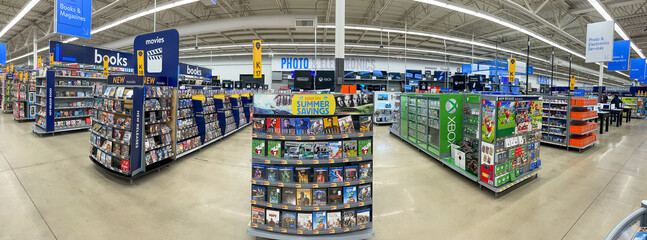

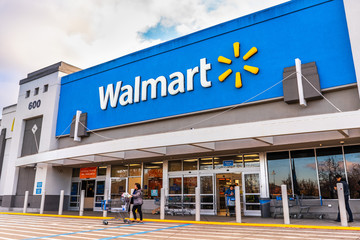

# A.Problem Statement 1:
A retail store that has multiple outlets across the country are facing issues in managing the inventory - to match the demand with respect to supply. You are a data scientist, who has to come up with useful insights using the data and make prediction models to forecast the sales for X number of months/years.


#  Dataset Information:
The walmart.csv contains 6435 rows and 8 columns.

Feature Name ----------- Description

Store ---------- Store number

Date ------------ Week of Sales

Weekly_Sales ----------- Sales for the given store in that week

Holiday_Flag ----------If it is a holiday week

Temperature ---------------- Temperature on the day of the sale

Fuel_Price --------------- Cost of the fuel in the region

CPI --------------------- Consumer Price Index

Unemployment ----------------- Unemployment Rate



# 1. Using the above data, come up with useful insights that can be used by each of the stores to improve in various areas.
   By using the weekly sales data for their various outlets.I  Used statistical analysis, EDA, outlier analysis, and handle the missing values to come up with various insights that can give them a clear perspective on the following:
   
   a. If the weekly sales are affected by the unemployment rate, if yes -which stores are suffering the most?
   
   b. If the weekly sales show a seasonal trend, when and what could be the reason?

   c. Does temperature affect the weekly sales in any manner?
    
   d. How is the Consumer Price index affecting the weekly sales of various stores?
    
   e. Top performing stores according to the historical data.

   f.The worst performing store, and how significant is the difference between the highest and lowest performing stores.

# B. Project Objective:
Project Objective: The objective of this project is to provide useful insights through data analysis and develop predictive models to forecast sales for the retail store over a specific timeframe (X number of months/years).

# *.Problem Statement ---What will we solve?

We will solve the problem of predicitng future demand for sales of different Walmart stores, based on the provided data by the organsation. We will need to identify what data is helping the models, vs causing worse predicitons and adjust the data accordingly.

# *. How we will solve it?

We will use the data provided by the organsation, clean it up so we can use it in our models. Then create demand predictions

The intended solution will be based on the test.csv dataset for our demand predictions, where our machine learning algortihms will give use results which have taken the different features from the other datasets to give us good predictions of future demand.

# Model Evaluation and Techniques:

    Metrics:
        In this section, you will need to clearly define the metrics or calculations you will use to measure performance of a model or result in our project. These calculations and metrics should be justified based on the characteristics of the problem and problem domain.

    Ways to evalute the different models will be the following statistical measures of how accuracy and robustness; Accuracy: Mean Absolute Error (MAE) — Measure the mean absolute errors. The smaller the number is (closer to 0), the better.

- Mean Squared Error (MSE) — 
        It measures the average of the squares of the errors. The smaller the number is (closer to 0), the better.

- Root Mean Squared Error (RMSE) — 
        the square root of the variance, known as the standard error. The smaller the number is (closer to 0), the better.

 -   Robustness: Model robustness refers to the degree that a model's performance changes when using new data versus training data.

  -  R-square (R²) — 
        It is for model robustness. The smaller the number is (closer to 0), the better.

# Importing neccesary libraries:

In [2]:
!pip install pandas-profiling
! pip install ipywidgets


[notice] A new release of pip is available: 23.2.1 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from matplotlib import dates
from datetime import datetime
import sklearn

# Dataset Walmart.csv Reading:

In [5]:
walmart=pd.read_csv('walmart.csv')
walmart.head(2)

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106


In [6]:
walmart.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


# C. Data Description:
The features of the dataset was provided by Walmart :


# Store:
The store number — This feature will be used for linking each other feature to the parent store to see if any linkage is find such as size etc.



# Date:
the week — The date feature keeps the data in alignment so we compare the correct datapoints to eachother. However, we must note that it is very common that dates are in a string format, which was the case here, where we would change the data type into datetype format (Python Software Foundation, 2002) to handle the complex nature of dates and time.




# Temperature:
average temperature in the region — The reason for including the temperature in this analysis is to see if perhaps we can find a postitive or negative relationship between how much people buy depending on how warm it is that week. For example it could be that on extremely hot weeks, people only buy a limited amount of products which relate to simply making handle the warmth itself. Thereby only buying ice cream. However, with the Data Scientist, Machine Learning Engineer or good old fashioned satatistician approach: we never assume, we test and find statistical significant measurments that indicate as such before any assumptions are made.


# Fuel_Price:
cost of fuel in the region — This feature of cost of fuel in the region will be tested in a similar sense as the “temperature” feature meentioned above. For example it could be the theoretical case that people don’t go to walmart if the fuel price is getting to high as for some the transportation cost might be more. In a sense, this seems unlikely as it seems like walmart is a store you can travel longer distances as you’ll still “save” money with the overall low prices they provide on their products. Still, this needs to be tested to verify our hypothesis.



# CPI, the consumer price index —
The CPI measures the average price trend for the entire private domestic consumption based on prices consumers actually pay. This can potentially be used for identifying trends to assist in the overall predicitons, but we must test this.



# Unemployment: the unemployment rate —
The idea of Walmart including the unemployment rate is a nice idea. It could be the case that with fewer people unemployed, the more money they have, therefore more money can be spent on walmarts products. But it could also be the case that with a high unemployment, people tends to go to target as they have a lower pricing strategy than their competitiors where people will buy their essentials at Walmart instead of a more expenisve local stors.



# D. Data Pre-processing Steps and Inspiration:
Outline the steps taken to preprocess the data, including cleaning, handling missing values, feature engineering, and any other necessary transformations. Describe the factors that influenced the choice of preprocessing techniques.

# Exploratory Data Analysis (EDA):
Check data types, missing values, and handle them

Explore numerical variables (e.g., Quantity, Price)

Analyze categorical variables (e.g., Country)

In [7]:
from pandas_profiling import ProfileReport
profile = ProfileReport(walmart)
profile

C:\Users\vijay\AppData\Local\Temp\ipykernel_16588\1156010541.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Preprocessing of Data:¶

# Handle the missing values:
there were Zero null values.

In [9]:
walmart.isna().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

# Outlier analysis::

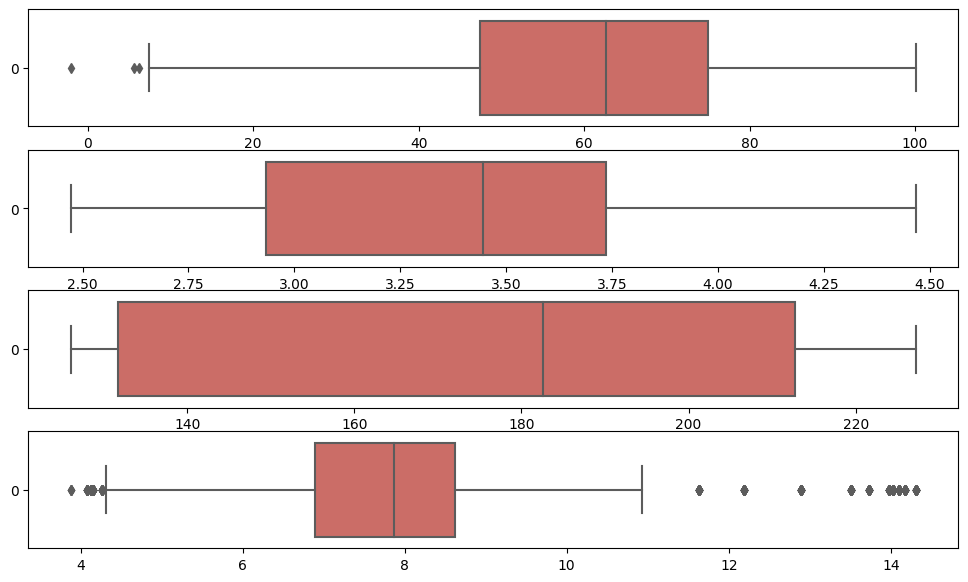

In [10]:
fig,axis=plt.subplots(4,figsize=(12,7))
S1=walmart[['Temperature','Fuel_Price','CPI','Unemployment']]

for i,column in enumerate(S1):
    sns.boxplot(walmart[column],ax=axis[i], palette='hls',dodge=True,
    fliersize=5,
    linewidth=None,orient='h',
    saturation=0.75,
    width=0.8)
    
import warnings
warnings.filterwarnings('ignore')


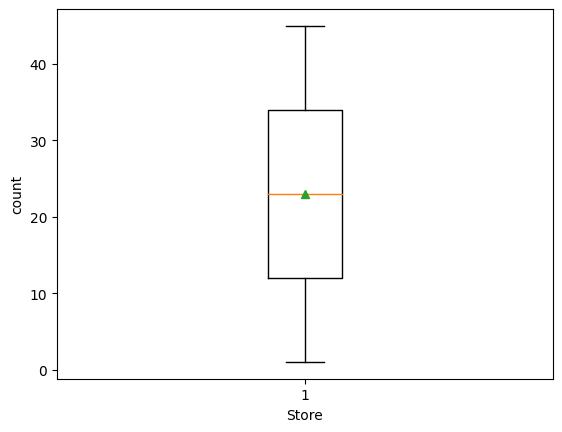

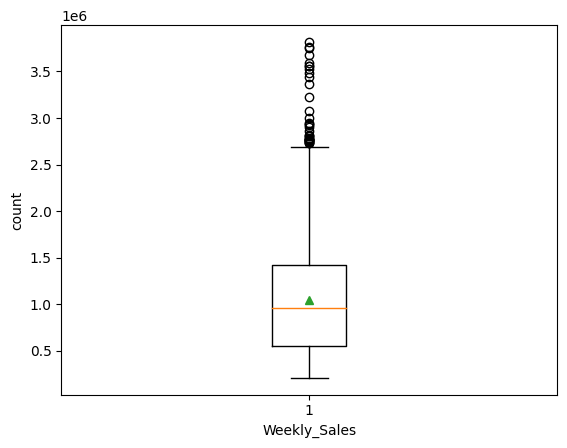

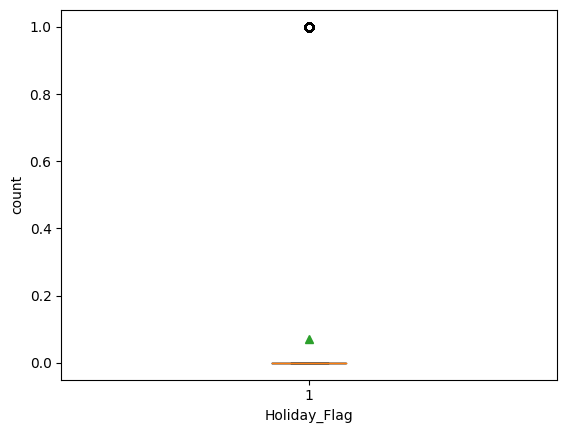

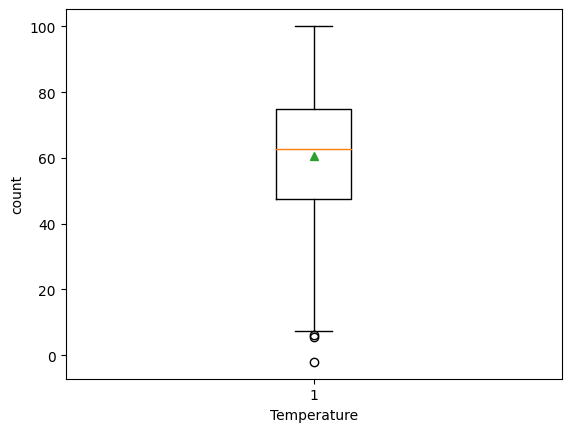

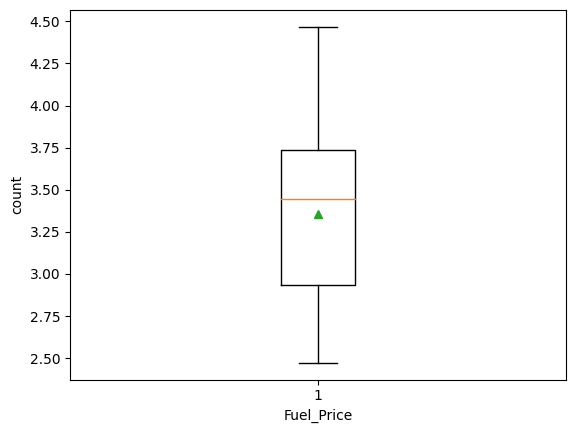

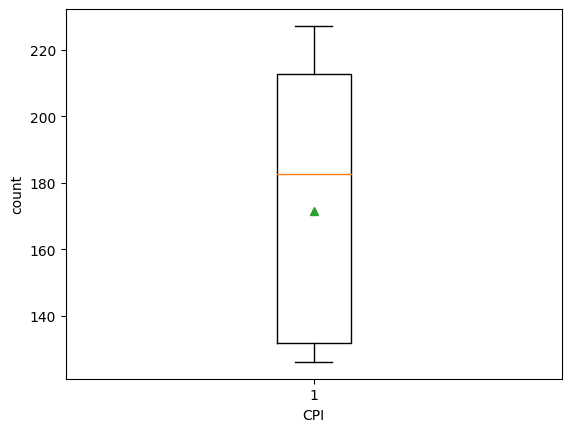

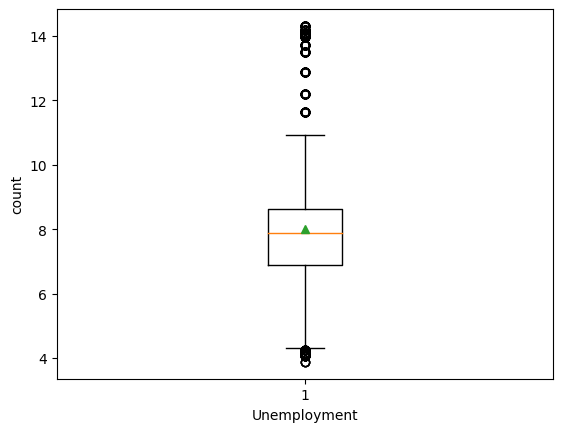

In [11]:
for i in walmart.columns:
    if(walmart[i].dtypes=='int64' or walmart[i].dtypes=='float64'):
        plt.boxplot(walmart[i],showmeans=True)
        plt.xlabel(i)
        plt.ylabel('count')
        plt.show()

# Dropping the outliers:

In [12]:
Q1 = walmart.Weekly_Sales.quantile(0.25)
Q3 = walmart.Weekly_Sales.quantile(0.75)
IQR = Q3 - Q1
walmart = walmart[(walmart.Weekly_Sales >= Q1 - 1.5*IQR) & (walmart.Weekly_Sales <= Q3 + 1.5*IQR)]

Q1 = walmart.Holiday_Flag.quantile(0.25)
Q3 = walmart.Holiday_Flag.quantile(0.75)
IQR = Q3 - Q1
walmart = walmart[(walmart.Holiday_Flag >= Q1 - 1.5*IQR) & (walmart.Holiday_Flag <= Q3 + 1.5*IQR)]

Q1 = walmart.Temperature.quantile(0.25)
Q3 = walmart.Temperature.quantile(0.75)
IQR = Q3 - Q1
walmart = walmart[(walmart.Temperature >= Q1 - 1.5*IQR) & (walmart.Temperature <= Q3 + 1.5*IQR)]
Q1 = walmart.CPI.quantile(0.25)
Q3 = walmart.CPI.quantile(0.75)
IQR = Q3 - Q1
walmart = walmart[(walmart.CPI >= Q1 - 1.5*IQR) & (walmart.CPI <= Q3 + 1.5*IQR)]

Q1 = walmart.Unemployment.quantile(0.25)
Q3 = walmart.Unemployment.quantile(0.75)
IQR = Q3 - Q1
walmart = walmart[(walmart.Unemployment >= Q1 - 1.5*IQR) & (walmart.Unemployment <= Q3 + 1.5*IQR)]


# Checking for outliers: After droping them:

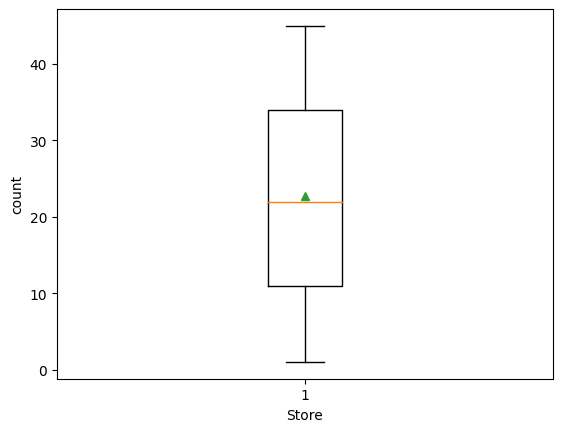

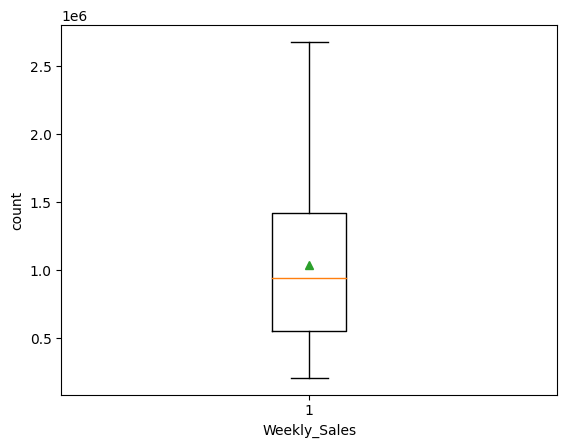

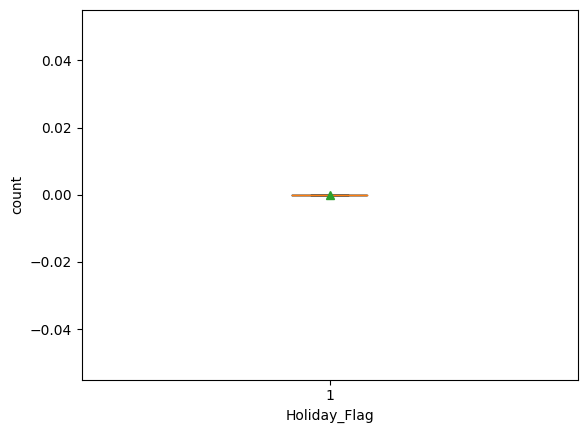

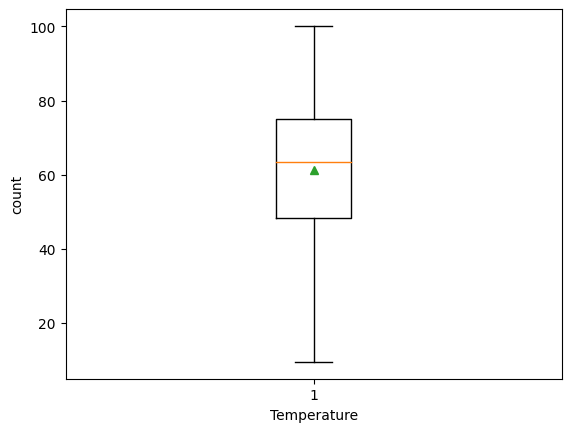

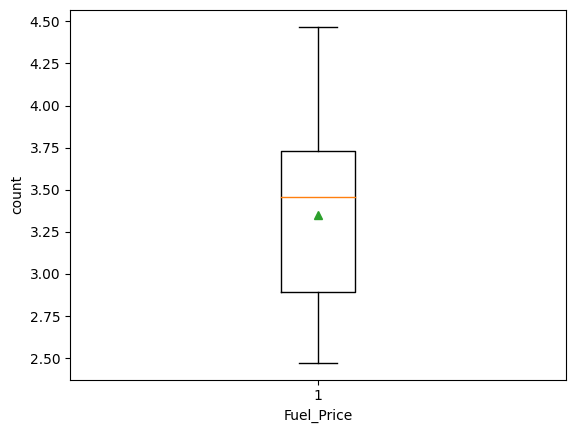

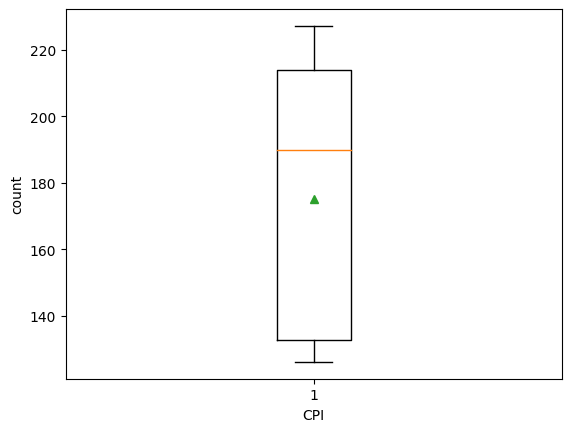

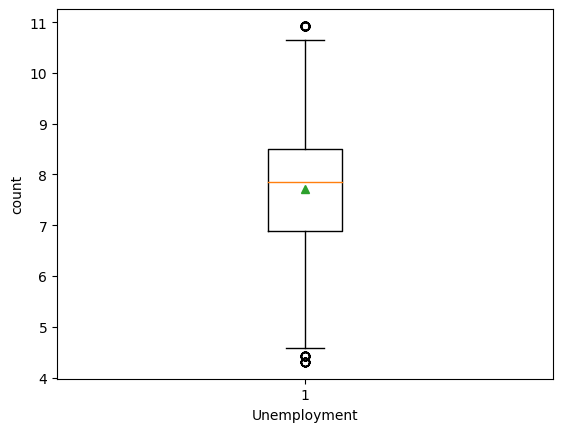

In [13]:
for i in walmart.columns:
    if(walmart[i].dtypes=='int64' or walmart[i].dtypes=='float64'):
        plt.boxplot(walmart[i],showmeans=True)
        plt.xlabel(i)
        plt.ylabel('count')
        plt.show()

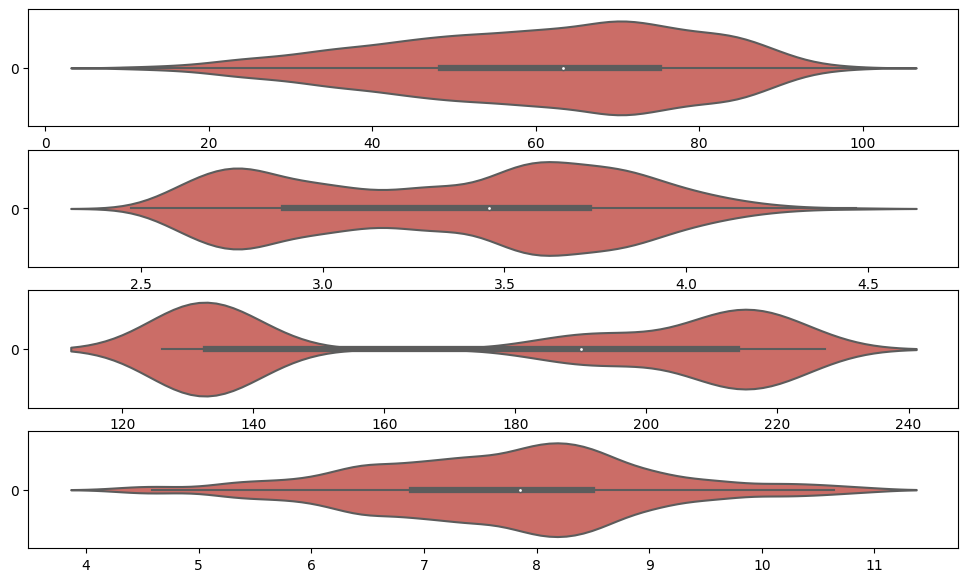

In [14]:
fig,axis=plt.subplots(4,figsize=(12,7))
S1=walmart[['Temperature','Fuel_Price','CPI','Unemployment']]

for i,column in enumerate(S1):
    ax=sns.violinplot(walmart[column],ax=axis[i],title=True, palette='hls',dodge=True,
    fliersize=5,
    linewidth=None,orient='h',
    saturation=0.75,
    width=0.8)
    #ax.set_xticklabels(walmart[column])
    
import warnings
warnings.filterwarnings('ignore')


# Statistical Analysis:

In [16]:
walmart.describe(include='all')

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,5507.000000,5507,5.507000e+03,5507.0,5507.000000,5507.000000,5507.000000,5507.000000
unique,NaN,133,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,05-02-2010,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,42,NaN,NaN,NaN,NaN,NaN,NaN
mean,22.788814,NaN,1.035725e+06,0.0,61.230821,3.350147,175.023995,7.718470
std,13.092433,NaN,5.492936e+05,0.0,17.971288,0.460119,39.038267,1.243988
min,1.000000,NaN,2.099862e+05,0.0,9.510000,2.472000,126.064000,4.308000
25%,11.000000,NaN,5.511051e+05,0.0,48.455000,2.895000,132.761933,6.891000
50%,22.000000,NaN,9.439128e+05,0.0,63.350000,3.459000,189.936850,7.852000
75%,34.000000,NaN,1.422573e+06,0.0,75.100000,3.732000,213.843625,8.494000


# changing the Date formate:

In [17]:
walmart['Date'] = pd.to_datetime(walmart['Date'], dayfirst=True)
walmart.head(2)

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106


In [18]:
#Creating year,month and days columns:
walmart['Days']=pd.DatetimeIndex(walmart['Date']).day
walmart['month']=pd.DatetimeIndex(walmart['Date']).month
walmart['year']=pd.DatetimeIndex(walmart['Date']).year
walmart.columns

Index(['Store', 'Date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature',
       'Fuel_Price', 'CPI', 'Unemployment', 'Days', 'month', 'year'],
      dtype='object')

In [19]:
walmart.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5507 entries, 0 to 6434
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         5507 non-null   int64         
 1   Date          5507 non-null   datetime64[ns]
 2   Weekly_Sales  5507 non-null   float64       
 3   Holiday_Flag  5507 non-null   int64         
 4   Temperature   5507 non-null   float64       
 5   Fuel_Price    5507 non-null   float64       
 6   CPI           5507 non-null   float64       
 7   Unemployment  5507 non-null   float64       
 8   Days          5507 non-null   int32         
 9   month         5507 non-null   int32         
 10  year          5507 non-null   int32         
dtypes: datetime64[ns](1), float64(5), int32(3), int64(2)
memory usage: 580.8 KB


# changing the data type to int type

In [20]:
walmart['Fuel_Price']=walmart['Fuel_Price'].astype(int)
walmart['Days']=walmart['Days'].astype(int)
walmart['month']=walmart['month'].astype(int)
walmart['year']=walmart['year'].astype(int)
walmart.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5507 entries, 0 to 6434
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         5507 non-null   int64         
 1   Date          5507 non-null   datetime64[ns]
 2   Weekly_Sales  5507 non-null   float64       
 3   Holiday_Flag  5507 non-null   int64         
 4   Temperature   5507 non-null   float64       
 5   Fuel_Price    5507 non-null   int32         
 6   CPI           5507 non-null   float64       
 7   Unemployment  5507 non-null   float64       
 8   Days          5507 non-null   int32         
 9   month         5507 non-null   int32         
 10  year          5507 non-null   int32         
dtypes: datetime64[ns](1), float64(4), int32(4), int64(2)
memory usage: 559.3 KB


# Distibution of Attributes:

<Figure size 4000x2000 with 0 Axes>

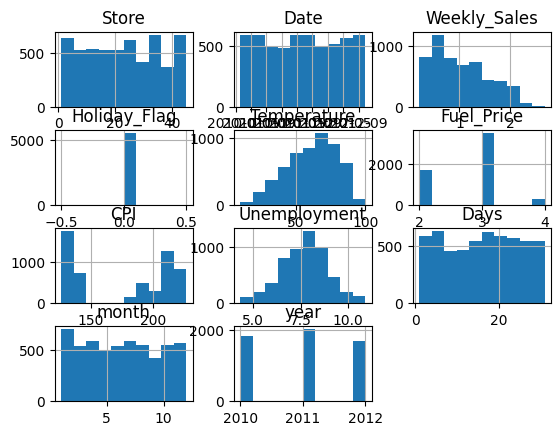

In [24]:
#histograms distibution of the data with respect to the features.
plt.figure(figsize=(40,20))
walmart.hist()
plt.show()

<Figure size 3000x1500 with 0 Axes>

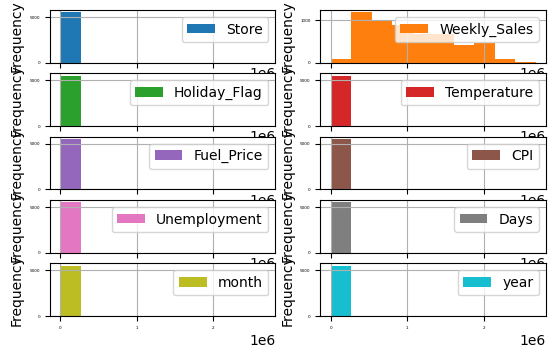

In [28]:
#Frequency plot:
plt.figure(figsize=(30,15))
walmart.plot(kind='hist',subplots=True,grid=True,layout=(6,2),fontsize=3)
plt.title('Fequency of the Attributes',fontsize=5)
plt.show()


<Axes: xlabel='Weekly_Sales', ylabel='Temperature'>

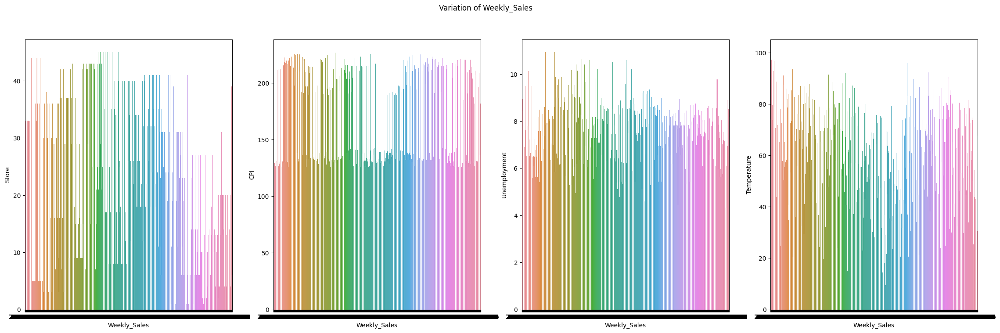

In [29]:
fig, axes = plt.subplots(1, 4, figsize=(28,8))

fig.suptitle('Variation of Weekly_Sales')

sns.barplot(ax=axes[0], data=walmart, y='Store', x='Weekly_Sales')
sns.barplot(ax=axes[1], data=walmart, y='CPI', x='Weekly_Sales')

sns.barplot(ax=axes[2], data=walmart, y='Unemployment', x='Weekly_Sales')
sns.barplot(ax=axes[3], data=walmart, y='Temperature', x='Weekly_Sales')


In [30]:
walmart['Store'].nunique()

45

# No.of Unique Values in walmart data:

In [31]:
print(f"there are {walmart.shape[0]} rows")

print(f"the date is from {min(walmart.Date)} to {max(walmart.Date)}")

for name in walmart.columns:
    print(f"column {name} has {len(set(walmart.loc[:,name]))} unique values")

there are 5507 rows
the date is from 2010-02-05 00:00:00 to 2012-10-26 00:00:00
column Store has 45 unique values
column Date has 133 unique values
column Weekly_Sales has 5507 unique values
column Holiday_Flag has 1 unique values
column Temperature has 3210 unique values
column Fuel_Price has 3 unique values
column CPI has 1994 unique values
column Unemployment has 333 unique values
column Days has 31 unique values
column month has 12 unique values
column year has 3 unique values


# Cheking Corelation between Atributes in the walmart data:

<Axes: >

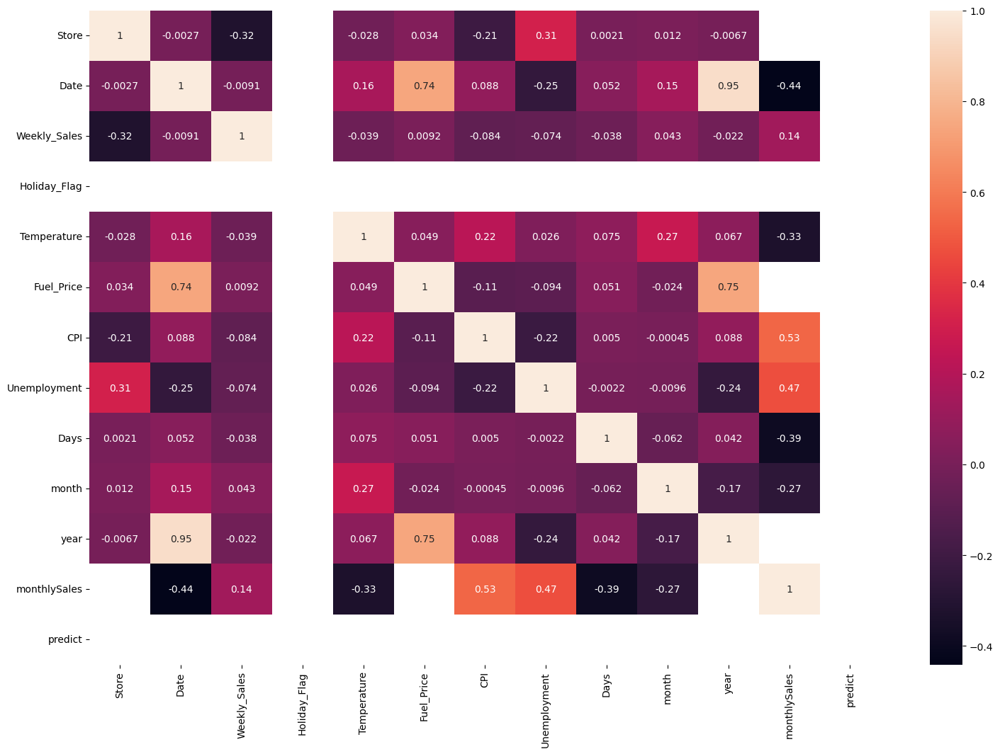

In [249]:
plt.figure(figsize = (18,12))
sns.heatmap(walmart.corr(), annot = True)

# Which store has max Sales?

Store  year
38     2012     6857104.07
33     2012    10866569.67
       2010    11739267.13
       2011    11928439.97
44     2010    12487623.58
36     2012    12657000.06
5      2010    13431129.20
       2012    13468949.34
44     2012    13523258.42
       2011    14321849.83
5      2011    14980594.29
12     2012    15431564.75
3      2010    17024183.47
       2012    17142917.30
36     2011    17597920.14
30     2012    17910718.32
3      2011    19041523.80
36     2010    19480888.47
28     2012    19637073.81
30     2010    19926185.76
       2011    20511387.97
16     2012    21091519.77
Name: Weekly_Sales, dtype: float64


<Axes: xlabel='Store', ylabel='Weekly_Sales'>

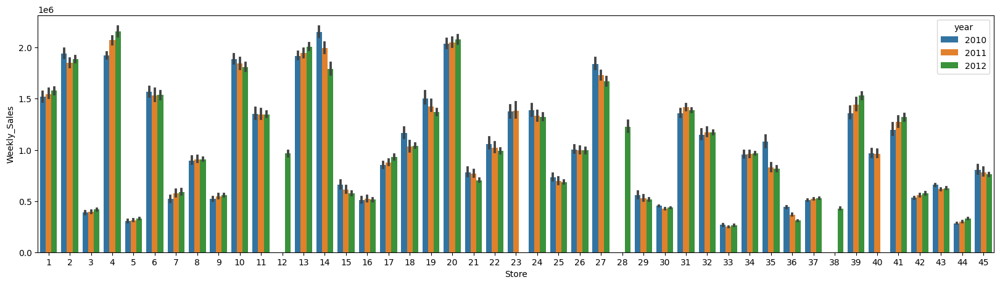

In [32]:
total_sales_y=walmart.groupby(['Store','year'])['Weekly_Sales'].sum().sort_values()
print(total_sales_y.head(22))
plt.figure(figsize=(20,5))
sns.barplot(data=walmart,x='Store',y='Weekly_Sales',hue='year')

# MAX WEEKELY_SALES:
STORE - 14      IN  2010

STORE - 20      IN  2011

STORE - 4      IN   2012
MIN WEEKLY_SALES:

STORE - 33        IN        2010,2011,    AND IN 2012.

There was No Weekely Sales Detailes in the walmart dataset regarding The STORES-12,28,38 in the year 2010 and 2011

max= 263251251.29
min  = 6857104.07
Average= 126749752.09911111


Text(0, 0.5, 'Total Sales')

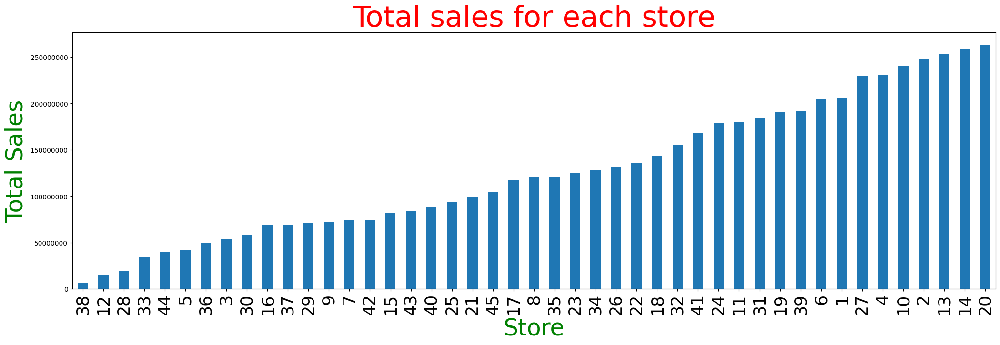

In [33]:
total_sales=walmart.groupby('Store')['Weekly_Sales'].sum().sort_values()
print('max=',total_sales.max())
print('min  =',total_sales.min())
print('Average=',total_sales.mean())

plt.figure(figsize=(25,7))
total_sales.plot(kind='bar')
plt.xticks(rotation=90,fontsize=25)
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.title('Total sales for each store',fontsize=44,color='red')
plt.xlabel('Store',fontsize=35,color='green')
plt.ylabel('Total Sales',fontsize=35,color='green')


Store-20 having the highest Sales among all Stores.

Store-38 having the lowest Sales among all Stores

In [37]:
Store20=walmart[walmart['Store']==20]
Store20

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Days,month,year
2717,20,2010-02-05,2401395.47,0,25.92,2,204.247194,8.187,5,2,2010
2719,20,2010-02-19,2161549.76,0,25.43,2,204.432100,8.187,19,2,2010
2720,20,2010-02-26,1898193.95,0,32.32,2,204.463087,8.187,26,2,2010
2721,20,2010-03-05,2119213.72,0,31.75,2,204.494073,8.187,5,3,2010
2722,20,2010-03-12,2010974.84,0,43.82,2,204.525060,8.187,12,3,2010
...,...,...,...,...,...,...,...,...,...,...,...
2855,20,2012-09-28,2008350.58,0,58.65,3,215.736716,7.280,28,9,2012
2856,20,2012-10-05,2246411.89,0,60.77,3,215.925886,7.293,5,10,2012
2857,20,2012-10-12,2162951.36,0,47.20,4,216.115057,7.293,12,10,2012
2858,20,2012-10-19,1999363.49,0,56.26,3,216.146470,7.293,19,10,2012


Text(0.5, 1.0, 'Total Weekly Sales Of Store 20')

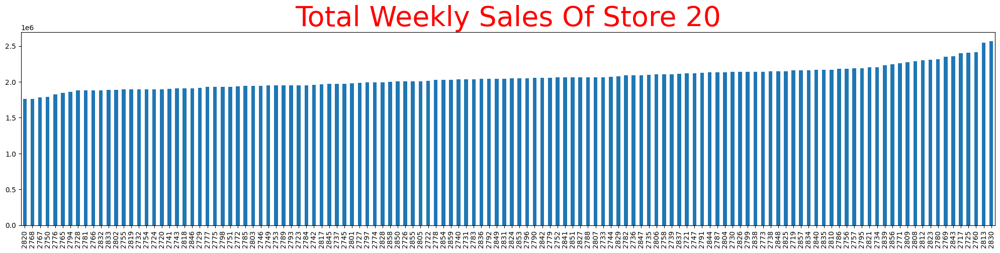

In [46]:
Store20=walmart[walmart['Store']==20]
Sales20_sort=Store20.sort_values('Weekly_Sales')
plt.figure(figsize=(25,5))
Sales20_sort['Weekly_Sales'].plot(kind='bar')

Store20_m=Store20.groupby(['month','Store'])['Weekly_Sales'].agg('sum')
plt.title('Total Weekly Sales Of Store 20', fontsize=40,color='red')

Text(0.5, 1.0, 'Total Weekly Sales Of Store 20')

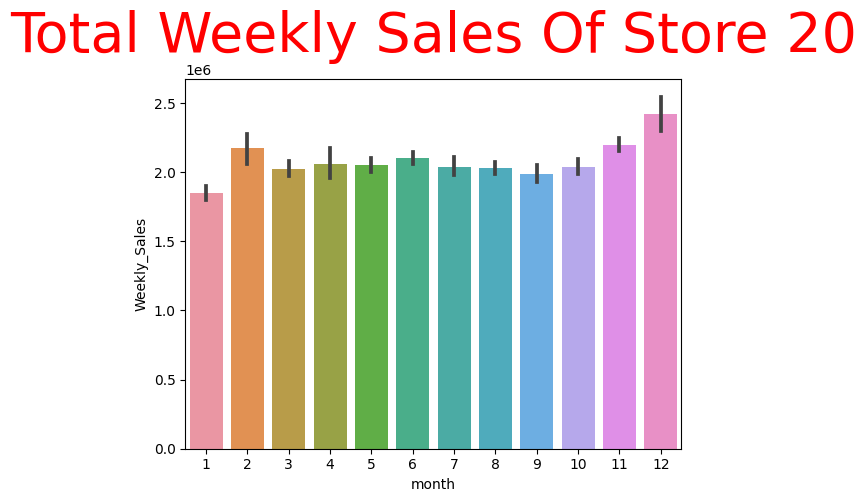

In [47]:
sns.barplot(data=Store20,x=Store20['month'],y=Store20['Weekly_Sales'])
plt.title('Total Weekly Sales Of Store 20', fontsize=40,color='red')



Text(0.5, 1.0, 'Total Weekly Sales Of Store 38')

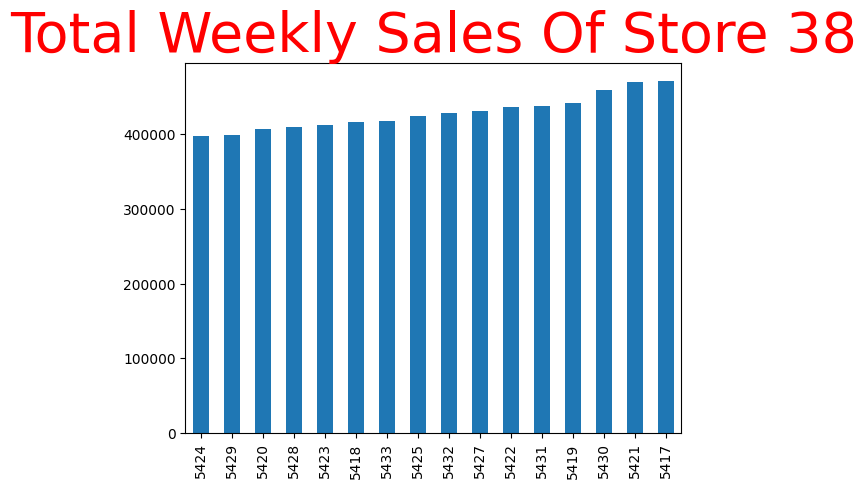

In [49]:
Store38=walmart[walmart['Store']==38]
Store38.shape
Sales38_sort=Store38.sort_values('Weekly_Sales')

Sales38_sort['Weekly_Sales'].plot(kind='bar')
plt.title('Total Weekly Sales Of Store 38', fontsize=40,color='red')


Text(0.5, 1.0, 'Total Weekly Sales Of Store 20')

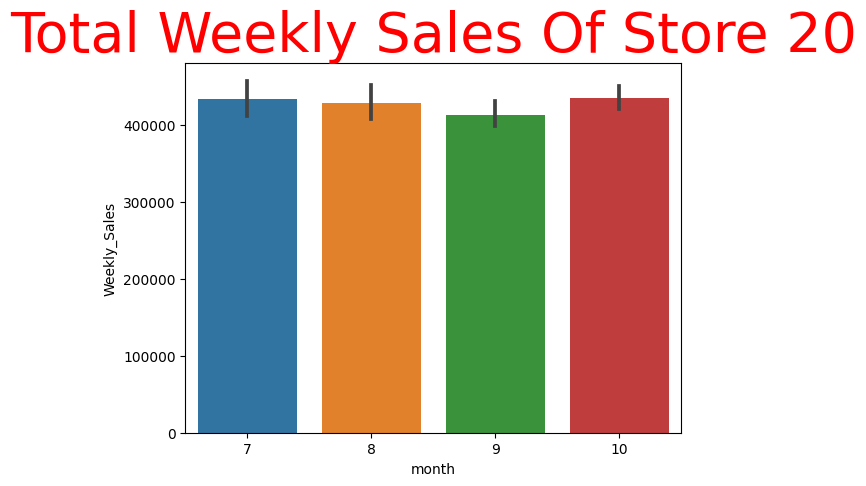

In [50]:
sns.barplot(data=Store38,x=Store38['month'],y=Store38['Weekly_Sales'])
plt.title('Total Weekly Sales Of Store 20', fontsize=40,color='red')




<Axes: xlabel='Days', ylabel='Weekly_Sales'>

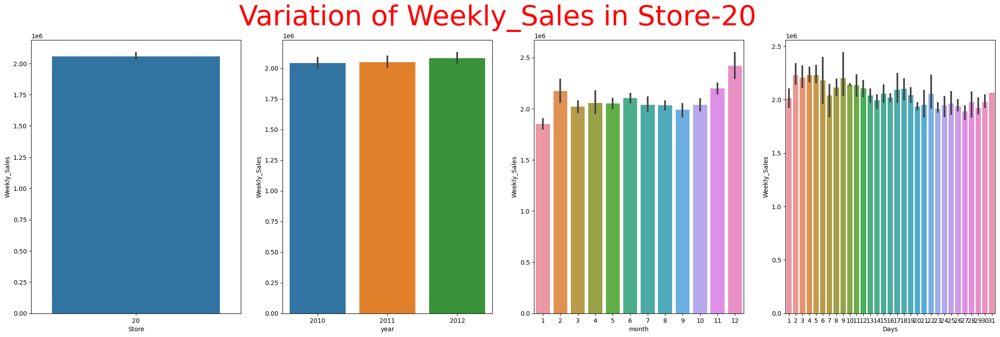

In [52]:
fig, axes = plt.subplots(1, 4, figsize=(28,8))

fig.suptitle('Variation of Weekly_Sales in Store-20',fontsize=45,color='red')

sns.barplot(ax=axes[0], data=Store20, x='Store', y='Weekly_Sales')
sns.barplot(ax=axes[1], data=Store20, x='year', y='Weekly_Sales')

sns.barplot(ax=axes[2], data=Store20, x='month', y='Weekly_Sales')
sns.barplot(ax=axes[3], data=Store20, x='Days', y='Weekly_Sales')


<Axes: xlabel='Days', ylabel='Weekly_Sales'>

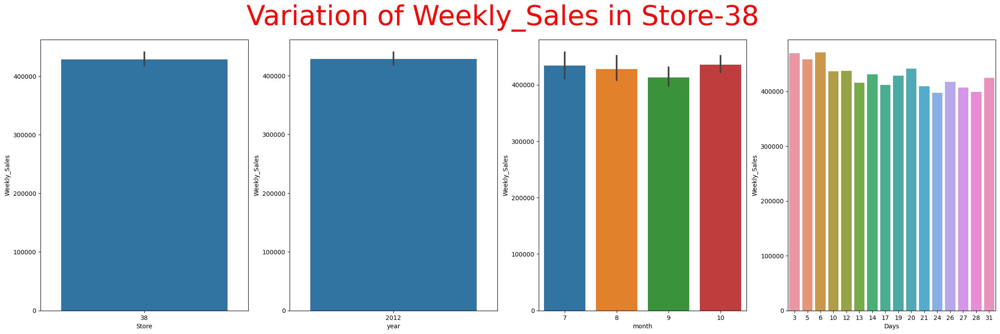

In [53]:
fig, axes = plt.subplots(1, 4, figsize=(28,8))

fig.suptitle('Variation of Weekly_Sales in Store-38',fontsize=45,color='red')

sns.barplot(ax=axes[0], data=Store38, x='Store', y='Weekly_Sales')
sns.barplot(ax=axes[1], data=Store38, x='year', y='Weekly_Sales')

sns.barplot(ax=axes[2], data=Store38, x='month', y='Weekly_Sales')
sns.barplot(ax=axes[3], data=Store38, x='Days', y='Weekly_Sales')


# Walmart Data in the Pivot Table:

In [55]:
pivot_table =walmart.pivot_table(values=['Weekly_Sales','CPI','Unemployment','Temperature'],
                                  index=['Store','year','month','Days'],                                  
                                  aggfunc=[np.mean,np.sum,min])
pivot_table

mean                                        \
                              CPI Temperature Unemployment Weekly_Sales   
Store year month Days                                                     
1     2010 2     5     211.096358       42.31        8.106   1643690.90   
                 19    211.289143       39.93        8.106   1611968.17   
                 26    211.319643       46.63        8.106   1409727.59   
           3     5     211.350143       46.50        8.106   1554806.68   
                 12    211.380643       57.79        8.106   1439541.59   
...                           ...         ...          ...          ...   
45    2012 9     28    192.013558       64.88        8.684    713173.95   
           10    5     192.170412       64.89        8.667    733455.07   
                 12    192.327265       54.47        8.667    734464.36   
                 19    192.330854       56.47        8.667    718125.53   
                 26    192.308899       58.85        8.667    760281.43   

                              sum                                        \
                              CPI Temperature Unemployment Weekly_Sales   
Store year month Days                                                     
1     2010 2     5     211.096358       42.31        8.106   1643690.90   
                 19    211.289143       39.93        8.106   1611968.17   
                 26    211.319643       46.63        8.106   1409727.59   
           3     5     211.350143       46.50        8.106   1554806.68   
                 12    211.380643       57.79        8.106   1439541.59   
...                           ...         ...          ...          ...   
45    2012 9     28    192.013558       64.88        8.684    713173.95   
           10    5     192.170412       64.89        8.667    733455.07   
                 12    192.327265       54.47        8.667    734464.36   
                 19    192.330854       56.47        8.667    718125.53   
                 26    192.308899       58.85        8.667    760281.43   

                              min                                        
                              CPI Temperature Unemployment Weekly_Sales  
Store year month Days                                                    
1     2010 2     5     211.096358       42.31        8.106   1643690.90  
                 19    211.289143       39.93        8.106   1611968.17  
                 26    211.319643       46.63        8.106   1409727.59  
           3     5     211.350143       46.50        8.106   1554806.68  
                 12    211.380643       57.79        8.106   1439541.59  
...                           ...         ...          ...          ...  
45    2012 9     28    192.013558       64.88        8.684    713173.95  
           10    5     192.170412       64.89        8.667    733455.07  
                 12    192.327265       54.47        8.667    734464.36  
                 19    192.330854       56.47        8.667    718125.53  
                 26    192.308899       58.85        8.667    760281.43  

[5507 rows x 12 columns]

Text(0.5, 1.0, 'Total Sales  of Store in Year')

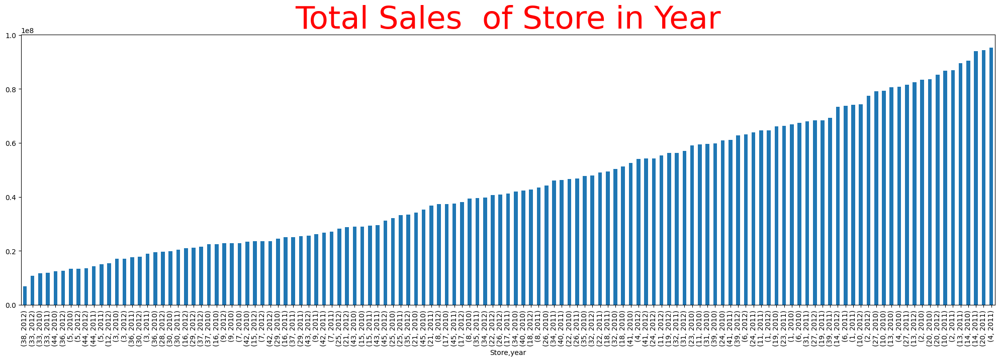

In [58]:
plt.figure(figsize=(25,7))
total_sales_y.plot(kind='bar')
plt.title('Total Sales  of Store in Year',fontsize=45,color='red')

- Store 38 is Having the Very Minimal Sales in the Year 2012 than all other Stores

- Store 4 is Having the Higher Sales than all other Stores in the Year 2011.

In [59]:
pivot_table1 =walmart.pivot_table(index='year',values='Store',aggfunc=np.count_nonzero)
print(pivot_table1)



      Store
year       
2010   1833
2011   2003
2012   1671


Text(0.5, 1.0, 'Total Yearly Sales')

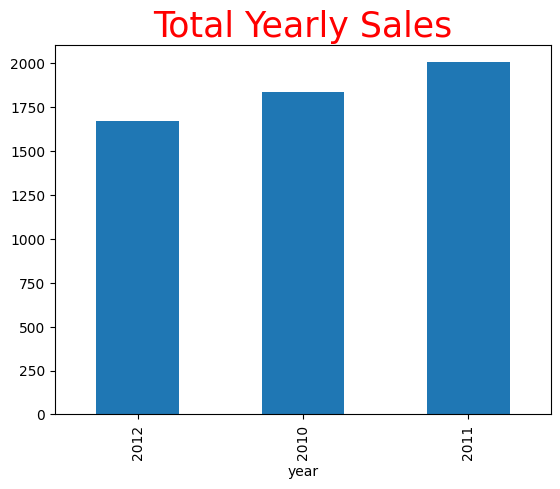

In [64]:
yearlySales=walmart['year'].value_counts().sort_values()
yearlySales.plot(kind='bar')
plt.title('Total Yearly Sales',fontsize=25,color='red')


- year -------->      Store      
- 2010-------->   1833
- 2011-------->   2003
- 2012 -------->  1671

Text(0.5, 1.0, 'Total monthly Sales')

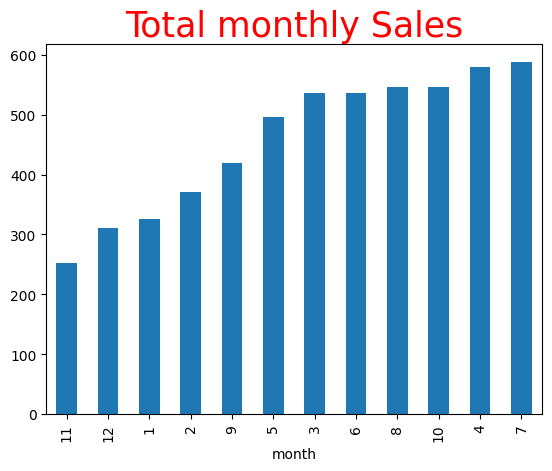

In [65]:
monthlySales=walmart['month'].value_counts().sort_values()
monthlySales.plot(kind='bar')
plt.title('Total monthly Sales',fontsize=25,color='red')

In [71]:
walmart['monthlySales']=monthlySales
M_S_Store=walmart.groupby('Store')['monthlySales'].value_counts()
M_S_Store

Store  monthlySales
1      536.0           2
       546.0           2
       252.0           1
       311.0           1
       371.0           1
       420.0           1
       496.0           1
       580.0           1
       588.0           1
Name: count, dtype: int64

<Axes: xlabel='Days'>

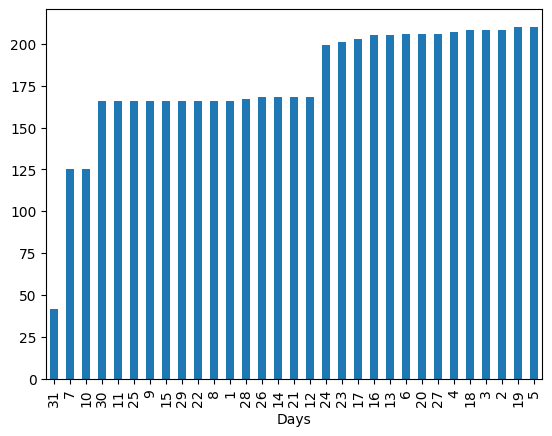

In [72]:
DaysSales=walmart['Days'].value_counts().sort_values()
DaysSales.plot(kind='bar')

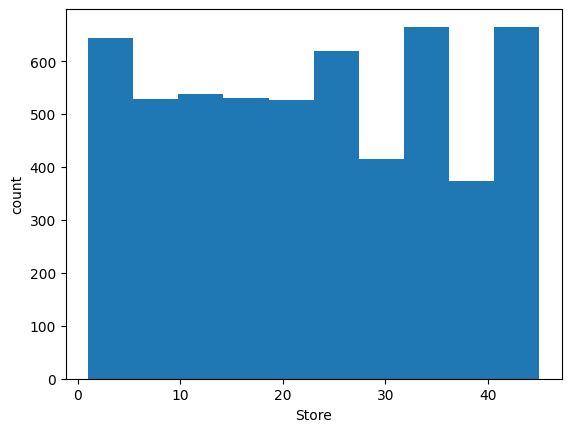

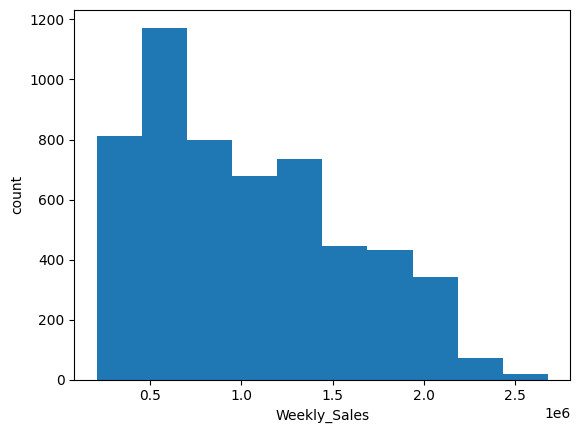

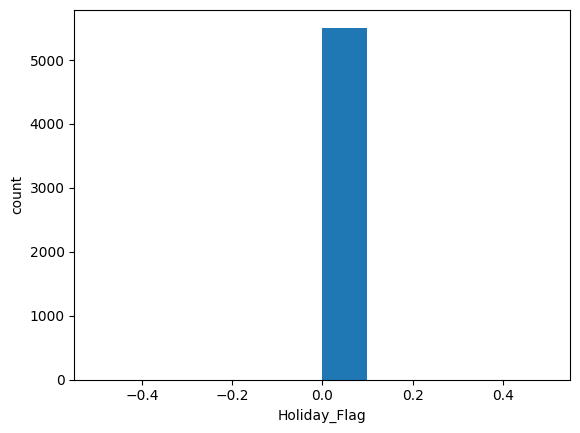

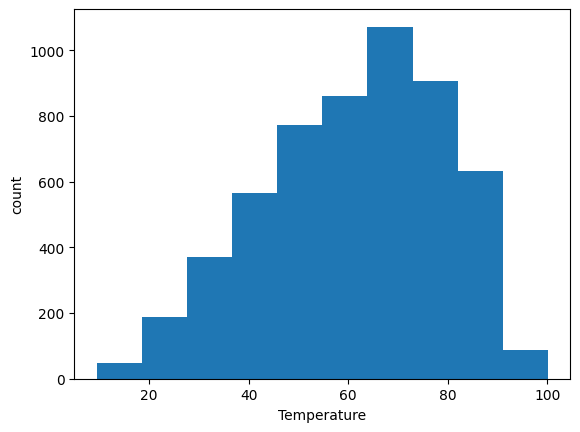

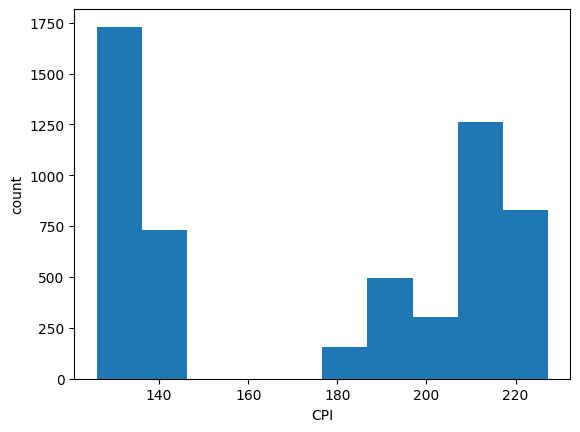

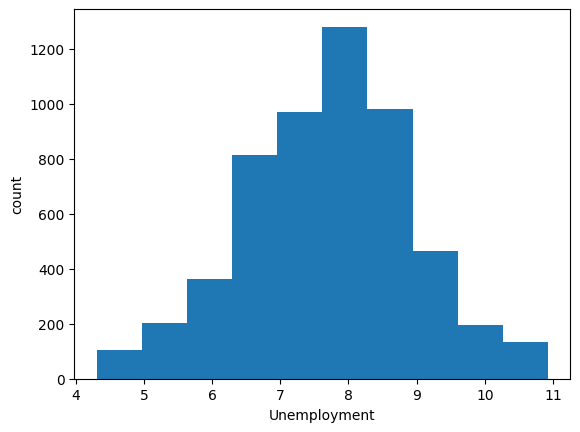

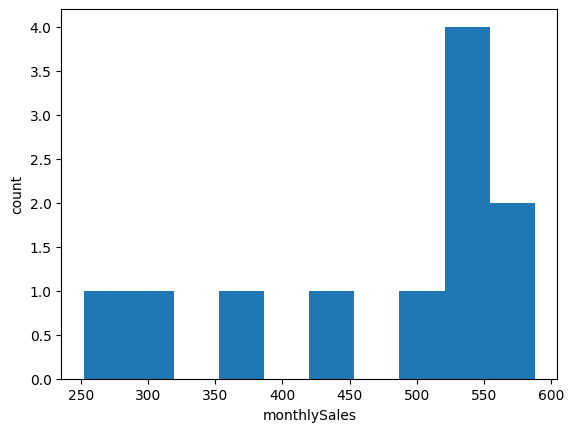

In [73]:
# The distribution of the data
col=walmart.columns
for i in col:
    if(walmart[i].dtypes=='int64' or walmart[i].dtypes=='float64'):
        plt.hist(walmart[i])
        plt.xlabel(i)
        plt.ylabel('count')
        plt.show()

Store  year  month  Days
1      2010  2      5       1643690.90
                    19      1611968.17
                    26      1409727.59
             3      5       1554806.68
                    12      1439541.59
                    19      1472515.79
                    26      1404429.92
             4      2       1594968.28
                    9       1545418.53
                    16      1466058.28
                    23      1391256.12
                    30      1425100.71
             5      7       1603955.12
                    14      1494251.50
                    21      1399662.07
                    28      1432069.95
             6      4       1615524.71
                    11      1542561.09
                    18      1503284.06
                    25      1422711.60
Name: Weekly_Sales, dtype: float64

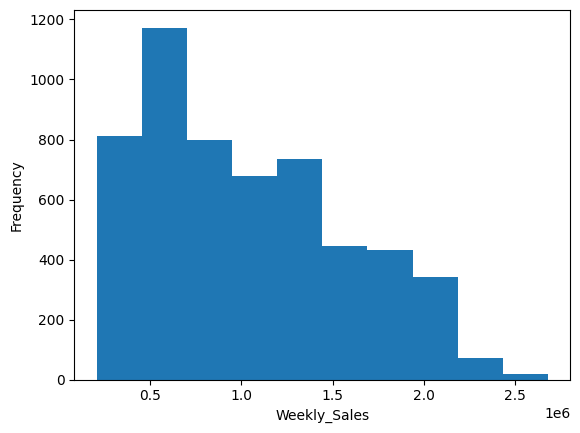

In [79]:
Store=walmart.groupby(['Store','year','month','Days'])['Weekly_Sales'].agg('sum')
Store.plot(kind='hist')
plt.xlabel('Weekly_Sales')
Store.head(20)

# Which store has maximum standard deviation? i.e. the sales vary a lot. Also, find out the coefficient of mean to standard deviation.

In [81]:
walmart_Store_means = pd.DataFrame(walmart.groupby('Store')['Weekly_Sales'].mean().sort_values(ascending=False))
print('walmart_Stores_means\n',walmart_Store_means.head(5))
walmart_Store_std = pd.DataFrame(walmart.groupby('Store')['Weekly_Sales'].std().sort_values(ascending=False))
print('walmart_Stores_stds\n',walmart_Store_std.head(5))
walmart_Store_max = pd.DataFrame(walmart.groupby('Store')['Weekly_Sales'].max().sort_values(ascending=False))
walmart_Store_min = pd.DataFrame(walmart.groupby('Store')['Weekly_Sales'].min().sort_values(ascending=False))
print('walmart_Stores_max\n',walmart_Store_max.head(5))
print('walmart_Stores_min\n',walmart_Store_min.head(5))

walmart_Stores_means
        Weekly_Sales
Store              
20     2.056650e+06
4      2.036610e+06
14     1.983411e+06
13     1.958935e+06
2      1.892591e+06
walmart_Stores_stds
         Weekly_Sales
Store               
23     238731.508900
14     231860.938182
39     199163.663843
35     189052.900565
19     185543.158695
walmart_Stores_max
        Weekly_Sales
Store              
19       2678206.42
6        2644633.02
14       2623469.95
2        2609166.75
23       2587953.32
walmart_Stores_min
        Weekly_Sales
Store              
4        1762539.30
20       1761016.51
2        1650394.44
13       1633663.12
10       1627707.31


In [91]:
walmart_data_std = pd.DataFrame(walmart.groupby('Store')['Weekly_Sales'].std().sort_values(ascending=False))
print(walmart_data_std.head(5))
walmart_data_std.head(1).index[0] , walmart_data_std.head(1).Weekly_Sales[walmart_data_std.head(1).index[0]]
walmart_data_std = pd.DataFrame(walmart.groupby('Store')['Weekly_Sales'].std().sort_values(ascending=True))
print(walmart_data_std.head(5))

        Weekly_Sales
Store               
23     238731.508900
14     231860.938182
39     199163.663843
35     189052.900565
19     185543.158695
       Weekly_Sales
Store              
30     20973.681580
37     21161.893134
38     23024.571348
33     23890.014873
44     24505.252861


- Store 23  (238731.508900) has the Maximum Standard Deviation and
- Store 30   (20973.681580)  is having the Mininmum Standard Deviation in the Given Walmart Data Set.

In [92]:
coeficient=walmart_Store_std/walmart_Store_means
coeficient = coeficient.rename(columns={'Weekly_Sales':'Coefficient of mean to std'})
coeficient=pd.DataFrame(coeficient).sort_values(by='Coefficient of mean to std',ascending=False)
print('max=',coeficient.max())
print('min  =',coeficient.min())
print('Average=',coeficient.mean())
print('std=',coeficient.std())
coeficient

max= Coefficient of mean to std    0.208185
dtype: float64
min  = Coefficient of mean to std    0.040715
dtype: float64
Average= Coefficient of mean to std    0.114575
dtype: float64
std= Coefficient of mean to std    0.040642
dtype: float64


,Coefficient of mean to std
Store,
35,0.208185
7,0.190005
15,0.178482
23,0.173230
29,0.167125
16,0.164738
36,0.163117
45,0.159596
21,0.157834


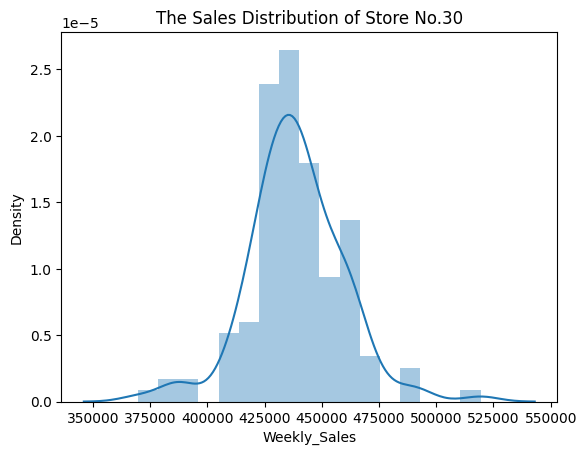

In [93]:
sns.distplot(walmart[walmart['Store'] == walmart_data_std.head(1).index[0]]['Weekly_Sales'])
plt.title('The Sales Distribution of Store No.'+ str(walmart_data_std.head(1).index[0]))
import warnings
warnings.filterwarnings('ignore')

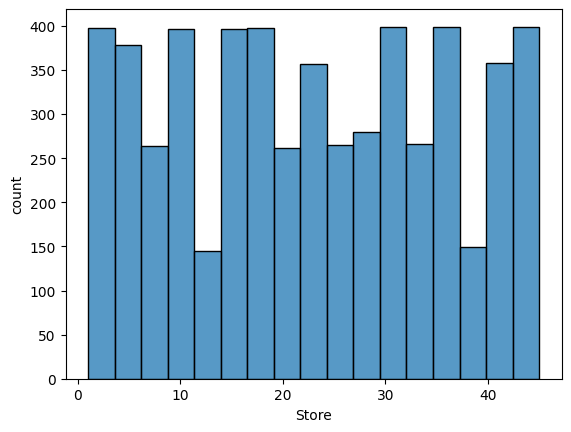

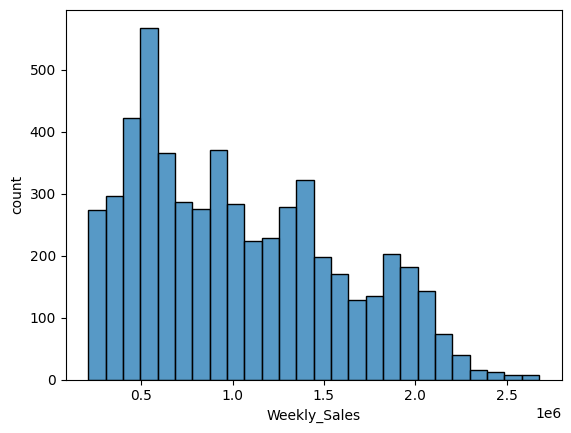

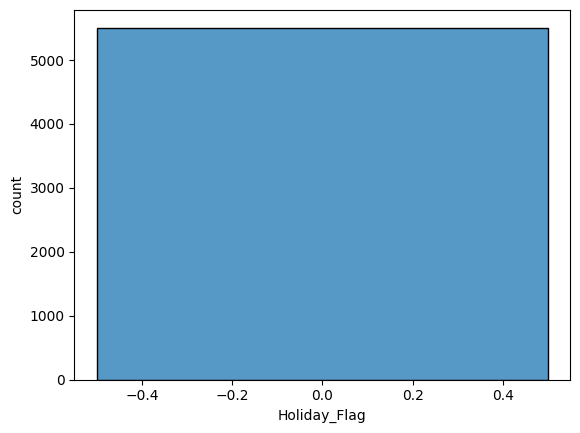

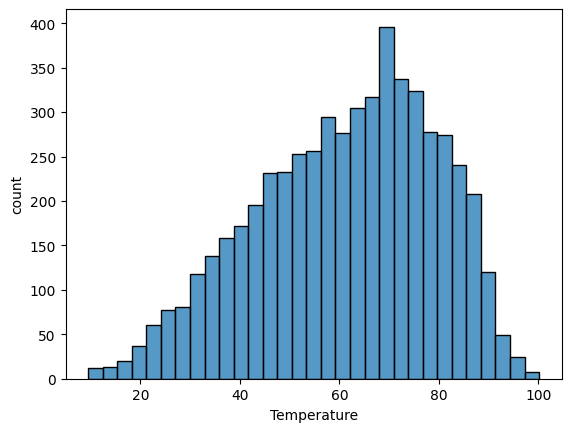

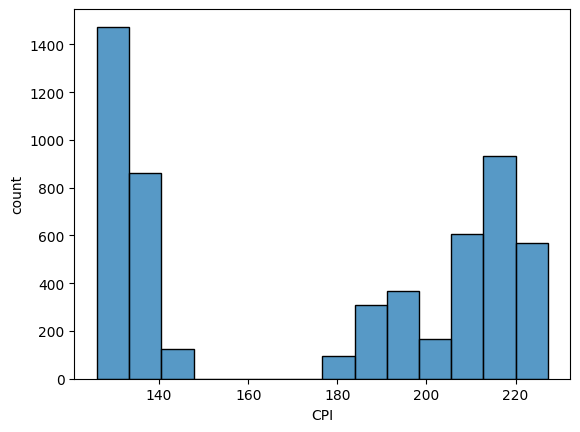

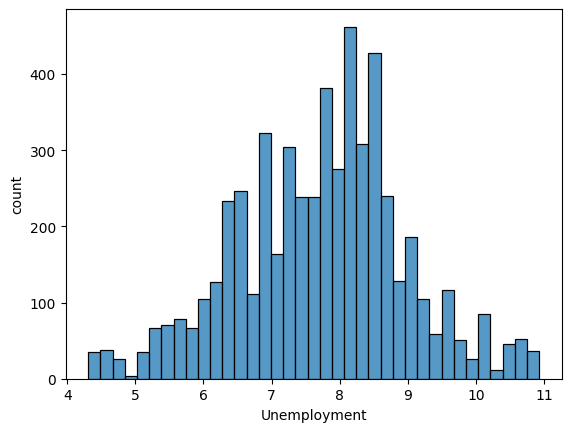

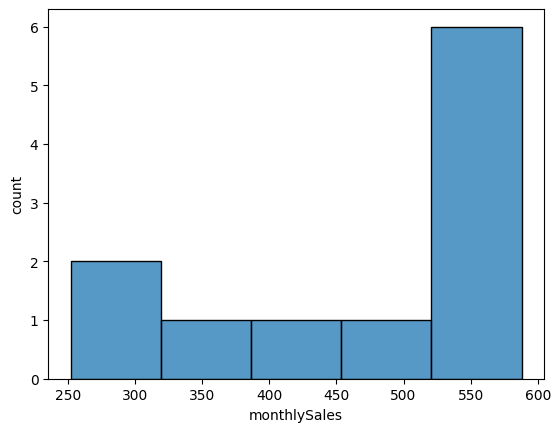

In [98]:
col=walmart_data_std.columns
for i in col:
    if(walmart[i].dtypes=='int64' or walmart[i].dtypes=='float64'):
        sns.histplot(walmart[i])
        plt.xlabel(i)
        plt.ylabel('count')
        plt.show()

Text(0, 0.5, 'Freequency')

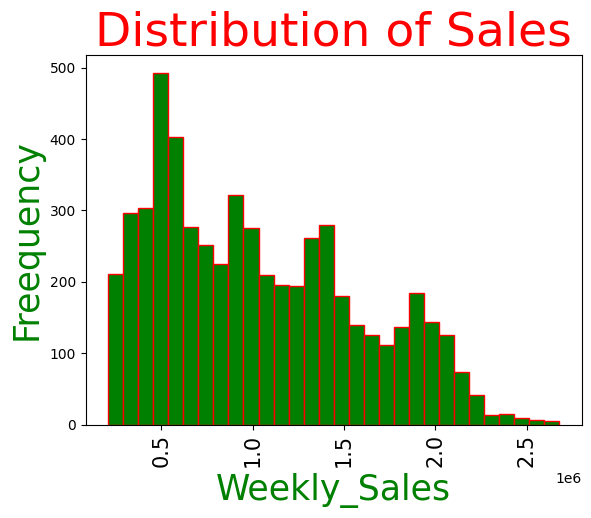

In [102]:

plt.hist(walmart['Weekly_Sales'],bins=30,color='green',edgecolor='red')

plt.xticks(rotation=90,fontsize=15)
plt.ticklabel_format(useOffset=False, style='plain', axis='y')
plt.title('Distribution of Sales',fontsize=34,color='red')
plt.xlabel('Weekly_Sales',fontsize=25,color='green')
plt.ylabel('Freequency',fontsize=25,color='green')


# Provide a monthly and semester view of sales in units and give insights. Year2010:

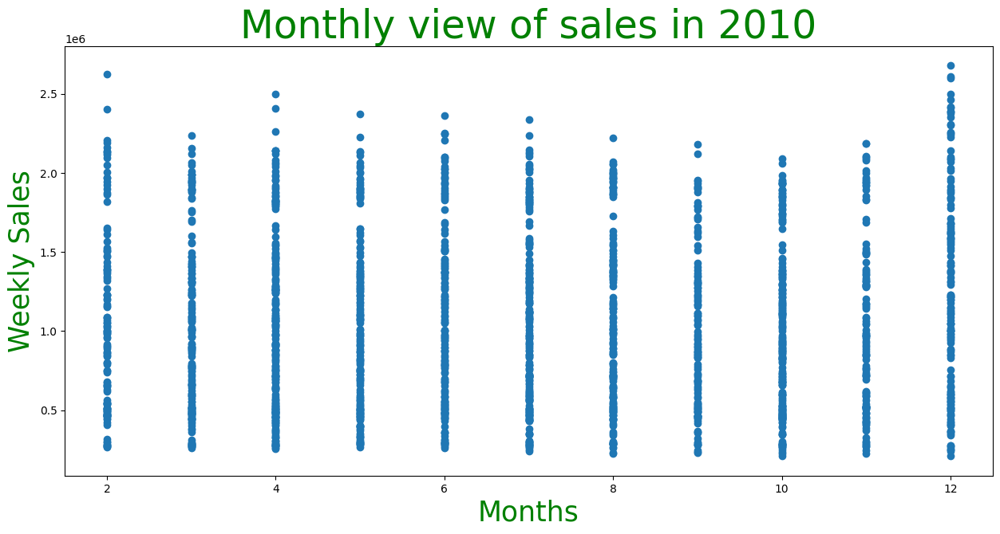

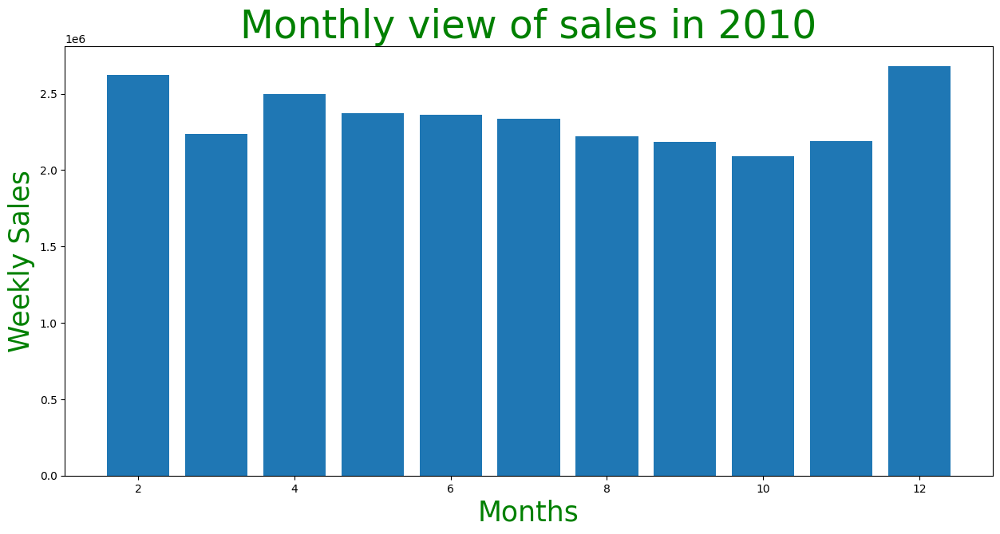

In [106]:
plt.figure(figsize=(15,7))
plt.scatter(walmart[walmart.year==2010]['month'],walmart[walmart.year==2010]['Weekly_Sales'])
plt.xlabel("Months",fontsize=25,color='g')
plt.ylabel("Weekly Sales",fontsize=25,color='g')
plt.title("Monthly view of sales in 2010",fontsize=35,color='g')
plt.show()
plt.figure(figsize=(15,7))
plt.bar(walmart[walmart.year==2010]['month'],walmart[walmart.year==2010]['Weekly_Sales'])
plt.xlabel("Months",fontsize=25,color='g')
plt.ylabel("Weekly Sales",fontsize=25,color='g')
plt.title("Monthly view of sales in 2010",fontsize=35,color='g')
plt.show()

# Year-2011:

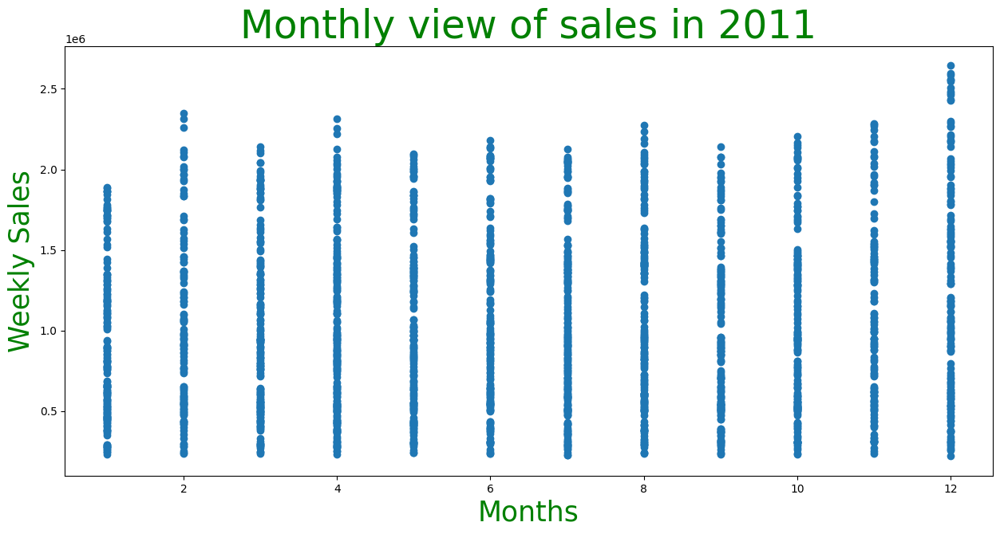

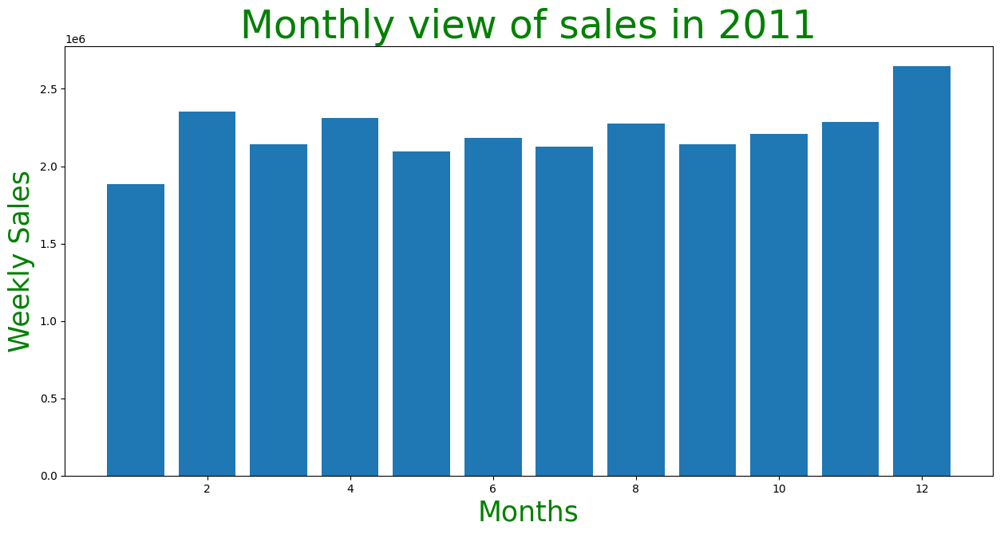

In [107]:
plt.figure(figsize=(15,7))
plt.scatter(walmart[walmart.year==2011]['month'],walmart[walmart.year==2011]['Weekly_Sales'])
plt.xlabel("Months",fontsize=25,color='g')
plt.ylabel("Weekly Sales",fontsize=25,color='g')
plt.title("Monthly view of sales in 2011",fontsize=35,color='g')
plt.show()
plt.figure(figsize=(15,7))
plt.bar(walmart[walmart.year==2011]['month'],walmart[walmart.year==2011]['Weekly_Sales'])
plt.xlabel("Months",fontsize=25,color='g')
plt.ylabel("Weekly Sales",fontsize=25,color='g')
plt.title("Monthly view of sales in 2011",fontsize=35,color='g')
plt.show()

# Year-2012:

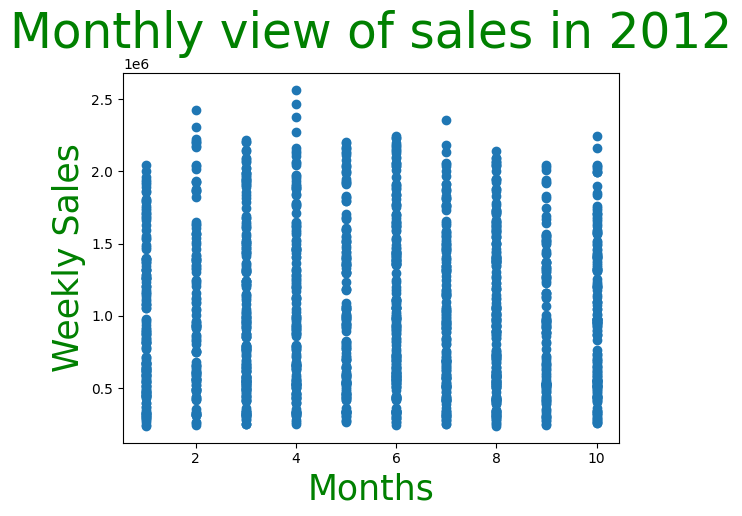

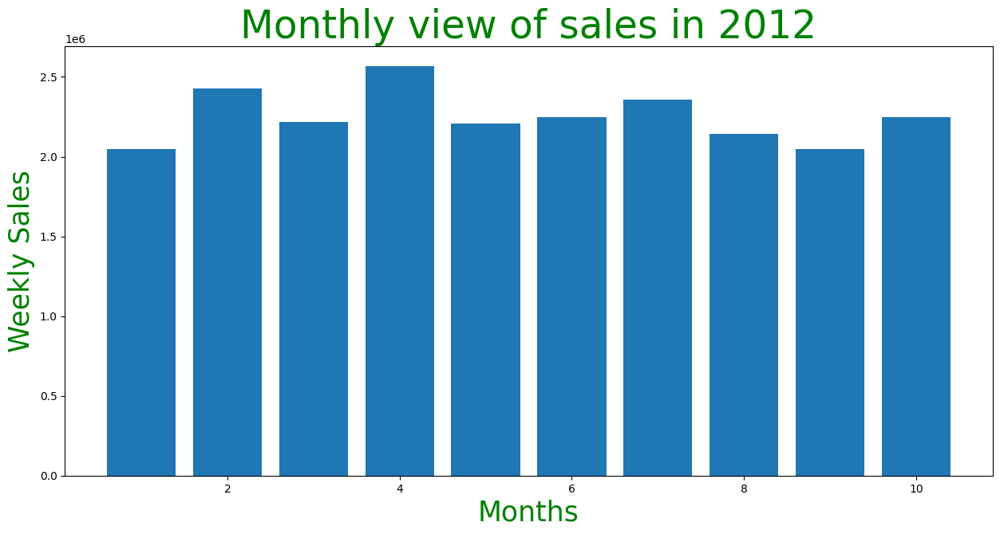

In [108]:
plt.scatter(walmart[walmart.year==2012]['month'],walmart[walmart.year==2012]['Weekly_Sales'])
plt.xlabel("Months",fontsize=25,color='g')
plt.ylabel("Weekly Sales",fontsize=25,color='g')
plt.title("Monthly view of sales in 2012",fontsize=35,color='g')
plt.show()
plt.figure(figsize=(15,7))
plt.bar(walmart[walmart.year==2012]['month'],walmart[walmart.year==2012]['Weekly_Sales'])
plt.xlabel("Months",fontsize=25,color='g')
plt.ylabel("Weekly Sales",fontsize=25,color='g')
plt.title("Monthly view of sales in 2012",fontsize=35,color='g')
plt.show()

# unemployment rate:
If the weekly sales are affected by the unemployment rate, if yes - which stores are suffering the most?

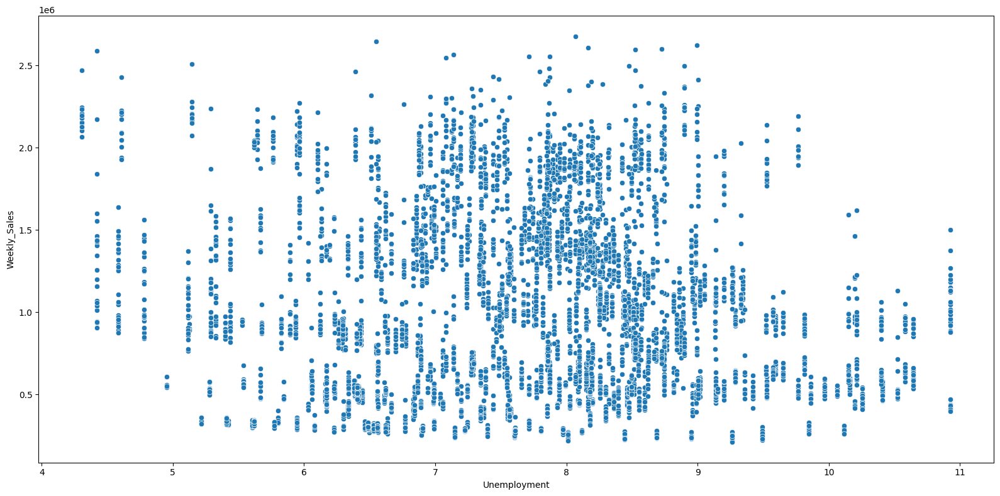

In [109]:
plt.figure(figsize=(16,8))
sns.scatterplot(x=walmart["Unemployment"],y=walmart["Weekly_Sales"])
plt.tight_layout()

Text(0, 0.5, 'Weekly_Sales')

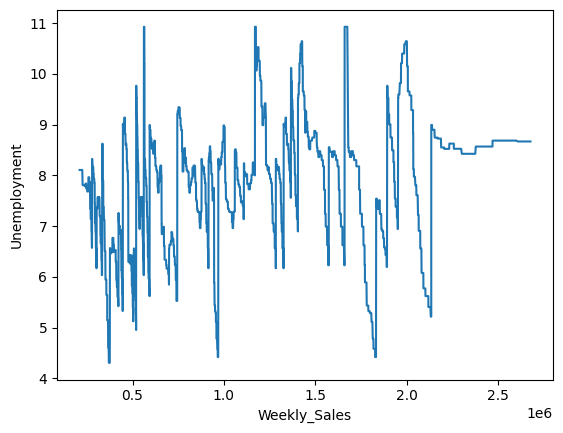

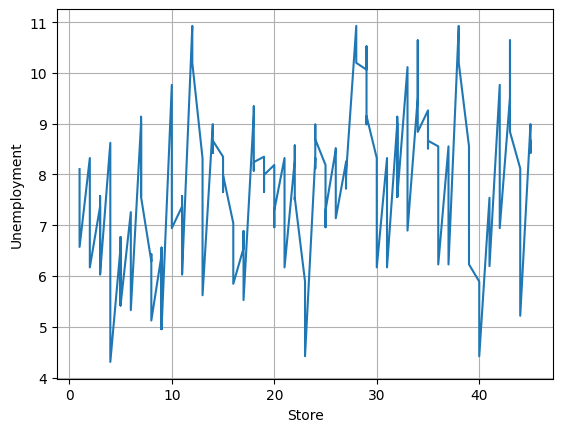

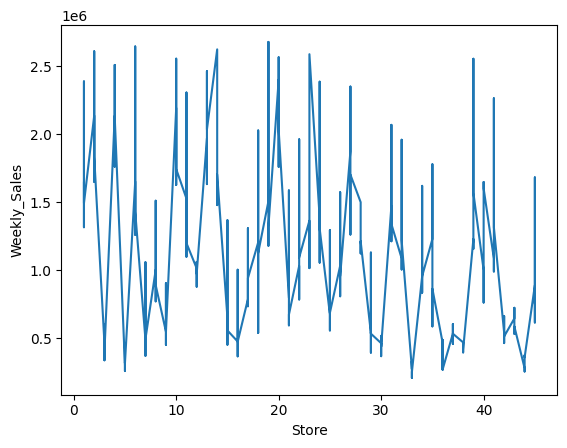

In [111]:
unemployData=walmart[['Store','Unemployment','Weekly_Sales']]
unemployData.set_index(unemployData['Store'])

x=unemployData['Weekly_Sales'].sort_values()
y=unemployData['Unemployment']


plt.plot(x,y)
plt.xlabel('Weekly_Sales')
plt.ylabel('Unemployment')

a=unemployData['Store']
b=unemployData['Unemployment']
c=unemployData['Weekly_Sales']
plt.subplots(1,1)
plt.plot(a,b)
plt.xlabel('Store')
plt.ylabel('Unemployment')
plt.grid(True)


plt.subplots(1,1)
plt.plot(a,c)
plt.xlabel('Store')
plt.ylabel('Weekly_Sales')


In [112]:
print(walmart[['Unemployment','Store']].sort_values('Unemployment').max())

Unemployment    10.926
Store           45.000
dtype: float64


In [114]:
unemployData.groupby(['Store','Unemployment'])['Unemployment'].agg('count')

Store  Unemployment
1      6.573            4
       6.908           12
       7.143           13
       7.348           12
       7.682           13
                       ..
45     8.684           12
       8.724           12
       8.743           12
       8.899           13
       8.992            7
Name: Unemployment, Length: 500, dtype: int64

In [115]:
unemployData.groupby(['Store','Unemployment'])['Unemployment'].agg('count').max()

13

Text(0, 0.5, 'Mean of Weekly Sales')

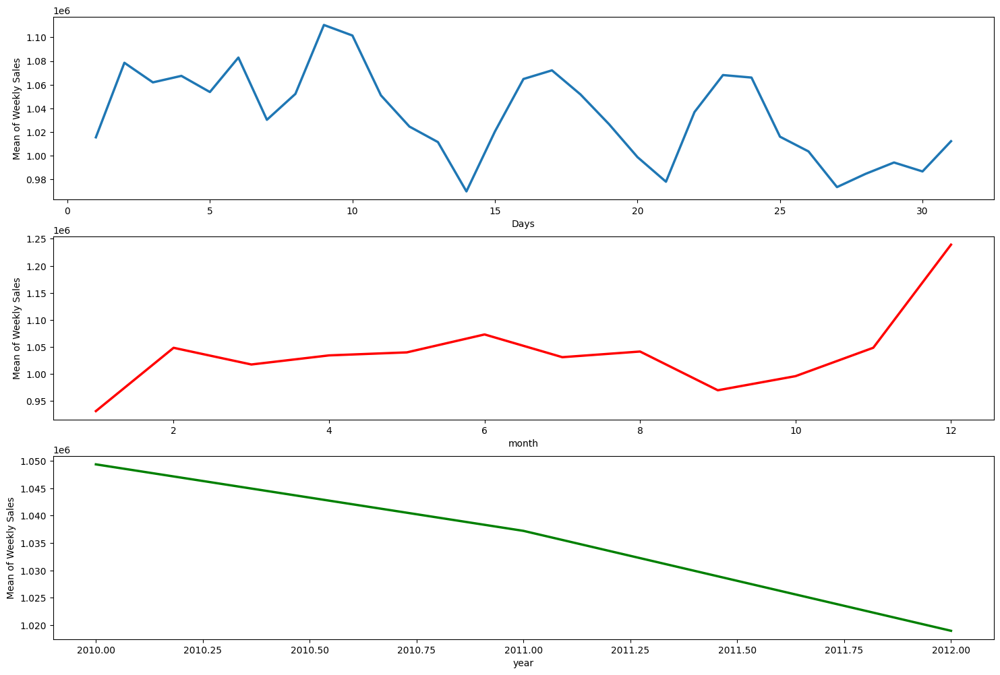

In [116]:
Day_df = walmart.groupby("Days")["Weekly_Sales"].mean().to_frame().reset_index()
Month_df = walmart.groupby("month")["Weekly_Sales"].mean().to_frame().reset_index()
Year_df = walmart.groupby("year")["Weekly_Sales"].mean().to_frame().reset_index()
fig , ax = plt.subplots(3,1,figsize = (18,12))
ax1 = sns.lineplot(x=Day_df["Days"],y=Day_df["Weekly_Sales"],linewidth=2.5,ax=ax[0])
ax1.set_ylabel("Mean of Weekly Sales")
ax2 = sns.lineplot(x=Month_df["month"],y=Month_df["Weekly_Sales"],linewidth=2.5,ax=ax[1],color = "r")
ax2.set_ylabel("Mean of Weekly Sales")
ax3 = sns.lineplot(x=Year_df["year"],y=Year_df["Weekly_Sales"],linewidth=2.5,ax=ax[2],color="g")
ax3.set_ylabel("Mean of Weekly Sales")

In [117]:
walmart[['Store','year','Weekly_Sales']].sort_values(by='Weekly_Sales',ascending=False)

,Store,year,Weekly_Sales
2620,19,2010,2678206.42
813,6,2011,2644633.02
1859,14,2010,2623469.95
188,2,2010,2609166.75
1903,14,2010,2600519.26
...,...,...,...
4610,33,2010,224294.39
4605,33,2010,224031.19
4671,33,2011,220060.35
4614,33,2010,213538.32


# Store 19 is Having Higher Weekly Sales.

Text(0.5, 1.0, 'Unemployment Rate affecting the weekly sales of various stores')

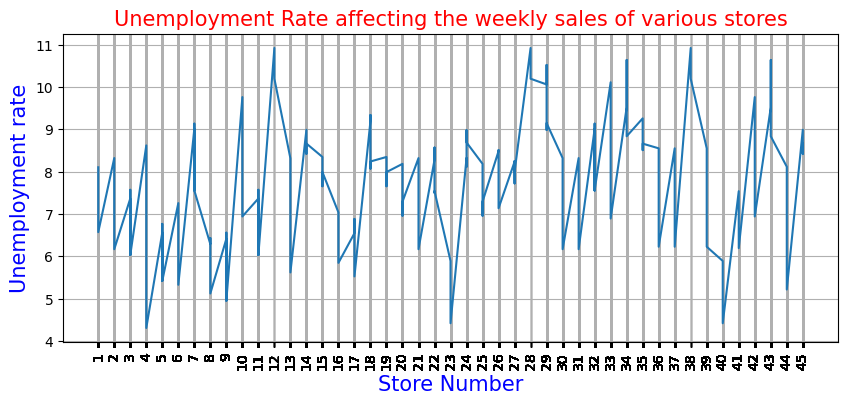

In [118]:
unempSales=walmart[['Store','Unemployment','Weekly_Sales']]
y=unempSales['Unemployment']
x=unempSales['Store']
plt.figure(figsize=(10,4))
plt.plot(x,y)
#plt.xticks(GrowthRate2012.index,rotation=90,fontsize=10)
plt.xticks(walmart['Store'].values,rotation=90,fontsize=10)
plt.grid(True)
plt.xlabel('Store Number',color='blue',fontsize=15)
plt.ylabel('Unemployment rate',color='blue',fontsize=15)
plt.title('Unemployment Rate affecting the weekly sales of various stores',color='red',fontsize=15)

- Store Number 43,38 ,33,29,28,12 are having Higher Unemployment Rate >= 10 because of this effect its Weekly Sales were less.

- Store 4 , 9, 23 , 40 are having lesser Unemployment rate <=5. I Might be Cause Higher Weekly Sales.

# Spreading of Weekly Sales and Unemployment in three years form 2010 to 2012:


Text(0.5, 0, 'Weekly_Sales')

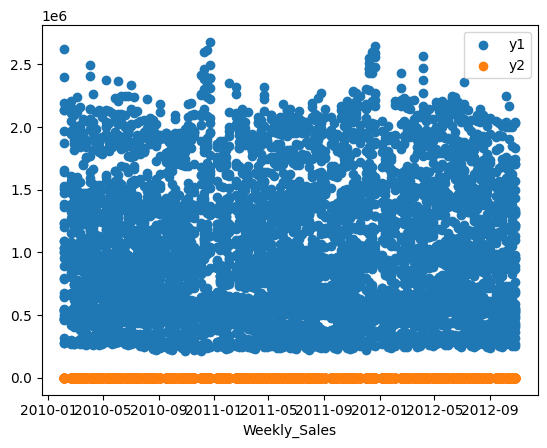

In [119]:
x=walmart['Date']
y1=walmart['Weekly_Sales']
y2=walmart['Unemployment']
plt.scatter(x,y1)
plt.scatter(x,y2)
plt.legend(['y1','y2'],loc='best')
plt.xlabel('Date')
plt.xlabel('Weekly_Sales')


In [120]:
walmart[['Store','Weekly_Sales','Unemployment']].sort_values(by='Unemployment')

,Store,Weekly_Sales,Unemployment
552,4,2234190.93,4.308
542,4,2470206.13,4.308
543,4,2105301.39,4.308
544,4,2144336.89,4.308
546,4,2196968.33,4.308
...,...,...,...
5422,38,436690.13,10.926
5421,38,469311.17,10.926
5420,38,407186.47,10.926
3998,28,1135340.19,10.926


Text(0.5, 0, 'Store')

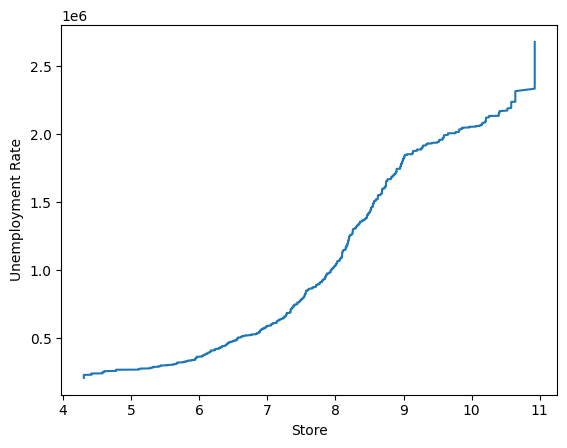

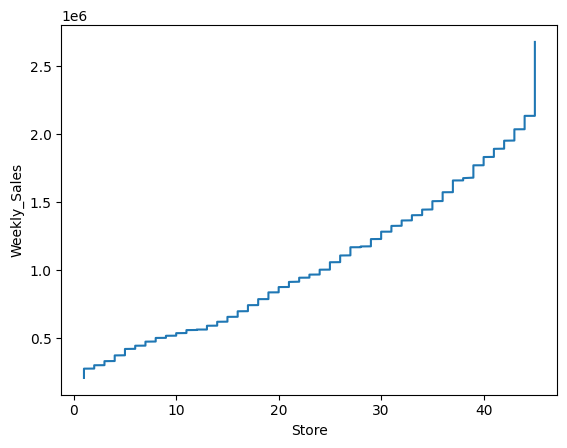

In [122]:
plt.subplots(1,1)
y1=walmart['Unemployment'].sort_values()
y2=walmart['Weekly_Sales'].sort_values()
y3=walmart['Store']

#print(y1)
plt.plot(y1,y2)
plt.ylabel('Unemployment Rate')
plt.xlabel('Store')
plt.subplots(1,1)
plt.plot(y3,y2)
plt.ylabel('Weekly_Sales')
plt.xlabel('Store')

Text(0, 0.5, 'Weekly_Sales')

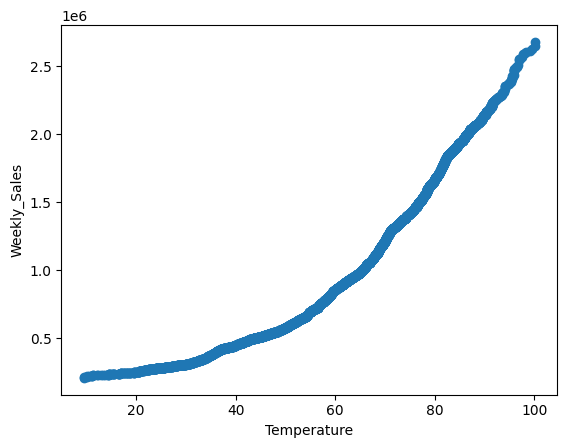

In [124]:
y1=walmart['Temperature'].sort_values()
y2=walmart['Weekly_Sales'].sort_values()
#print(y1)
plt.scatter(y1,y2)
plt.xlabel('Temperature')
plt.ylabel('Weekly_Sales')

In [125]:
walmart.groupby('Unemployment')['Weekly_Sales'].value_counts()

Unemployment  Weekly_Sales
4.308         2064065.66      1
              2105301.39      1
              2245257.18      1
              2470206.13      1
              2234190.93      1
                             ..
10.926        1014898.78      1
              1005003.12      1
              984689.90       1
              960312.75       1
              1500863.54      1
Name: count, Length: 5507, dtype: int64

In [126]:
walmart.groupby('Unemployment')['Weekly_Sales'].agg('count')

Unemployment
4.308     13
4.420     22
4.584     26
4.607     12
4.781     26
          ..
10.409    12
10.524    12
10.581    26
10.641    26
10.926    36
Name: Weekly_Sales, Length: 333, dtype: int64

In [127]:
Sales_Unemploy=walmart.groupby(['Unemployment','Store'])['Weekly_Sales'].agg('count')
Sales_Unemploy

Unemployment  Store
4.308         4        13
4.420         23       11
              40       11
4.584         23       13
              40       13
                       ..
10.641        34       13
              43       13
10.926        12       12
              28       12
              38       12
Name: Weekly_Sales, Length: 500, dtype: int64

In [128]:
walmart.groupby(['Unemployment','Store'])['Weekly_Sales'].agg(['count','sum'])

count          sum
Unemployment Store                    
4.308        4         13  28454363.67
4.420        23        11  17936148.66
             40        11  11864186.99
4.584        23        13  18084712.67
             40        13  12588798.20
...                   ...          ...
10.641       34        13  11865338.87
             43        13   7781975.33
10.926       12        12  11581178.33
             28        12  14611010.98
             38        12   5115207.56

[500 rows x 2 columns]

- Store-4 Is Having the effect of  UnEmployment rate Lesser than All other Stores And Also Having the Higher Weekly Sales than All other Stores In the Given DataSet.
- Store -38 and 28 were Having the effect of  UnEmployment rate Greater  than All other Stores And Also Having the Lesser Weekly Sales than All other Stores In the Given DataSet.

# If the weekly sales show a seasonal trend, when and what could be the reason?

Text(0, 0.5, 'Weekly_Sales')

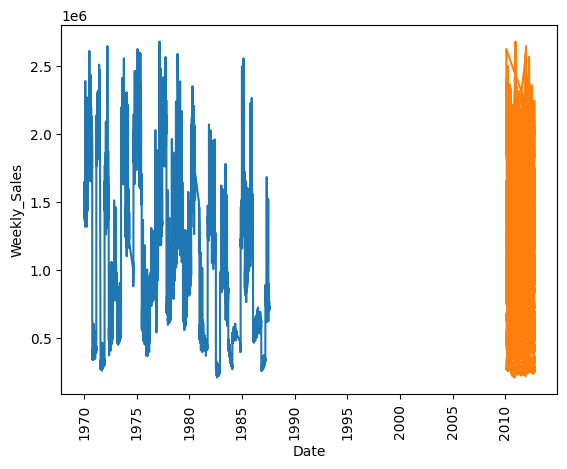

In [129]:
plt.plot(walmart['Weekly_Sales'])
plt.plot(walmart['Date'],walmart['Weekly_Sales'])
plt.xlabel('Date')
plt.xticks(rotation=90)
plt.ylabel('Weekly_Sales')

Text(0, 0.5, 'Weekly_Sales')

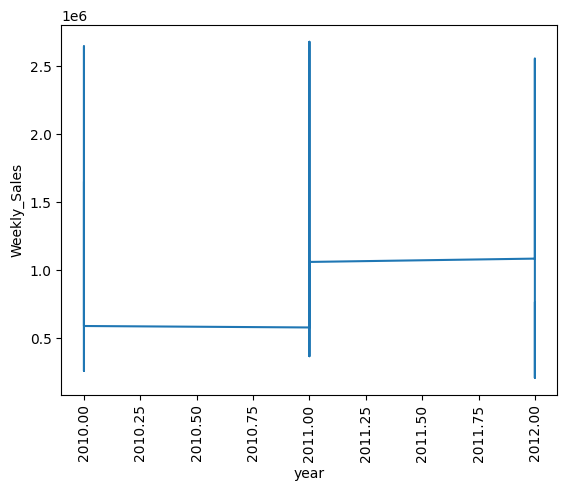

In [130]:
#plt.plot(walmart['Weekly_Sales'])
plt.plot(walmart['year'].sort_values(),walmart['Weekly_Sales'])
plt.xlabel('year')
plt.xticks(rotation=90)
plt.ylabel('Weekly_Sales')

0       2010
2587    2010
2588    2010
2589    2010
2590    2010
        ... 
3145    2012
3389    2012
3390    2012
2986    2012
6434    2012
Name: year, Length: 5507, dtype: int32


Text(0, 0.5, 'Weekly_Sales')

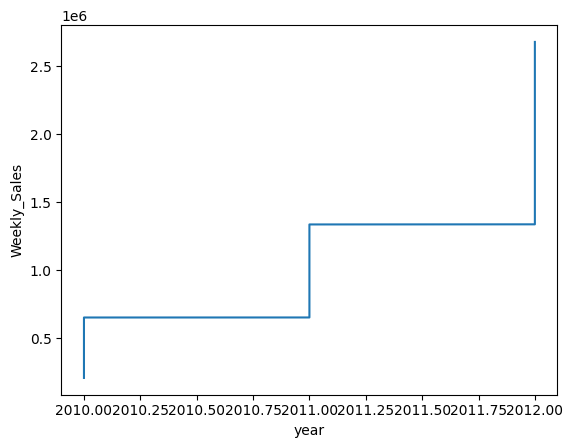

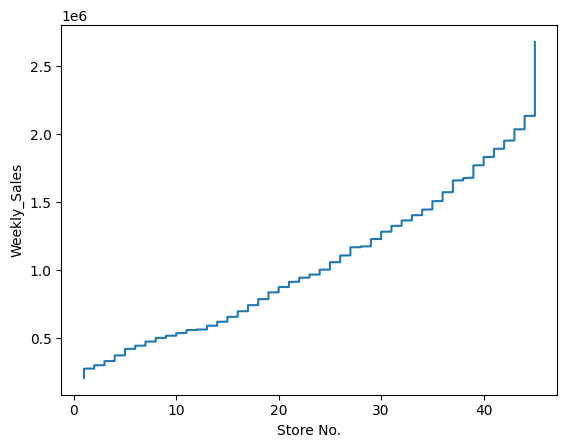

In [131]:
plt.subplots(1,1)
y1=walmart['year'].sort_values()
y2=walmart['Weekly_Sales'].sort_values()
y3=walmart['Store']

print(y1)
plt.plot(y1,y2)
plt.xlabel('year')
plt.ylabel('Weekly_Sales')

plt.subplots(1,1)
plt.plot(y3,y2)
plt.xlabel('Store No.')
plt.ylabel('Weekly_Sales')

# 1) Which store/s has good quarterly growth rate in ’2010 ?

Text(0.5, 1.0, 'stores and their quarterly growth rate in ’2012')

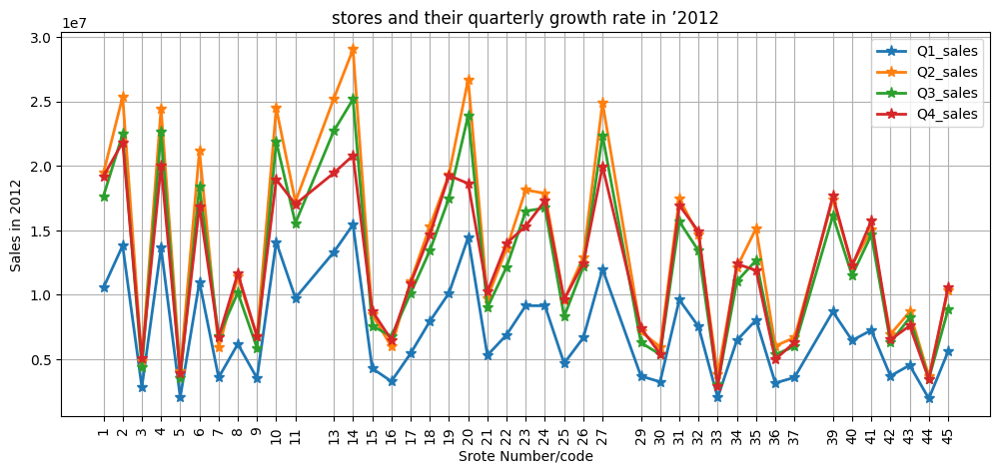

In [132]:
Q1_sales10=walmart[(walmart['Date']<='2010-03-31')&(walmart['Date']>='2010-01-01')].groupby('Store')['Weekly_Sales'].sum()
Q2_sales10=walmart[(walmart['Date']>='2010-04-01')&(walmart['Date']<='2010-06-30')].groupby('Store')['Weekly_Sales'].sum()
Q3_sales10=walmart[(walmart['Date']>='2010-07-01')&(walmart['Date']<='2010-09-30')].groupby('Store')['Weekly_Sales'].sum()
Q4_sales10=walmart[(walmart['Date']>='2010-10-01')&(walmart['Date']<='2010-12-31')].groupby('Store')['Weekly_Sales'].sum()

Q_Sales10={'Q1_sales':Q1_sales10,'Q2_sales':Q2_sales10,'Q3_sales':Q3_sales10,'Q4_sales':Q4_sales10}
Q_Sales10=pd.DataFrame(Q_Sales10)
Q_Sales10.head(2)
Q_Sales10.index

plt.figure(figsize=(12,5))
plt.plot(Q_Sales10, linewidth=2, markersize=8,marker='*')
plt.legend(Q_Sales10.columns.to_list())
plt.grid(True)
plt.ylabel('Sales in 2012')
plt.xlabel('Srote Number/code')
plt.xticks(Q_Sales10.index,rotation=90)
plt.title('stores and their quarterly growth rate in ’2012')

       Growth_rateQ2  Growth_rateQ3  Growth_rateQ4
Store                                             
1          28.156057      -3.076725       2.923631
2          27.921244      -3.826266      -0.930338
3          23.847426      -3.584511       5.412936
4          26.451622      -2.471230      -3.835419
5          32.924655      -4.557532       3.690961


Text(0.5, 1.0, 'stores and their quarterly growth rate in ’2010')

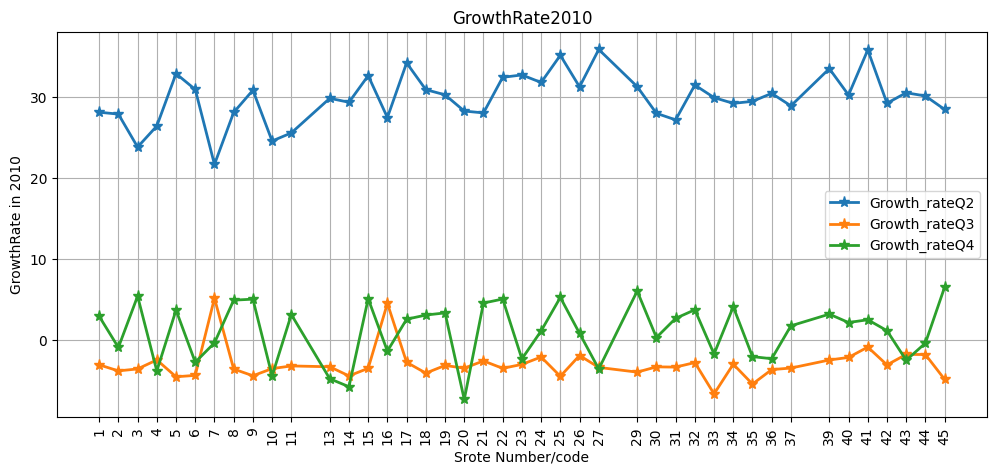

<Figure size 1200x500 with 0 Axes>

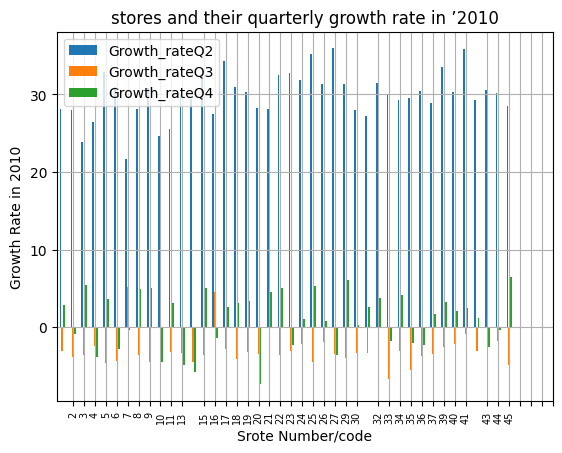

In [133]:
Growth_rateQ2 =((Q2_sales10-Q1_sales10)/Q1_sales10*100)/3
Growth_rateQ2
Growth_rateQ3 =((Q3_sales10-Q2_sales10)/Q2_sales10*100)/3
Growth_rateQ3
Growth_rateQ4 =((Q4_sales10-Q3_sales10)/Q3_sales10*100)/3
Growth_rateQ4
GrowthRate2010={'Growth_rateQ2':Growth_rateQ2,'Growth_rateQ3':Growth_rateQ3,'Growth_rateQ4':Growth_rateQ4}
GrowthRate2010=pd.DataFrame(GrowthRate2010)
print(GrowthRate2010.head())

plt.figure(figsize=(12,5))
plt.plot(GrowthRate2010, linewidth=2, markersize=8,marker='*')
plt.legend(GrowthRate2010.columns.to_list())
plt.grid(True)
plt.ylabel('GrowthRate in 2010')
plt.xlabel('Srote Number/code')
plt.xticks(Q_Sales10.index,rotation=90)
plt.title('GrowthRate2010')

plt.figure(figsize=(12,5))                            #Bar graph
GrowthRate2010.plot(kind='bar')
plt.grid(True)
plt.ylabel('Growth Rate in 2010')
plt.xlabel('Srote Number/code')
plt.xticks(GrowthRate2010.index,rotation=90,fontsize=7)
plt.title('stores and their quarterly growth rate in ’2010')


min-G_rate-Q3- -6.673861187224214
max-G_rate-Q3 5.160632760179091


Store
33   -6.673861
35   -5.458148
45   -4.876173
5    -4.557532
25   -4.493807
Name: Weekly_Sales, dtype: float64

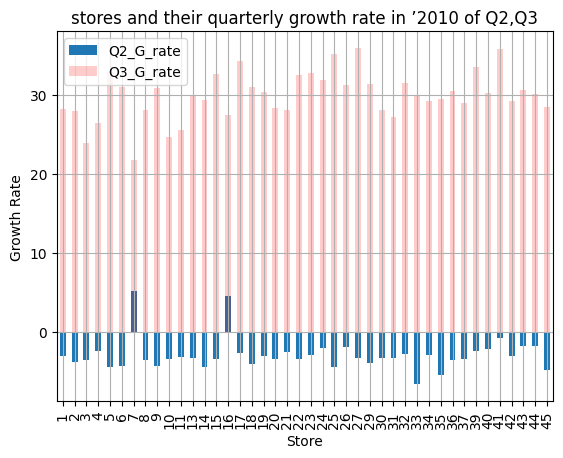

In [136]:
#Graph  for Q2 and Q3
Growth_rateQ2.plot(ax=Growth_rateQ3.plot(kind='bar'),kind='bar',color='red',alpha=0.2,legend=True)
plt.legend(['Q2_G_rate','Q3_G_rate'])
plt.ylabel('Growth Rate')
plt.grid(True)
plt.title('stores and their quarterly growth rate in ’2010'' of Q2,Q3')
print('min-G_rate-Q3-',Growth_rateQ3.min())
print('max-G_rate-Q3',Growth_rateQ3.max())
Growth_rateQ3.sort_values().head()

max= 35.91432501980789
min  = 21.701273675154255
Average= 29.913207154533854
std= 3.0334963419248533
Here, store-27 and 41 were  which has performed better in the 2nd quarter as compared to the 3rd and 4th quarter than all othe stores.
Here, store-7 which has performed poor in the 2nd quarter as compared to the 3rd and 4th quarter than all othe stores.
max= 5.160632760179091
min  = -6.673861187224214
Average= -2.991787248222874
std= 2.0574766029384586
max= 6.530787742407855
min  = -7.3607453755818035
Average= 1.0352002701248808
std= 3.5982531264801714


Store
1    2.923631
2   -0.930338
3    5.412936
4   -3.835419
5    3.690961
Name: Weekly_Sales, dtype: float64

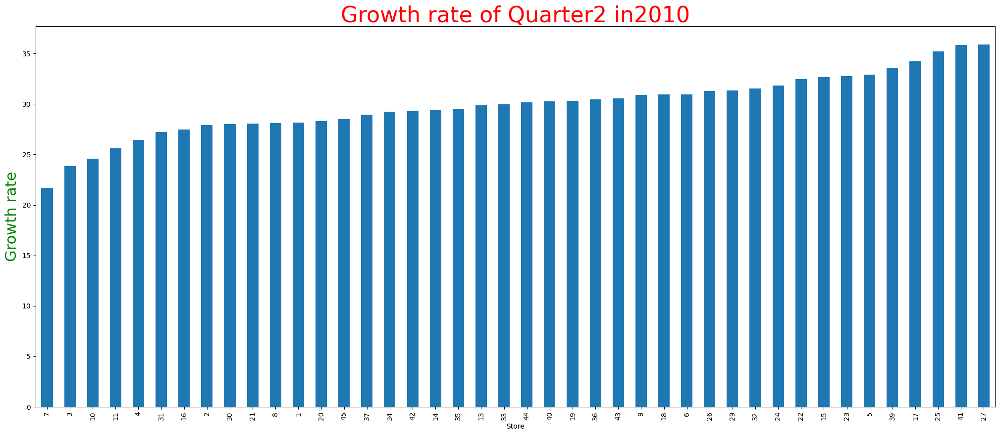

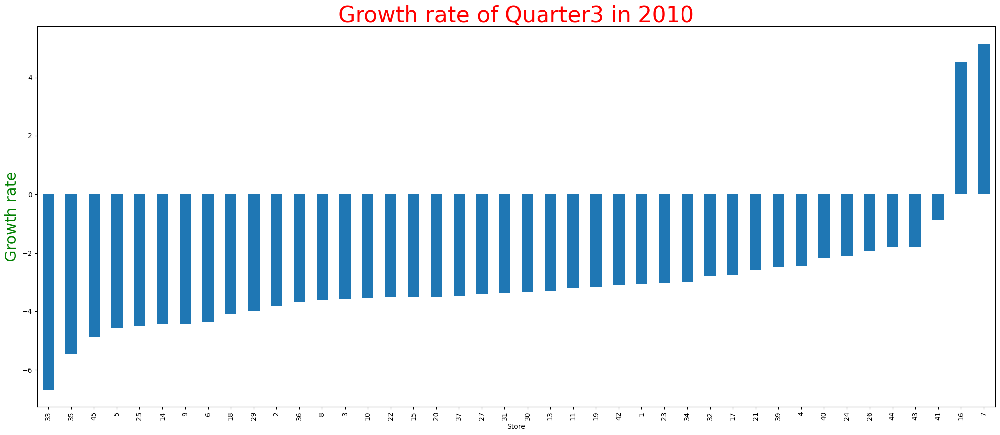

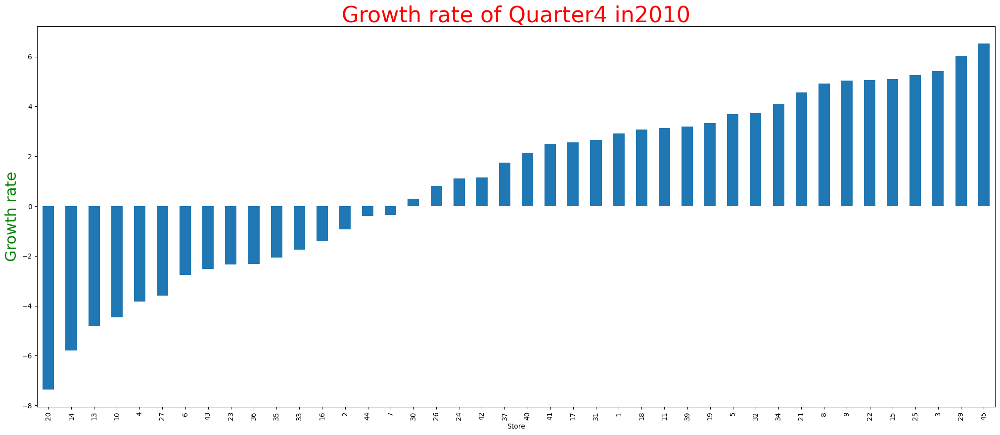

In [137]:
plt.figure(figsize=(25,10))
Growth_rateQ2.sort_values().plot(kind='bar')
plt.title('Growth rate of Quarter2 in2010',color='r',fontsize=32)
plt.ylabel('Growth rate',color='g',fontsize=22)

print('max=',Growth_rateQ2.max())
print('min  =',Growth_rateQ2.min())
print('Average=',Growth_rateQ2.mean())
print('std=',Growth_rateQ2.std())
Growth_rateQ2.head()

print('Here, store-27 and 41 were  which has performed better in the 2nd quarter as compared to the 3rd and 4th quarter than all othe stores.')
print('Here, store-7 which has performed poor in the 2nd quarter as compared to the 3rd and 4th quarter than all othe stores.')

plt.figure(figsize=(25,10))
Growth_rateQ3.sort_values().plot(kind='bar')
plt.title('Growth rate of Quarter3 in 2010',color='r',fontsize=32)
plt.ylabel('Growth rate',color='g',fontsize=22)

print('max=',Growth_rateQ3.max())
print('min  =',Growth_rateQ3.min())
print('Average=',Growth_rateQ3.mean())
print('std=',Growth_rateQ3.std())
Growth_rateQ3.head()


plt.figure(figsize=(25,10))
Growth_rateQ4.sort_values().plot(kind='bar')
plt.title('Growth rate of Quarter4 in2010',color='r',fontsize=32)
plt.ylabel('Growth rate',color='g',fontsize=22)

print('max=',Growth_rateQ4.max())
print('min  =',Growth_rateQ4.min())
print('Average=',Growth_rateQ4.mean())
print('std=',Growth_rateQ4.std())
Growth_rateQ4.head()

# 2) Which store/s has good quarterly growth rate in ’2011 ?:

Text(0.5, 1.0, 'stores and their quarterly growth rate in ’2011')

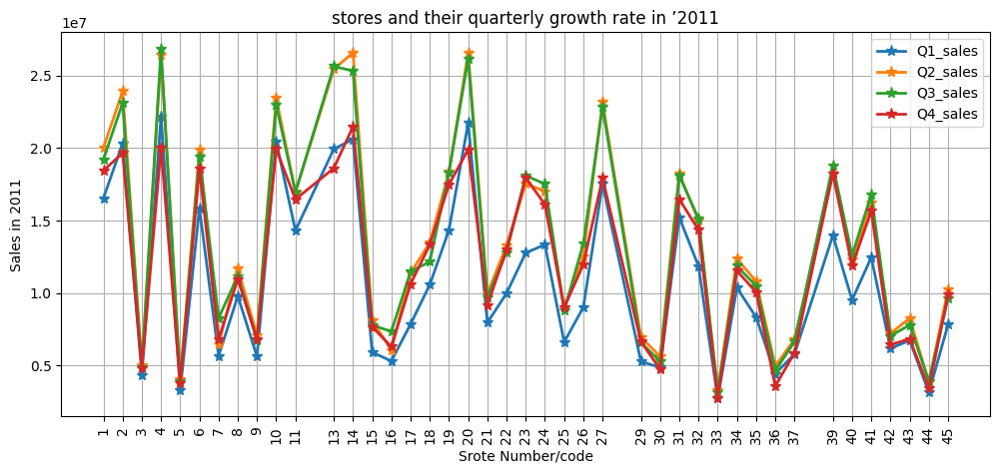

In [138]:
Q1_sales11=walmart[(walmart['Date']<='2011-03-31')&(walmart['Date']>='2011-01-01')].groupby('Store')['Weekly_Sales'].sum()
Q2_sales11=walmart[(walmart['Date']>='2011-04-01')&(walmart['Date']<='2011-06-30')].groupby('Store')['Weekly_Sales'].sum()
Q3_sales11=walmart[(walmart['Date']>='2011-07-01')&(walmart['Date']<='2011-09-30')].groupby('Store')['Weekly_Sales'].sum()
Q4_sales11=walmart[(walmart['Date']>='2011-10-01')&(walmart['Date']<='2011-12-31')].groupby('Store')['Weekly_Sales'].sum()

Q_Sales11={'Q1_sales':Q1_sales11,'Q2_sales':Q2_sales11,'Q3_sales':Q3_sales11,'Q4_sales':Q4_sales11}
Q_Sales11=pd.DataFrame(Q_Sales11)
Q_Sales11.head(2)
Q_Sales11.index

plt.figure(figsize=(12,5))
plt.plot(Q_Sales11, linewidth=2, markersize=8,marker='*')
plt.legend(Q_Sales11.columns.to_list())
plt.grid(True)
plt.ylabel('Sales in 2011')
plt.xlabel('Srote Number/code')
plt.xticks(Q_Sales11.index,rotation=90)
plt.title('stores and their quarterly growth rate in ’2011')

- From the above inference Quartile3 and Quartile2 Sales are having heigher rating in Sales. in Store 4, 20 ,14 and 13.

- From the above inference Quartile3 and Quartile2 Sales are having lesser rating in Sales. in Stores 3,5,33,36,44..etc. in the year 2011.

- And there is no Sales information in Store 12,28,38.

Store Number 4  is having More Quaterly growth among the all then stores.


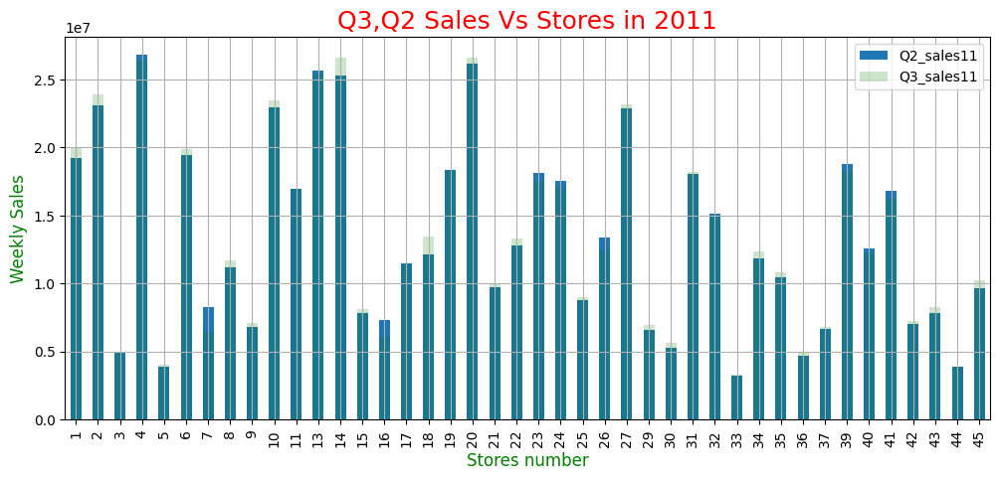

In [139]:
plt.figure(figsize=(12,5))
Q2_sales11.plot(ax=Q3_sales11.plot(kind='bar'),kind='bar',color='g',alpha=0.2,legend=True)
plt.legend(['Q2_sales11','Q3_sales11'])
plt.grid(True)
plt.xlabel('Stores number',color='g',fontsize=12)
plt.ylabel('Weekly Sales',color='g',fontsize=12)
plt.title('Q3,Q2 Sales Vs Stores in 2011',color='r',fontsize=18)
print('Store Number 4  is having More Quaterly growth among the all then stores.')

# Calculating Growth rate of Stores in '2011
To calculate the growth rate, take the current value and subtract that from the previous value. Next, divide this difference by the previous value and multiply by 100 to get a percentage representation of the rate of growth.

       Growth_rateQ2  Growth_rateQ3  Growth_rateQ4
Store                                             
1           7.003852      -1.333858      -1.340500
2           5.878269      -1.118121      -4.987892
3           4.851869      -0.849247      -0.273418
4           6.390023       0.509480      -8.429663
5           7.111035      -1.076721      -1.066225


Text(0.5, 1.0, 'stores and their quarterly growth rate in ’2011')

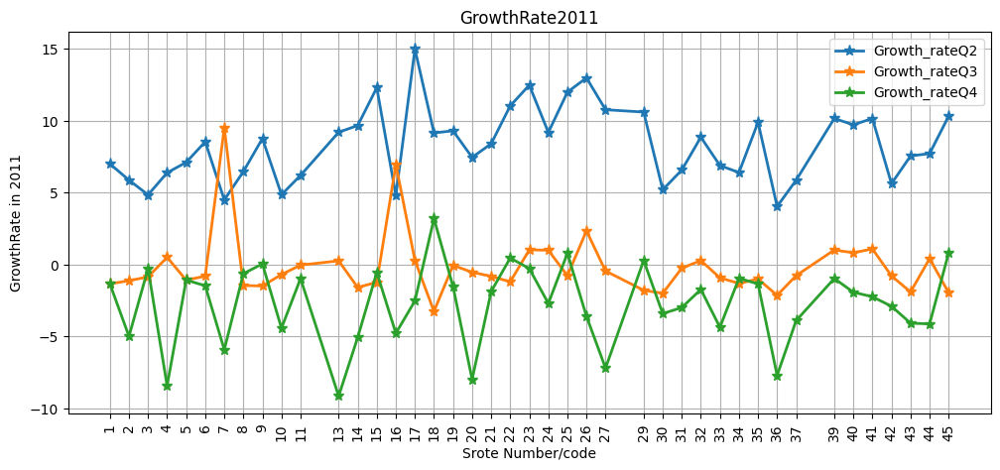

<Figure size 1200x500 with 0 Axes>

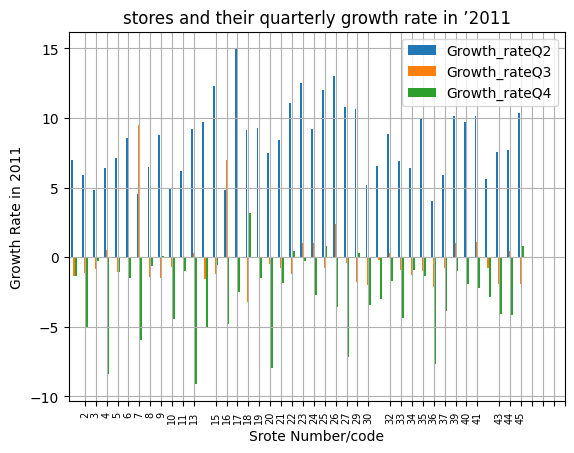

In [140]:
Growth_rateQ2 =((Q2_sales11-Q1_sales11)/Q1_sales11*100)/3
Growth_rateQ2
Growth_rateQ3 =((Q3_sales11-Q2_sales11)/Q2_sales11*100)/3
Growth_rateQ3
Growth_rateQ4 =((Q4_sales11-Q3_sales11)/Q3_sales11*100)/3
Growth_rateQ4
GrowthRate2011={'Growth_rateQ2':Growth_rateQ2,'Growth_rateQ3':Growth_rateQ3,'Growth_rateQ4':Growth_rateQ4}
GrowthRate2011=pd.DataFrame(GrowthRate2011)
print(GrowthRate2011.head())

plt.figure(figsize=(12,5))
plt.plot(GrowthRate2011, linewidth=2, markersize=8,marker='*')
plt.legend(GrowthRate2011.columns.to_list())
plt.grid(True)
plt.ylabel('GrowthRate in 2011')
plt.xlabel('Srote Number/code')
plt.xticks(GrowthRate2011.index,rotation=90)
plt.title('GrowthRate2011')

#Bar graph
plt.figure(figsize=(12,5))
GrowthRate2011.plot(kind='bar')
plt.grid(True)
plt.ylabel('Growth Rate in 2011')
plt.xlabel('Srote Number/code')
plt.xticks(GrowthRate2011.index,rotation=90,fontsize=7)
plt.title('stores and their quarterly growth rate in ’2011')

min-G_rate-Q3- -3.24861142315544
max-G_rate-Q3 9.515736797193492
Store
18   -3.248611
36   -2.134012
30   -1.994879
45   -1.953719
43   -1.900809
Name: Weekly_Sales, dtype: float64


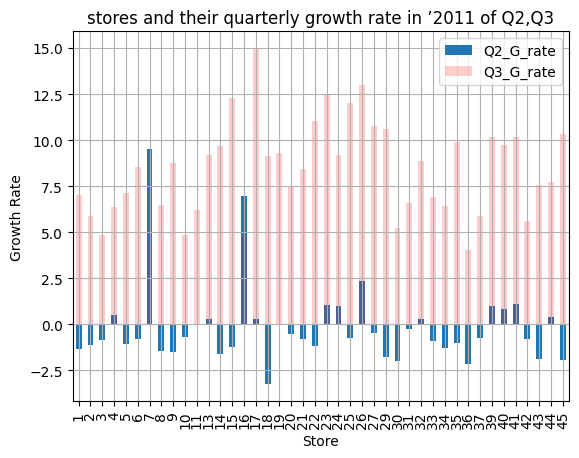

In [141]:
Growth_rateQ2.plot(ax=Growth_rateQ3.plot(kind='bar'),kind='bar',color='red',alpha=0.2,legend=True)
plt.legend(['Q2_G_rate','Q3_G_rate'])
plt.ylabel('Growth Rate')
plt.grid(True)
plt.title('stores and their quarterly growth rate in ’2011'' of Q2,Q3')
print('min-G_rate-Q3-',Growth_rateQ3.min())
print('max-G_rate-Q3',Growth_rateQ3.max())

print(Growth_rateQ3.sort_values().head(5))


max= 14.99062378670375
min  = 4.0466444735389455
Average= 8.334356460311799
std= 2.5937401032119993
Here, store-23 which has performed better in the 2nd quarter as compared to the 3rd and 4th quarter than all othe stores.
max= 9.515736797193492
min  = -3.24861142315544
Average= -0.18803202768574873
std= 2.212306706016062
max= Coefficient of mean to std    0.208185
dtype: float64
min  = Coefficient of mean to std    0.040715
dtype: float64
Average= Coefficient of mean to std    0.114575
dtype: float64
std= Coefficient of mean to std    0.040642
dtype: float64


,Coefficient of mean to std
Store,
35,0.208185
7,0.190005
15,0.178482
23,0.173230
29,0.167125


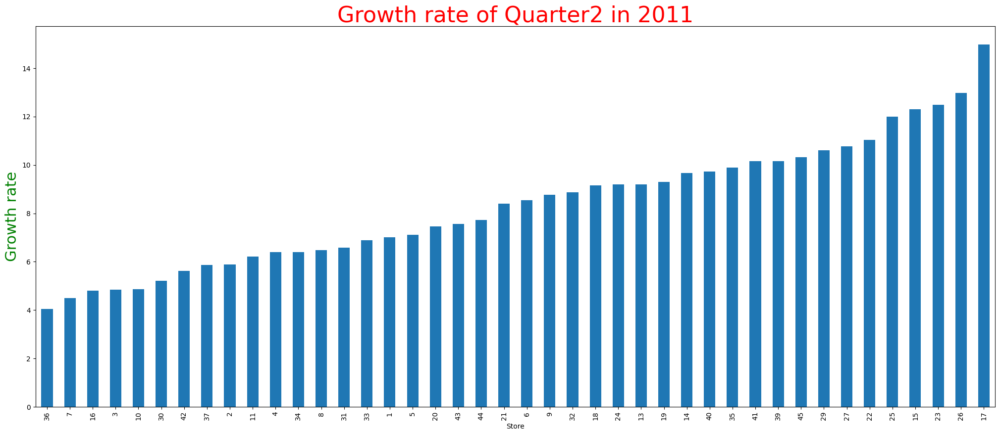

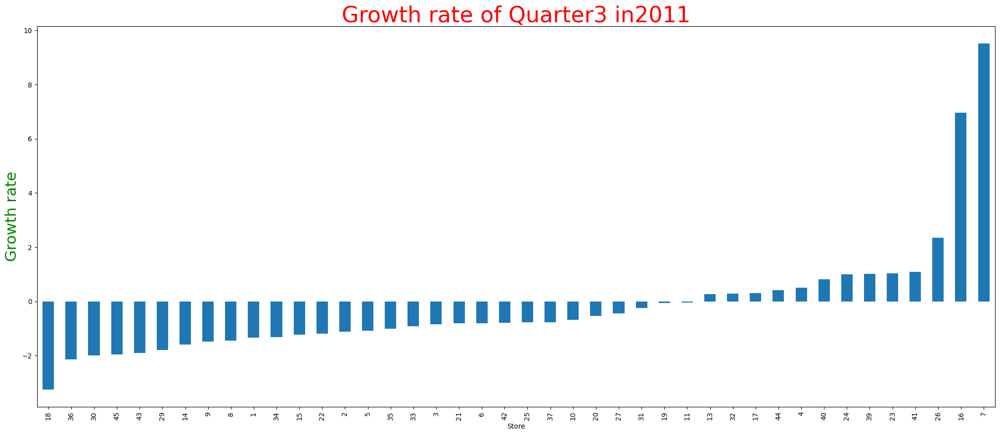

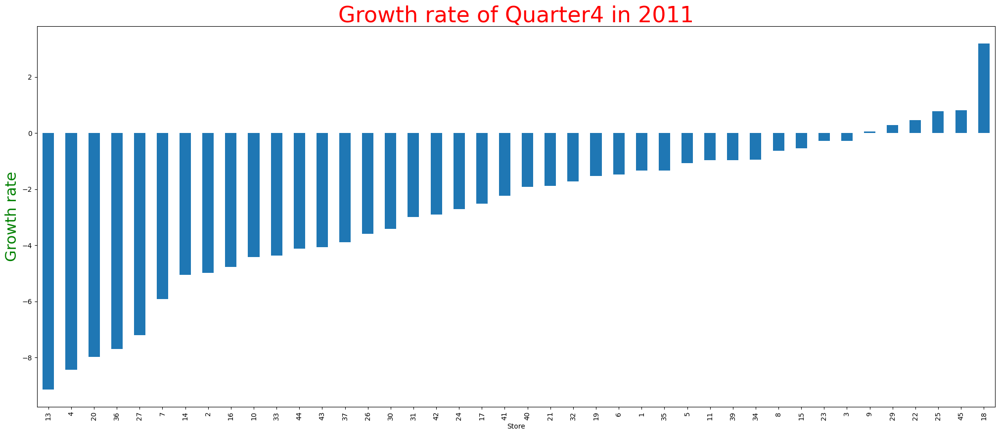

In [142]:
plt.figure(figsize=(25,10))
Growth_rateQ2.sort_values().plot(kind='bar')
plt.title('Growth rate of Quarter2 in 2011',color='r',fontsize=32)
plt.ylabel('Growth rate',color='g',fontsize=22)

print('max=',Growth_rateQ2.max())
print('min  =',Growth_rateQ2.min())
print('Average=',Growth_rateQ2.mean())
print('std=',Growth_rateQ2.std())
Growth_rateQ2.head()


print('Here, store-23 which has performed better in the 2nd quarter as compared to the 3rd and 4th quarter than all othe stores.')

plt.figure(figsize=(25,10))
Growth_rateQ3.sort_values().plot(kind='bar')
plt.title('Growth rate of Quarter3 in2011',color='r',fontsize=32)
plt.ylabel('Growth rate',color='g',fontsize=22)

print('max=',Growth_rateQ3.max())
print('min  =',Growth_rateQ3.min())
print('Average=',Growth_rateQ3.mean())
print('std=',Growth_rateQ3.std())
Growth_rateQ3.head()

plt.figure(figsize=(25,10))
Growth_rateQ4.sort_values().plot(kind='bar')
plt.title('Growth rate of Quarter4 in 2011',color='r',fontsize=32)
plt.ylabel('Growth rate',color='g',fontsize=22)

print('max=',coeficient.max())
print('min  =',coeficient.min())
print('Average=',coeficient.mean())
print('std=',coeficient.std())
coeficient.head()

# 3) Which store/s has good quarterly growth rate in ’2012 ?

Text(0.5, 1.0, 'stores and their quarterly growth rate in ’2012')

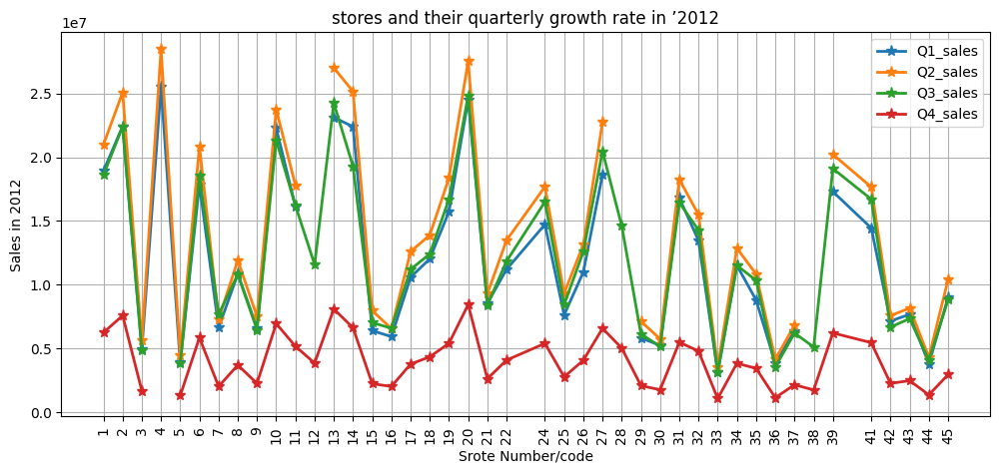

In [143]:
Q1_sales12=walmart[(walmart['Date']<='2012-03-31')&(walmart['Date']>='2012-01-01')].groupby('Store')['Weekly_Sales'].sum()
Q2_sales12=walmart[(walmart['Date']>='2012-04-01')&(walmart['Date']<='2012-06-30')].groupby('Store')['Weekly_Sales'].sum()
Q3_sales12=walmart[(walmart['Date']>='2012-07-01')&(walmart['Date']<='2012-09-30')].groupby('Store')['Weekly_Sales'].sum()
Q4_sales12=walmart[(walmart['Date']>='2012-10-01')&(walmart['Date']<='2012-12-31')].groupby('Store')['Weekly_Sales'].sum()

Q_Sales12={'Q1_sales':Q1_sales12,'Q2_sales':Q2_sales12,'Q3_sales':Q3_sales12,'Q4_sales':Q4_sales12}
Q_Sales12=pd.DataFrame(Q_Sales12)
Q_Sales12.head(2)
Q_Sales12.index

plt.figure(figsize=(12,5))
plt.plot(Q_Sales12, linewidth=2, markersize=8,marker='*')
plt.legend(Q_Sales12.columns.to_list())
plt.grid(True)
plt.ylabel('Sales in 2012')
plt.xlabel('Srote Number/code')
plt.xticks(Q_Sales12.index,rotation=90)
plt.title('stores and their quarterly growth rate in ’2012')

- From the above inference Quartile3 and Quartile2 Sales are having heigher rating in Sales. in Store 4, 20 and 13

- From the above inference Quartile3 and Quartile2 Sales are having lesser rating in Sales. in Stores3,5,30, 33,36,38,40..etc. in the year 2012.

- And there is no Sales information in Store 23,40.

Store Number 4  is having More  Quaterly growth among the all then stores. in Q3
 Store Number 20  is having More  Quaterly growth among the all then stores. in both Q2 and Q3


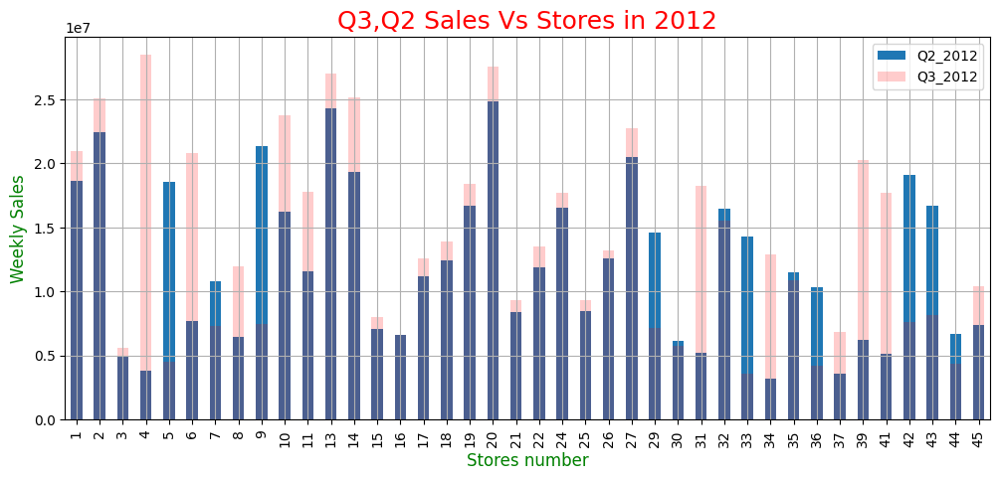

In [146]:
plt.figure(figsize=(12,5))
Q2_sales12.plot(ax=Q3_sales12.plot(kind='bar'),kind='bar',color='r',alpha=0.2,legend=True)
plt.legend(['Q2_2012','Q3_2012'])
plt.grid(True)
plt.xlabel('Stores number',color='g',fontsize=12)
plt.ylabel('Weekly Sales',color='g',fontsize=12)
plt.title('Q3,Q2 Sales Vs Stores in 2012',color='r',fontsize=18)
print('Store Number 4  is having More  Quaterly growth among the all then stores. in Q3\n','Store Number 20  is having More  Quaterly growth among the all then stores. in both Q2 and Q3')

# Calculating Growth rate of Stores in '2012
To calculate the growth rate, take the current value and subtract that from the previous value. Next, divide this difference by the previous value and multiply by 100 to get a percentage representation of the rate of growth.

       Growth_rateQ2  Growth_rateQ3  Growth_rateQ4
Store                                             
1           7.003852      -3.792057     -22.135817
2           5.878269      -3.560130     -22.053622
3           4.851869      -4.332738     -21.851499
4           6.390023            NaN            NaN
5           7.111035      -4.875119     -21.957740
[There is No information about  growth rate in Stores12, 23, 28, 38 and 40 .]


Text(0.5, 1.0, 'stores and their quarterly growth rate in ’2012')

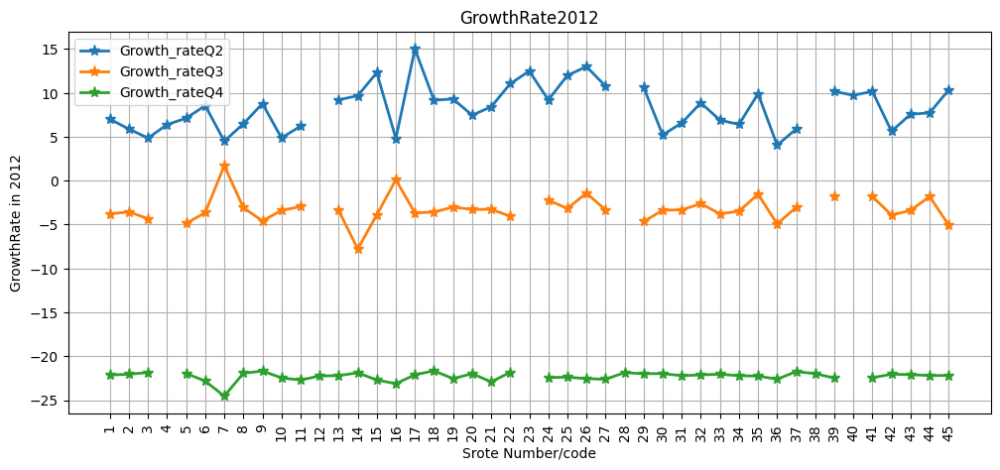

<Figure size 1200x500 with 0 Axes>

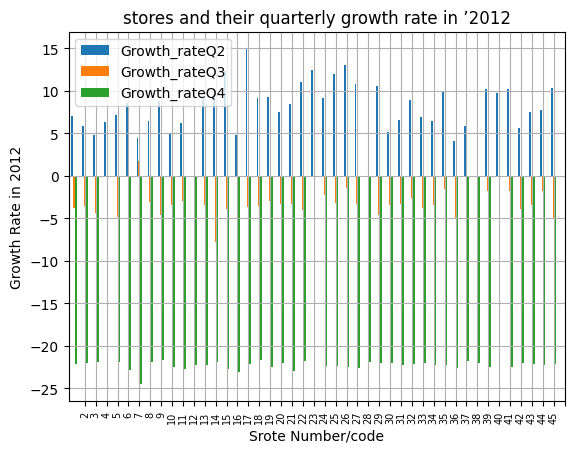

In [147]:
Growth_rateQ2
Growth_rateQ3 =((Q3_sales12-Q2_sales12)/Q2_sales12*100)/3
Growth_rateQ3
Growth_rateQ4 =((Q4_sales12-Q3_sales12)/Q3_sales12*100)/3
Growth_rateQ4
GrowthRate2012={'Growth_rateQ2':Growth_rateQ2,'Growth_rateQ3':Growth_rateQ3,'Growth_rateQ4':Growth_rateQ4}
GrowthRate2012=pd.DataFrame(GrowthRate2012)
print(GrowthRate2012.head())

plt.figure(figsize=(12,5))
plt.plot(GrowthRate2012, linewidth=2, markersize=8,marker='*')
plt.legend(GrowthRate2012.columns.to_list())
plt.grid(True)
plt.ylabel('GrowthRate in 2012')
plt.xlabel('Srote Number/code')
plt.xticks(GrowthRate2012.index,rotation=90)
plt.title('GrowthRate2012')

print('[There is No information about  growth rate in Stores12, 23, 28, 38 and 40 .]')

plt.figure(figsize=(12,5))
GrowthRate2012.plot(kind='bar')
plt.grid(True)
plt.ylabel('Growth Rate in 2012')
plt.xlabel('Srote Number/code')
plt.xticks(GrowthRate2012.index,rotation=90,fontsize=7)
plt.title('stores and their quarterly growth rate in ’2012')

min-G_rate-Q3- -7.781570410232029
max-G_rate-Q3 1.710139395773398
Store
14   -7.781570
45   -5.055809
36   -4.929590
5    -4.875119
29   -4.654233
Name: Weekly_Sales, dtype: float64


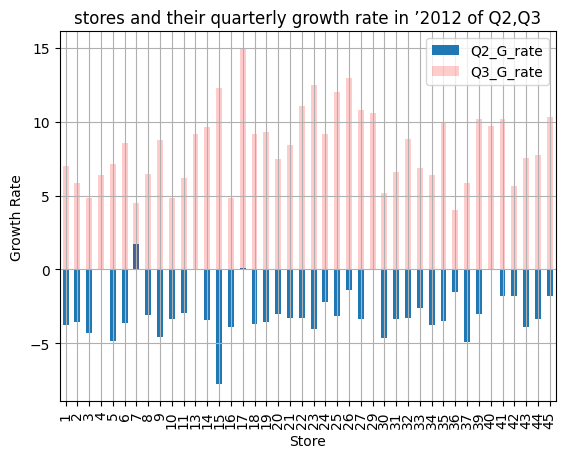

In [148]:
Growth_rateQ2.plot(ax=Growth_rateQ3.plot(kind='bar'),kind='bar',color='red',alpha=0.2,legend=True)
plt.legend(['Q2_G_rate','Q3_G_rate'])
plt.ylabel('Growth Rate')
plt.grid(True)
plt.title('stores and their quarterly growth rate in ’2012'' of Q2,Q3')
print('min-G_rate-Q3-',Growth_rateQ3.min())
print('max-G_rate-Q3',Growth_rateQ3.max())

print(Growth_rateQ3.sort_values().head(5))


max= 14.99062378670375
min  = 4.0466444735389455
Average= 8.334356460311799
std= 2.5937401032119993
Here, store-23 which has performed better in the 2nd quarter as compared to the 3rd and 4th quarter than all othe stores.
max= 1.710139395773398
min  = -7.781570410232029
Average= -3.25805065630396
std= 1.5117510613181666
max= Coefficient of mean to std    0.208185
dtype: float64
min  = Coefficient of mean to std    0.040715
dtype: float64
Average= Coefficient of mean to std    0.114575
dtype: float64
std= Coefficient of mean to std    0.040642
dtype: float64


,Coefficient of mean to std
Store,
35,0.208185
7,0.190005
15,0.178482
23,0.173230
29,0.167125


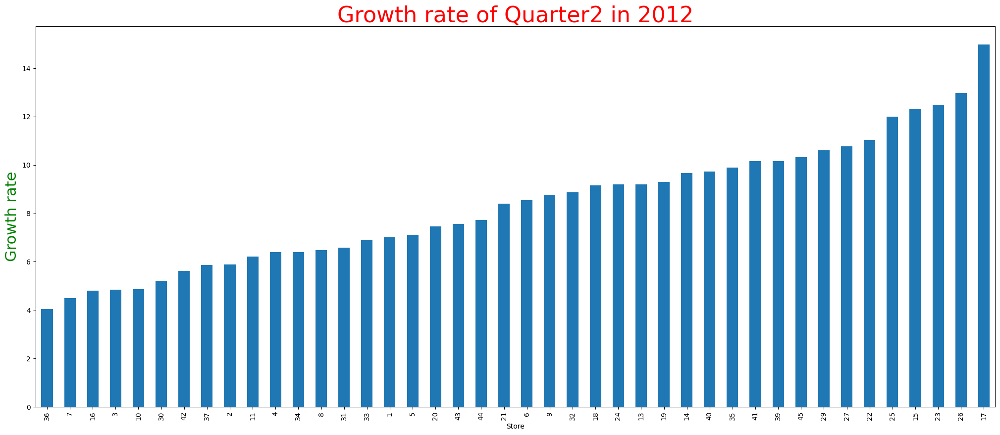

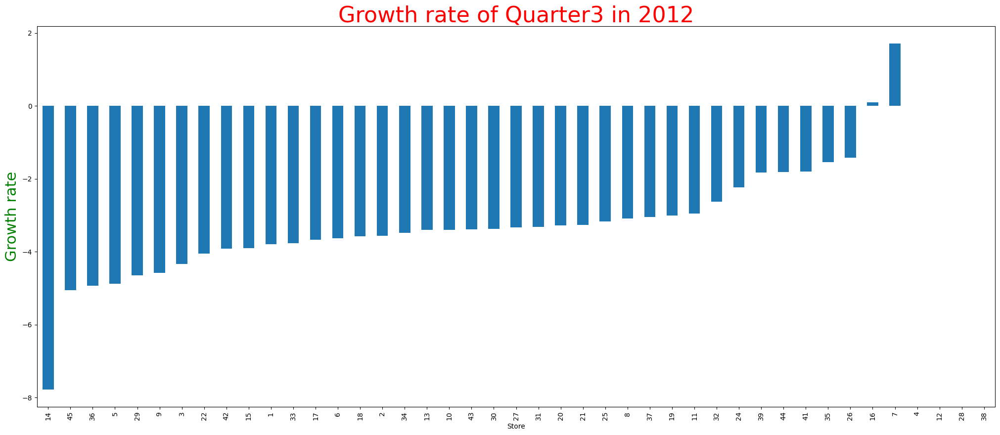

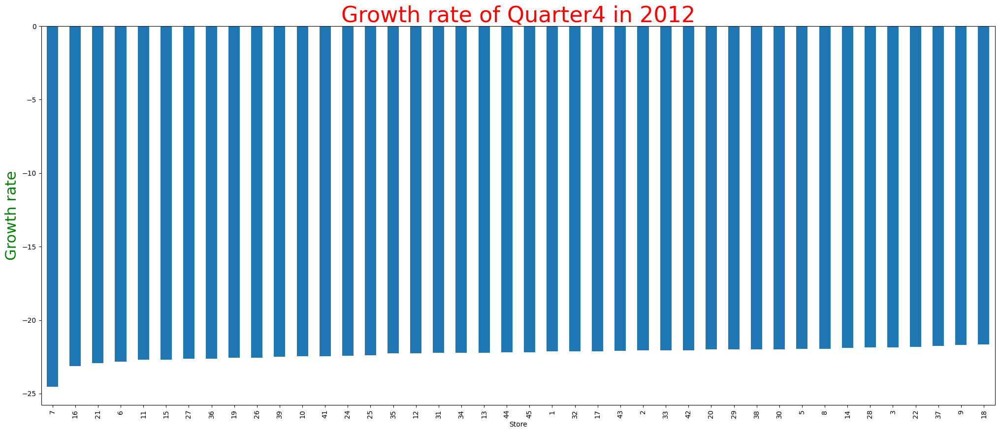

In [149]:
plt.figure(figsize=(25,10))
Growth_rateQ2.sort_values().plot(kind='bar')
plt.title('Growth rate of Quarter2 in 2012',color='r',fontsize=32)
plt.ylabel('Growth rate',color='g',fontsize=22)

print('max=',Growth_rateQ2.max())
print('min  =',Growth_rateQ2.min())
print('Average=',Growth_rateQ2.mean())
print('std=',Growth_rateQ2.std())
Growth_rateQ2.head()

print('Here, store-23 which has performed better in the 2nd quarter as compared to the 3rd and 4th quarter than all othe stores.')

plt.figure(figsize=(25,10))
Growth_rateQ3.sort_values().plot(kind='bar')
plt.title('Growth rate of Quarter3 in 2012',color='r',fontsize=32)
plt.ylabel('Growth rate',color='g',fontsize=22)

print('max=',Growth_rateQ3.max())
print('min  =',Growth_rateQ3.min())
print('Average=',Growth_rateQ3.mean())
print('std=',Growth_rateQ3.std())
Growth_rateQ3.head()

plt.figure(figsize=(25,10))
Growth_rateQ4.sort_values().plot(kind='bar')
plt.title('Growth rate of Quarter4 in 2012',color='r',fontsize=32)
plt.ylabel('Growth rate',color='g',fontsize=22)

print('max=',coeficient.max())
print('min  =',coeficient.min())
print('Average=',coeficient.mean())
print('std=',coeficient.std())
coeficient.head()

In [150]:
walmart['monthlySales']=monthlySales
M_S_Store=walmart.groupby('Store')['monthlySales'].value_counts()
M_S_Store

Store  monthlySales
1      536.0           2
       546.0           2
       252.0           1
       311.0           1
       371.0           1
       420.0           1
       496.0           1
       580.0           1
       588.0           1
Name: count, dtype: int64

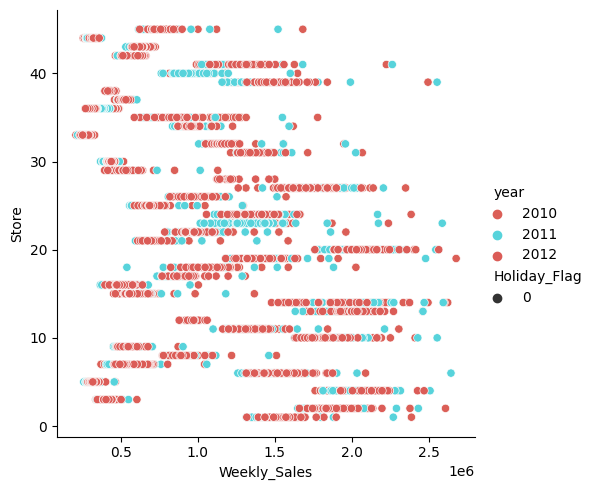

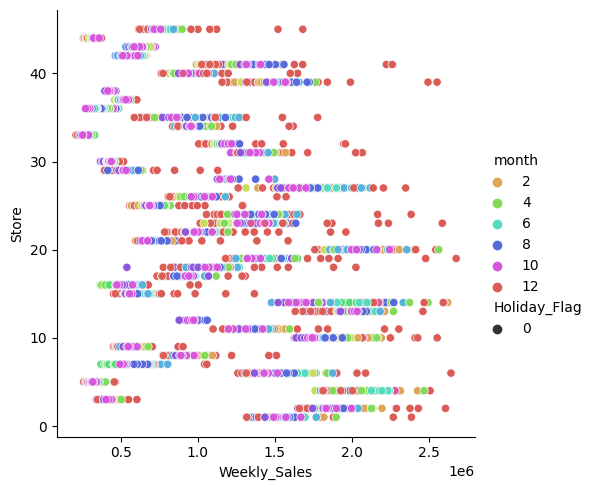

In [152]:
sns.relplot(
    data=walmart, legend='auto',
    kind='scatter',
    x="Weekly_Sales", y="Store", col=None,palette='hls',
    hue="year", style="Holiday_Flag",
    facet_kws=dict(sharex=True),
)

sns.relplot(
    data=walmart, legend='auto',
    kind='scatter',
    x="Weekly_Sales", y="Store", col=None,palette='hls',
    hue="month", style="Holiday_Flag",
    facet_kws=dict(sharex=False),
)

In [155]:
w2010=walmart[(walmart['Date']<='2010-12-31')&(walmart['Date']>='2010-01-01')].groupby(['Store','year'])['Weekly_Sales'].sum()
w2011=walmart[(walmart['Date']<='2011-12-31')&(walmart['Date']>='2011-01-01')].groupby(['Store','year'])['Weekly_Sales'].sum()
w2012=walmart[(walmart['Date']<='2012-12-31')&(walmart['Date']>='2012-01-01')].groupby(['Store','year'])['Weekly_Sales'].sum()
x=walmart['Store']

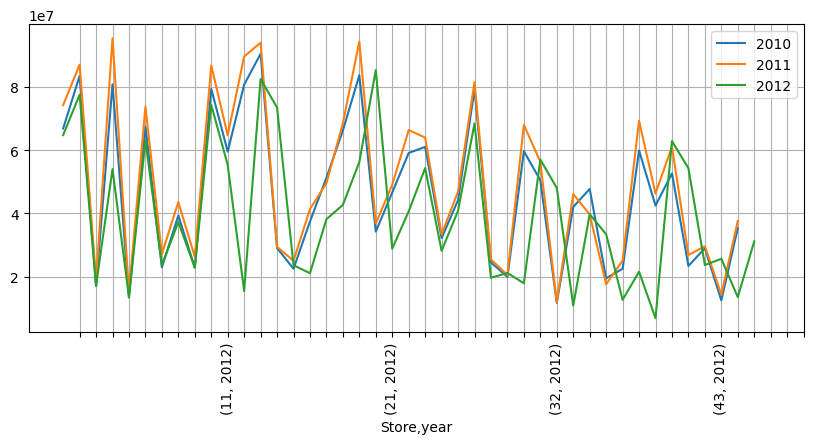

In [156]:
plt.figure(figsize=(10,4))
w2010.plot(kind='line')
w2011.plot(kind='line')
w2012.plot(kind='line')
plt.xticks(GrowthRate2012.index,rotation=90,fontsize=10)
plt.legend([2010,2011,2012],loc='best')
plt.grid(True)

- In 2011- Store No 4>13>19 Re the top three Store which are having highest Sales Athan  2010, 2012 years.

- In 2010   -Store 19 is having the highest Sales than  all stores in 2012.

- In 2012  Store Numbers 2 and 20  having highest Sales  among all the stores in 2012.

Text(0.5, 1.0, 'stores and their quarterly growth rate in ’2011')

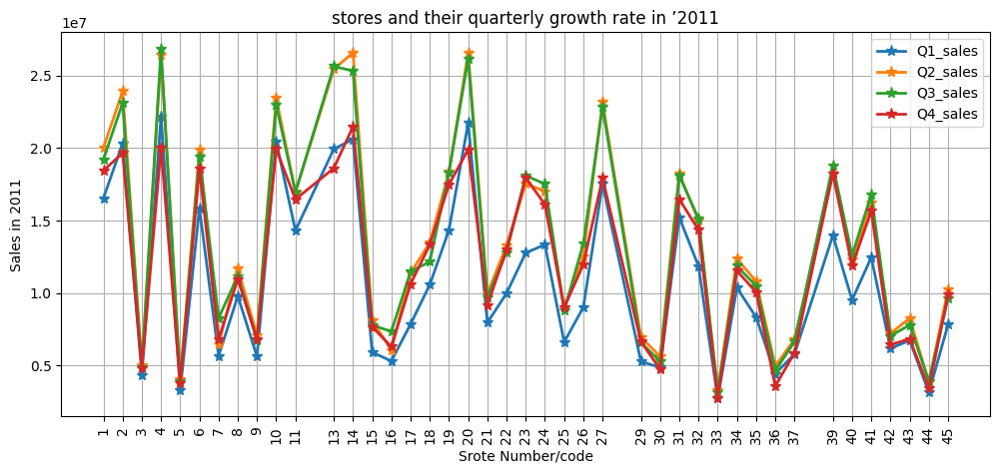

In [157]:
plt.figure(figsize=(12,5))
plt.plot(Q_Sales11, linewidth=2, markersize=8,marker='*')
plt.legend(Q_Sales11.columns.to_list())
plt.grid(True)
plt.ylabel('Sales in 2011')
plt.xlabel('Srote Number/code')
plt.xticks(Q_Sales11.index,rotation=90)
plt.title('stores and their quarterly growth rate in ’2011')

Text(0, 0.5, 'Weekly_Sales')

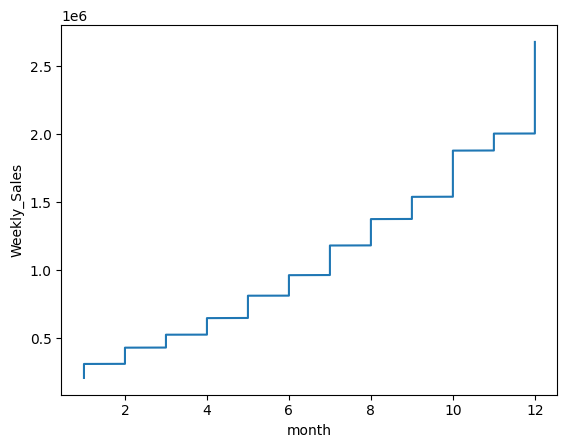

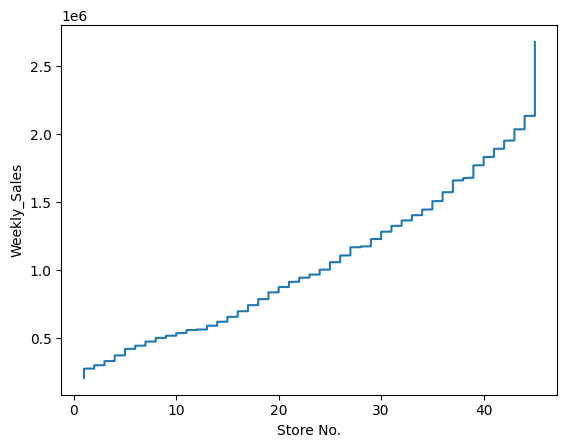

In [158]:
plt.subplots(1,1)
y1=walmart['month'].sort_values()
y2=walmart['Weekly_Sales'].sort_values()
y3=walmart['Store']

#print(y1)
plt.plot(y1,y2)
plt.xlabel('month')
plt.ylabel('Weekly_Sales')

plt.subplots(1,1)
plt.plot(y3,y2)
plt.xlabel('Store No.')
plt.ylabel('Weekly_Sales')

606      1
1750     1
931      1
177      1
1122     1
        ..
3709    31
2994    31
1993    31
2136    31
134     31
Name: Days, Length: 5507, dtype: int32


Text(0, 0.5, 'Weekly_Sales')

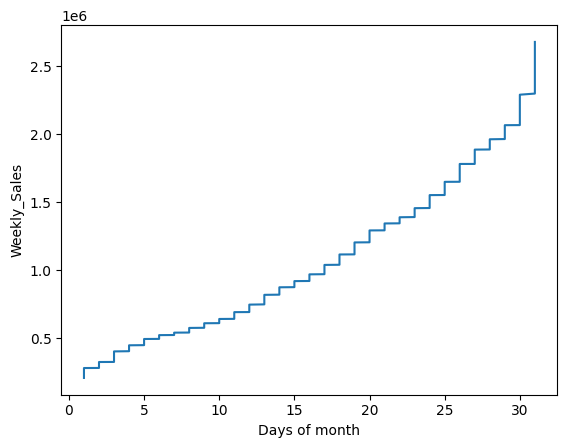

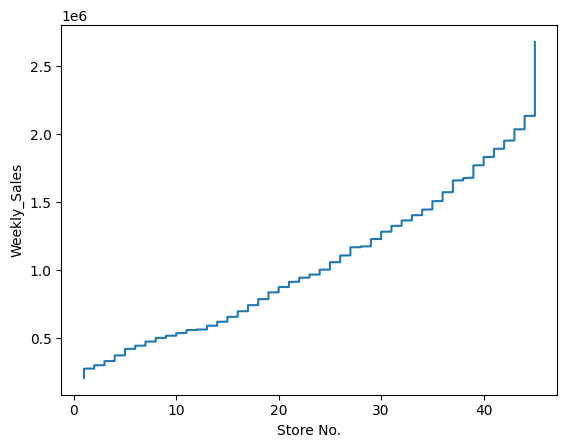

In [159]:
plt.subplots(1,1)
y1=walmart['Days'].sort_values()
y2=walmart['Weekly_Sales'].sort_values()
y3=walmart['Store']

print(y1)
plt.plot(y1,y2)
plt.xlabel('Days of month')
plt.ylabel('Weekly_Sales')

plt.subplots(1,1)
plt.plot(y3,y2)
plt.xlabel('Store No.')
plt.ylabel('Weekly_Sales')

# Temperature:
Does temperature affect the weekly sales in any manner?

In [165]:
print(walmart['Temperature'].value_counts())
print(walmart['Temperature'].sort_values())

Temperature
67.87    10
72.62     9
70.28     9
44.42     7
50.56     7
         ..
72.30     1
83.90     1
68.85     1
57.53     1
30.59     1
Name: count, Length: 3210, dtype: int64
5628      9.51
3575      9.55
906      10.09
909      10.11
858      10.53
         ...  
4649     98.43
4658     99.20
4657     99.66
4707    100.07
4599    100.14
Name: Temperature, Length: 5507, dtype: float64


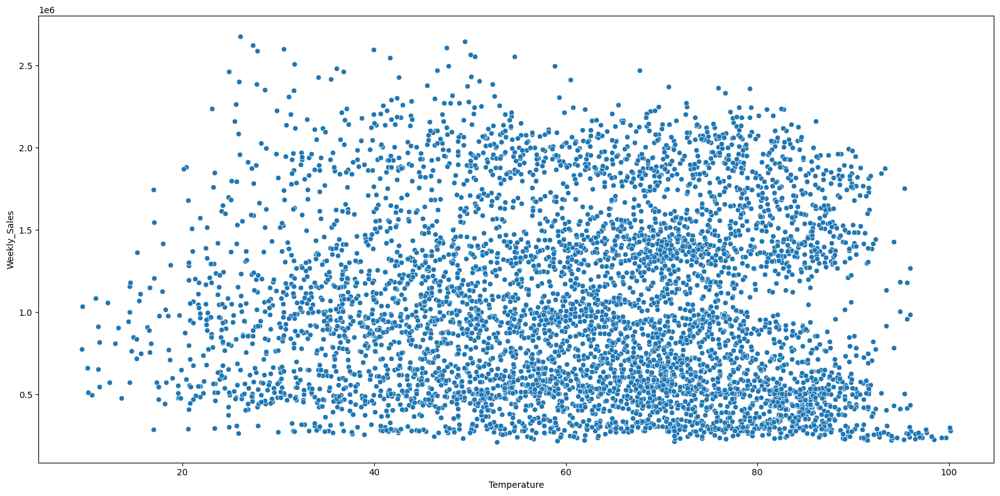

In [166]:
plt.figure(figsize=(16,8))
sns.scatterplot(x=walmart["Temperature"],y=walmart["Weekly_Sales"])
plt.tight_layout()

Text(0.5, 1.0, 'Temperature affecting the weekly sales of various stores')

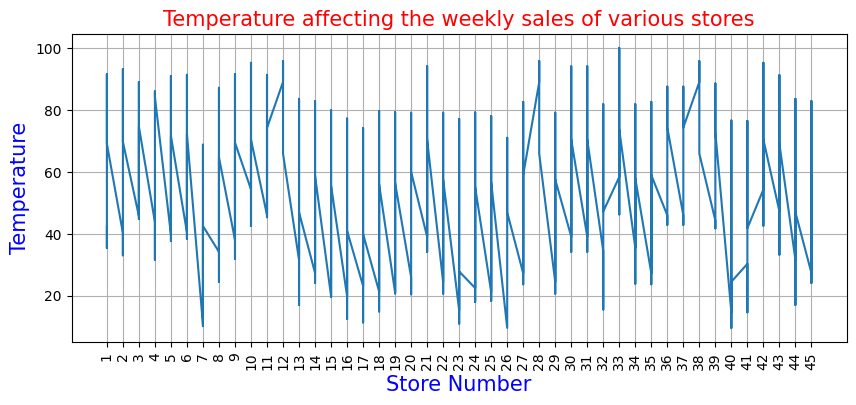

In [167]:
tempSales=walmart[['Store','Temperature','Weekly_Sales']]
y=tempSales['Temperature']
x=tempSales['Store']
plt.figure(figsize=(10,4))
plt.plot(x,y)
plt.xticks(GrowthRate2012.index,rotation=90,fontsize=10)
plt.grid(True)
plt.xlabel('Store Number',color='blue',fontsize=15)
plt.ylabel('Temperature',color='blue',fontsize=15)
plt.title('Temperature affecting the weekly sales of various stores',color='red',fontsize=15)

In [168]:
Sales_temp=walmart[['Store','Weekly_Sales','Temperature']].sort_values(by='Temperature')
print(Sales_temp)
Sales_Temp=walmart[['Store','Weekly_Sales','Temperature']].value_counts()
print(Sales_Temp)

      Store  Weekly_Sales  Temperature
5628     40     775910.43         9.51
3575     26    1034119.21         9.55
906       7     661163.94        10.09
909       7     513372.17        10.11
858       7     496725.44        10.53
...     ...           ...          ...
4649     33     226702.36        98.43
4658     33     239198.36        99.20
4657     33     237095.82        99.66
4707     33     297753.49       100.07
4599     33     280937.84       100.14

[5507 rows x 3 columns]
Store  Weekly_Sales  Temperature
1      1316899.31    43.83          1
30     492022.68     46.54          1
31     1257921.28    67.51          1
       1254955.68    44.04          1
       1243200.24    66.93          1
                                   ..
15     718470.71     45.27          1
       709337.11     66.13          1
       699028.66     45.67          1
       695396.19     69.80          1
45     1682862.03    30.59          1
Name: count, Length: 5507, dtype: int64


-  Store- 40 ,Weekly_Sales -775910.43, Temperature -9.51 (Lower Temperature) 
- Store  -33 ,Weekly_Sales  - 280937.84 , Temperature -100.14 (Higher Temperature)

# CPI:
How is the Consumer Price index affecting the weekly sales of various stores?

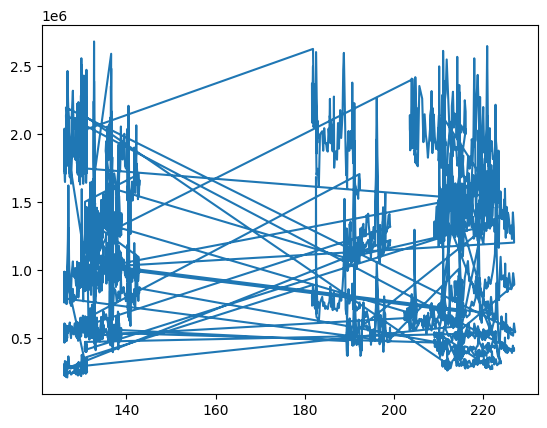

In [169]:
x=walmart["CPI"]
y=walmart["Weekly_Sales"]
plt.plot(x,y)

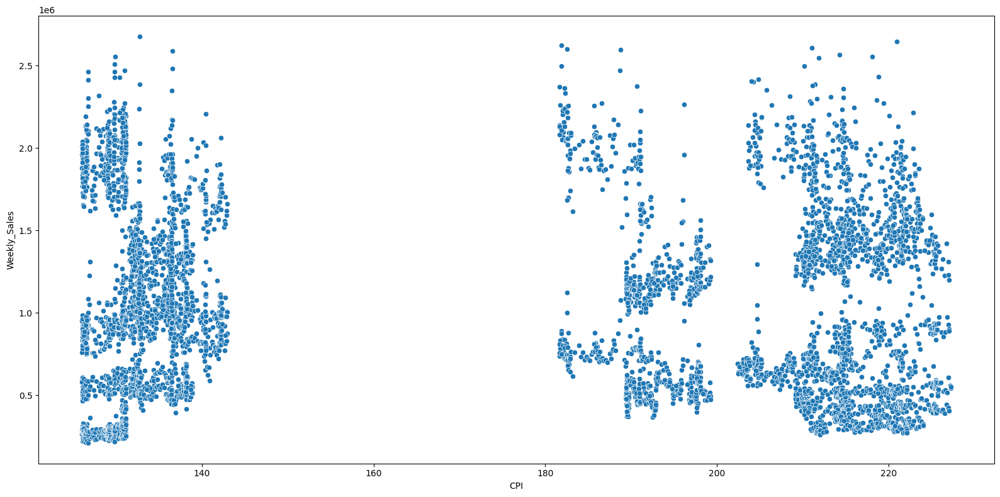

In [170]:
plt.figure(figsize=(16,8))
sns.scatterplot(x=walmart["CPI"],y=walmart["Weekly_Sales"])
plt.tight_layout()

Text(0.5, 1.0, 'CPI affecting the weekly sales of various stores')

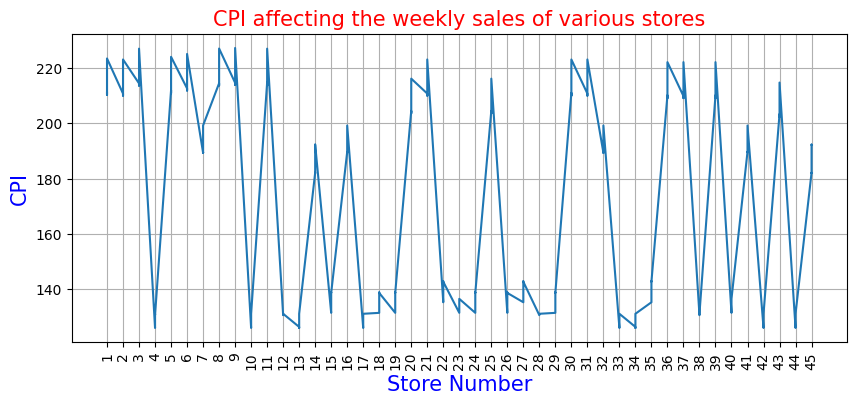

In [171]:
cpiSales=walmart[['Store','CPI','Weekly_Sales']]
y=cpiSales['CPI']
x=cpiSales['Store']
plt.figure(figsize=(10,4))
plt.plot(x,y)
plt.xticks(GrowthRate2012.index,rotation=90,fontsize=10)
plt.grid(True)
plt.xlabel('Store Number',color='blue',fontsize=15)
plt.ylabel('CPI',color='blue',fontsize=15)
plt.title('CPI affecting the weekly sales of various stores',color='red',fontsize=15)

      Store         CPI  Weekly_Sales
5890     42  126.064000     583079.97
4603     33  126.064000     265367.51
456       4  126.064000    2007050.75
4746     34  126.064000     951208.65
1743     13  126.064000    1877592.55
...     ...         ...           ...
1142      8  227.018417     900309.75
1143      8  227.036936     891671.44
1284      9  227.169392     558464.80
1285      9  227.214288     542009.46
1286      9  227.232807     549731.49

[5507 rows x 3 columns]


<Axes: >

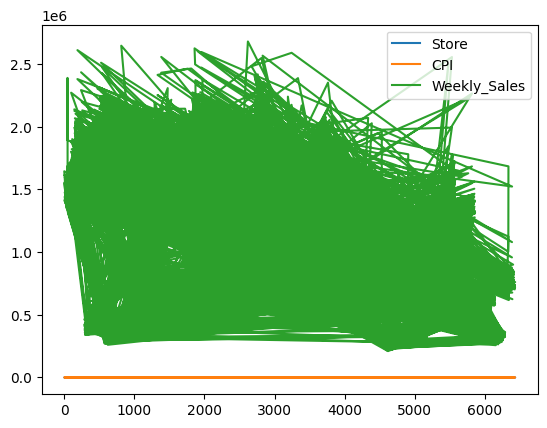

In [172]:
print(cpiSales.sort_values(by='CPI'))
cpiSales.sort_values(by='CPI').plot()

- Min   CPI=126.064000   ,  583079.97(weekly sales)
- Max   CPI=227.232807   ,  549731.49(weekly sales)

In [185]:
walmart['CPI'].sort_values().value_counts()

CPI
130.977667    10
130.756161    10
131.193097    10
131.149968    10
130.683000    10
              ..
214.721659     1
214.725785     1
214.741539     1
214.741552     1
227.232807     1
Name: count, Length: 1994, dtype: int64

In [208]:
print(walmart[walmart['CPI']==227.232807].count())
walmart[(walmart['Store']==9)&(walmart['CPI'])]


Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
Days            0
month           0
year            0
monthlySales    0
dtype: int64


,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Days,month,year,monthlySales
1144,9,2010-02-05,549505.55,0,38.01,2,214.655459,6.415,5,2,2010,NaN
1146,9,2010-02-19,511327.90,0,43.06,2,214.850618,6.415,19,2,2010,NaN
1147,9,2010-02-26,473773.27,0,43.83,2,214.878045,6.415,26,2,2010,NaN
1148,9,2010-03-05,507297.88,0,48.43,2,214.905472,6.415,5,3,2010,NaN
1149,9,2010-03-12,494145.80,0,55.76,2,214.932899,6.415,12,3,2010,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
1282,9,2012-09-28,516361.06,0,76.80,3,226.763073,5.277,28,9,2012,NaN
1283,9,2012-10-05,606755.30,0,66.61,3,226.966232,4.954,5,10,2012,NaN
1284,9,2012-10-12,558464.80,0,60.09,3,227.169392,4.954,12,10,2012,NaN
1285,9,2012-10-19,542009.46,0,68.01,3,227.214288,4.954,19,10,2012,NaN


In [209]:
print(walmart[walmart['CPI']==126.064000].count())
walmart[walmart['CPI']==126.064000]

Store           8
Date            8
Weekly_Sales    8
Holiday_Flag    8
Temperature     8
Fuel_Price      8
CPI             8
Unemployment    8
Days            8
month           8
year            8
monthlySales    0
dtype: int64


,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Days,month,year,monthlySales
456,4,2010-08-13,2007050.75,0,78.08,2,126.064,7.372,13,8,2010,NaN
1314,10,2010-08-13,1962996.70,0,88.37,3,126.064,9.199,13,8,2010,NaN
1743,13,2010-08-13,1877592.55,0,74.93,2,126.064,7.951,13,8,2010,NaN
2315,17,2010-08-13,759995.18,0,65.17,2,126.064,6.697,13,8,2010,NaN
4603,33,2010-08-13,265367.51,0,95.57,3,126.064,9.495,13,8,2010,NaN
4746,34,2010-08-13,951208.65,0,76.72,2,126.064,9.816,13,8,2010,NaN
5890,42,2010-08-13,583079.97,0,88.37,3,126.064,9.199,13,8,2010,NaN
6176,44,2010-08-13,291028.09,0,74.93,2,126.064,7.804,13,8,2010,NaN


There was No effect of CPI on the weekly sales of various stores.

# Top performing stores according to the historical data.
Top performing stores according to the historical data. is Store-19 in 2010 with 2678206.42 Weekly Sales.

In [210]:
walmart[['Store','year','Weekly_Sales']].sort_values(by='Weekly_Sales',ascending=False)

,Store,year,Weekly_Sales
2620,19,2010,2678206.42
813,6,2011,2644633.02
1859,14,2010,2623469.95
188,2,2010,2609166.75
1903,14,2010,2600519.26
...,...,...,...
4610,33,2010,224294.39
4605,33,2010,224031.19
4671,33,2011,220060.35
4614,33,2010,213538.32


# The worst performing store, and how significant is the difference between the highest and lowest performing stores:
    Worst performing stores according to the historical data. is Store-33 in 2010 with 209986.25 Weekly Sales.

In [211]:
per=walmart[['Store','year','Weekly_Sales']].sort_values(by='Weekly_Sales',ascending=True)
per=pd.DataFrame(per)
print('Store Number _33 is the Worst performing store among all stores')
per

Store Number _33 is the Worst performing store among all stores


,Store,year,Weekly_Sales
4619,33,2010,209986.25
4614,33,2010,213538.32
4671,33,2011,220060.35
4605,33,2010,224031.19
4610,33,2010,224294.39
...,...,...,...
1903,14,2010,2600519.26
188,2,2010,2609166.75
1859,14,2010,2623469.95
813,6,2011,2644633.02


In [212]:
differnce=walmart[['Weekly_Sales','Store']].sort_values(by='Weekly_Sales',ascending=False).max()-walmart[['Weekly_Sales','Store']].sort_values(by='Weekly_Sales',ascending=False).min()
differnce

Weekly_Sales    2468220.17
Store                44.00
dtype: float64

The Significant difference between the highest and lowest performing stores is nearly equal to the Total Weekly Sales of the Stroe 44.

# Insights Form Task-1:
A.

Store Number 43,38 ,33,29,28,12 are having Higher Unemployment Rate >=10 because of this effect its Weekly Sales were less.
Store 4 , 9, 23 , 40 are having lesser Unemployment rate <=5. I Might be Cause Higher Weekly Sales.
Store 19 is Having Higher Weekly Sales.
B.

4th month of the year has Max Sales and 1st month of the year is has min Sales.

Monthly Higher Sales: In 2010 and in 2011 -- December month But in 2012 --- June month Here, overall monthly sales are higher in the month of December while the yearly sales in the year 2011 are the highest.

Monthly Higher Orders: In 2010 --Aplril,July,October and December months in 2011 -- April,July,September and December months But in 2012 --- March, june and August months Monthly Lesser Orders: In 2010 --January,February,March,May,June,August,September and November months in 2011 -- February,March,May,June,August ,October and November months But in 2012 ---January,February,April, May.July,September and October months

Continuous 4 days of the every week is having the Heigher sales in a month.

In 2011- Store No 4>13>19 Re the top three Store which are having highest Sales than 2010, 2012 years.

In 2010 -Store 19 is having the highest Sales than all stores in 2012.

In 2012 Store Numbers 2 and 20 having highest Sales among all the stores in 2012.

C. Store Weekly_Sales Temperature 40 775910.43 9.51 (Lower Temperature) 33 280937.84 100.14 (Higher Temperature)

D. There was No effect of CPI on the weekly sales of various stores.

E. Top performing stores according to the historical data. is Store-19 in 2010 with 2678206.42 Weekly Sales.

F. Worst performing stores according to the historical data. is Store-33 in 2010 with 209986.25 Weekly Sales.

The Significant difference between the highest and lowest performing stores is nearly equal to the Total Weekly Sales of the Stroe 44.

# Task -2:
2. forecast the sales for each store for the next 12weeks.¶

# What is forecasting?
According to the PMBOK guide, “a forecast is an estimate or prediction of conditions and events in the project’s future, based on information and knowledge available at the time of the forecast.”

We may use forecasts in various situations. For example, in finance, companies use financial forecasting to project employee’s wages or set the annual budget. On the other hand, in stock trading and investing, forecasting is used to predict the future market price and performance.

forecasting can help business analysts study the impact of certain changes in the working environment (such as adjusting business hours). Another type of forecasting is weather forecasting, which predicts future atmospheric changes for a certain area and time, or changes on the Earth surface, based on meteorological observations.

In this Project we going to Forcast the futur Weekly sales in next 12 weeks in each Store.

Top benefits of forecasting Let’s see how forecasting can help your business succeed:

Forecasting helps in setting goals and plans ahead of time — Analyzing data and statistics helps businesses better evaluate their progress and adapt business operations accordingly. Forecasting helps in allocating a business budget — A forecast will give you estimates about the amount of revenue or income that is expected in a future period. This, in turn, helps companies get insight into where to allocate their budget. Forecasting helps in predicting market changes — Data and projections help companies make better adjustments to their strategies and improve operations in order to meet current market trends. This, in turn, helps them stand out from the competition.

To sum up, forecasting is an absolute necessity for any business because it helps you:

   1.Plans for both short and long term future,

   2.Invests our money wisely,

   3.Expand into new markets,

   4.Uses real-time data,

   5.Improves collaboration between team leaders, and most importantly,

   6.Plans the next steps for our business.
There are various tools that help businesses get better insight into how operations and processes currently work, and find out what needs to be changed or improved. We will mention a few forecasting tools below

# 1.Data Preparation:
Load the 'Walmart.csv' dataset and ensure the 'Date' column is in a datetime format. If not, convert it using the pd.to_datetime function.

In [216]:
walmart['Date'] = pd.to_datetime(walmart['Date'], dayfirst=True)
walmart['Date']
walmart['Date'] = pd.to_datetime(walmart['Date'])
walmart['Date']

0      2010-02-05
2      2010-02-19
3      2010-02-26
4      2010-03-05
5      2010-03-12
          ...    
6430   2012-09-28
6431   2012-10-05
6432   2012-10-12
6433   2012-10-19
6434   2012-10-26
Name: Date, Length: 5507, dtype: datetime64[ns]

# 2.Time Series Analysis:
Analyze the time series data to identify patterns, such as trends and seasonality, which can help in selecting appropriate forecasting methods. Plot the sales data over time and check for any obvious patterns.

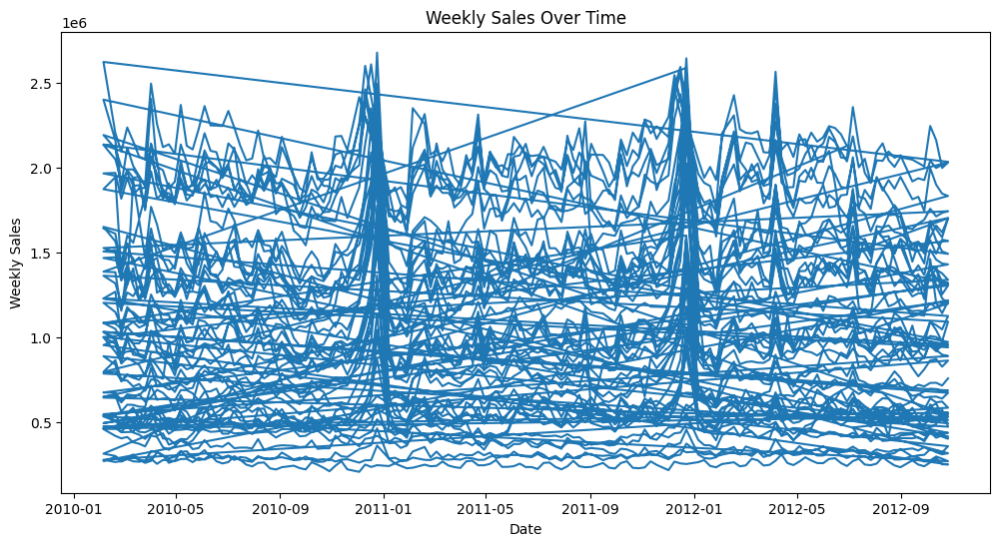

In [220]:
plt.figure(figsize=(12, 6))
plt.plot(walmart['Date'], walmart['Weekly_Sales'])
plt.xlabel('Date')
plt.ylabel('Weekly Sales')
plt.title('Weekly Sales Over Time')
plt.show()

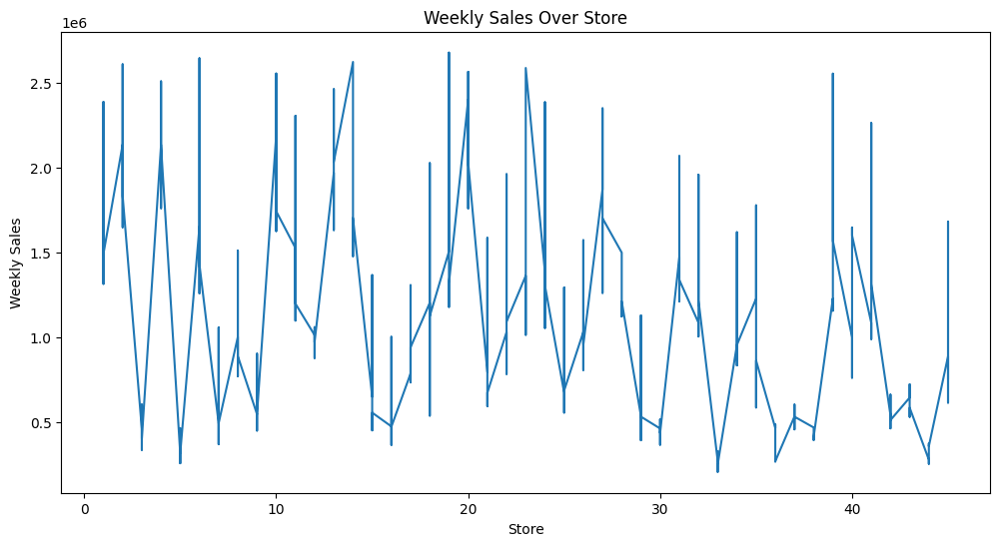

In [221]:
plt.figure(figsize=(12, 6))
plt.plot(walmart['Store'], walmart['Weekly_Sales'])
plt.xlabel('Store')
plt.ylabel('Weekly Sales')
plt.title('Weekly Sales Over Store')
plt.show()

# 3.Data Preprocessing:
Ensure the time series data is in a suitable format for forecasting. Set the 'Date' column as the index and sort the data in ascending order based on dates.

In [222]:
walmart = walmart.set_index(walmart['Date']).sort_index(ascending=True)
walmart

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Days,month,year,monthlySales
Date,,,,,,,,,,,,
2010-02-05,1,2010-02-05,1643690.90,0,42.31,2,211.096358,8.106,5,2,2010,NaN
2010-02-05,7,2010-02-05,496725.44,0,10.53,2,189.381697,9.014,5,2,2010,NaN
2010-02-05,29,2010-02-05,538634.46,0,24.36,2,131.527903,10.064,5,2,2010,NaN
2010-02-05,30,2010-02-05,465108.52,0,39.05,2,210.752605,8.324,5,2,2010,NaN
2010-02-05,6,2010-02-05,1652635.10,0,40.43,2,212.622352,7.259,5,2,2010,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2012-10-26,24,2012-10-26,1307182.29,0,55.16,4,138.728161,8.693,26,10,2012,NaN
2012-10-26,25,2012-10-26,688940.94,0,56.69,3,216.151590,7.293,26,10,2012,NaN
2012-10-26,42,2012-10-26,514756.08,0,70.50,4,131.193097,6.943,26,10,2012,NaN


In [223]:
walmart['Date'].unique()

<DatetimeArray>
['2010-02-05 00:00:00', '2010-02-19 00:00:00', '2010-02-26 00:00:00',
 '2010-03-05 00:00:00', '2010-03-12 00:00:00', '2010-03-19 00:00:00',
 '2010-03-26 00:00:00', '2010-04-02 00:00:00', '2010-04-09 00:00:00',
 '2010-04-16 00:00:00',
 ...
 '2012-08-17 00:00:00', '2012-08-24 00:00:00', '2012-08-31 00:00:00',
 '2012-09-14 00:00:00', '2012-09-21 00:00:00', '2012-09-28 00:00:00',
 '2012-10-05 00:00:00', '2012-10-12 00:00:00', '2012-10-19 00:00:00',
 '2012-10-26 00:00:00']
Length: 133, dtype: datetime64[ns]

# 4.Aggregating Sales Data:
If the data has multiple records per week, such as sales for different stores, you'll need to aggregate the sales at the weekly level. Use the 'resample' method to convert the data to a weekly frequency and sum the sales values.

In [224]:
walmart_weekly = walmart['Weekly_Sales'].resample('W').sum()
walmart_weekly

Date
2010-02-07    46619845.70
2010-02-14           0.00
2010-02-21    45363033.79
2010-02-28    41043557.90
2010-03-07    43813776.69
                 ...     
2012-09-30    39468648.67
2012-10-07    42823075.29
2012-10-14    41600039.67
2012-10-21    40743817.45
2012-10-28    41125802.72
Freq: W-SUN, Name: Weekly_Sales, Length: 143, dtype: float64

<Axes: xlabel='Date'>

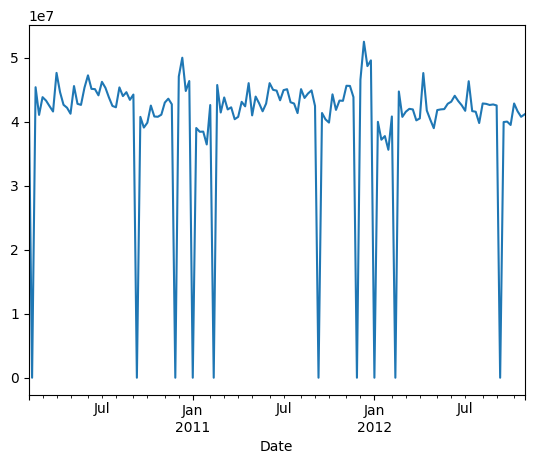

In [225]:
walmart_weekly.plot(kind='line')

In [226]:
walmart_weekly.describe()

count    1.430000e+02
mean     3.988629e+07
std      1.126497e+07
min      0.000000e+00
25%      4.077019e+07
50%      4.258178e+07
75%      4.432095e+07
max      5.246908e+07
Name: Weekly_Sales, dtype: float64

# 5.Train-Test Split:
Split the dataset into training and testing sets, keeping the last 12 weeks (3 months) for validation

In [227]:
walmart.shape

(5507, 12)

In [228]:
train_data = walmart_weekly[:-12]
test_data = walmart_weekly[-12:]
print('train data\n',train_data)
print('\ntrain_data shpe  :',train_data.shape)
print('\ntest data\n',test_data)
print('\ntest_data shape   :',test_data.shape)

train data
 Date
2010-02-07    46619845.70
2010-02-14           0.00
2010-02-21    45363033.79
2010-02-28    41043557.90
2010-03-07    43813776.69
                 ...     
2012-07-08    46300250.88
2012-07-15    41634709.15
2012-07-22    41534138.15
2012-07-29    39771212.11
2012-08-05    42826112.36
Freq: W-SUN, Name: Weekly_Sales, Length: 131, dtype: float64

train_data shpe  : (131,)

test data
 Date
2012-08-12    42765865.16
2012-08-19    42591392.82
2012-08-26    42674542.49
2012-09-02    42513724.63
2012-09-09           0.00
2012-09-16    39927432.59
2012-09-23    39996712.63
2012-09-30    39468648.67
2012-10-07    42823075.29
2012-10-14    41600039.67
2012-10-21    40743817.45
2012-10-28    41125802.72
Freq: W-SUN, Name: Weekly_Sales, dtype: float64

test_data shape   : (12,)


# 6.Model Selection and Training:
Model Selection and Training: Choose a suitable time series forecasting model, such as SARIMA, Prophet, or an exponential smoothing method. Fit the selected model to the training data.Choose a suitable time series forecasting model, such as SARIMA, Prophet, or an exponential smoothing method. Fit the selected model to the training data.

# Sarimax Model:

In [229]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
# Fit the SARIMAX model
model = SARIMAX(train_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False)
model_fit = model.fit()

# 7.Forecasting:using Sarimax
Use the trained model to make forecasts for the next 12 weeks.

In [230]:
forecast = model_fit.forecast(steps=12)
forecast

2012-08-12    3.890298e+07
2012-08-19    4.970833e+07
2012-08-26    4.852840e+07
2012-09-02    4.946942e+07
2012-09-09    4.092012e+07
2012-09-16    4.764056e+07
2012-09-23    4.662264e+07
2012-09-30    4.672886e+07
2012-10-07    4.605626e+07
2012-10-14    4.836849e+07
2012-10-21    4.150756e+07
2012-10-28    4.356554e+07
Freq: W-SUN, Name: predicted_mean, dtype: float64

<Axes: xlabel='Date'>

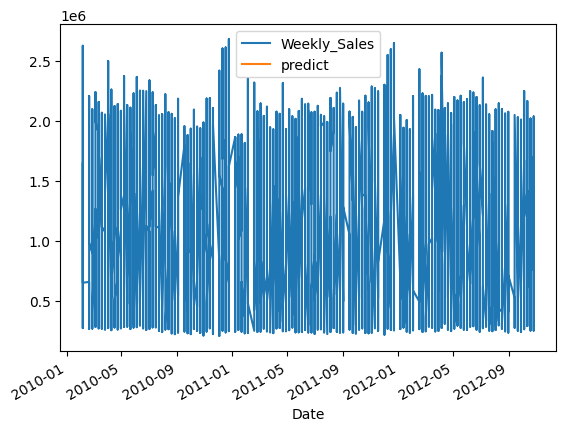

In [231]:
# Generate predictions for the test set
predictions = model_fit.predict(start=len(train_data), end=len(train_data)+len(test_data)-1, dynamic=True)

# Plot the actual and predicted values
walmart['predict'] = predictions
walmart[['Weekly_Sales', 'predict']].plot()


Date
2012-08-12    3.862888e+06
2012-08-19   -7.116937e+06
2012-08-26   -5.853854e+06
2012-09-02   -6.955691e+06
2012-09-09   -4.092012e+07
2012-09-16   -7.713128e+06
2012-09-23   -6.625924e+06
2012-09-30   -7.260214e+06
2012-10-07   -3.233189e+06
2012-10-14   -6.768452e+06
2012-10-21   -7.637410e+05
2012-10-28   -2.439739e+06
Freq: W-SUN, dtype: float64


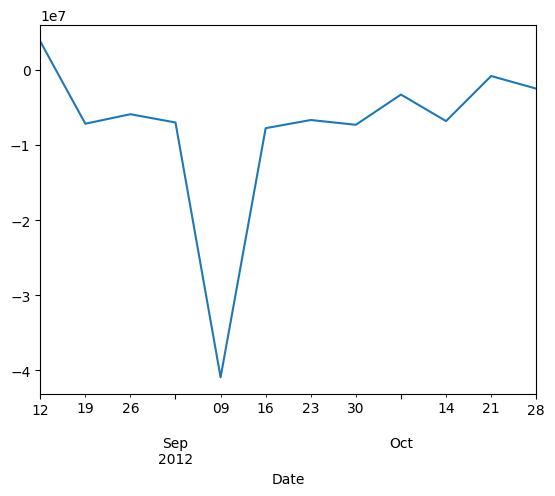

In [232]:
error=test_data-predictions
error.plot()
print(error)

# 8.Evaluation and Visualization:
Compare the forecasted values with the actual sales data from the test set. Calculate evaluation metrics such as mean absolute error (MAE) or root mean squared error (RMSE) to assess the accuracy of the model.

In [233]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
import math 
from math import sqrt
forecasted_values = forecast.values
mae = mean_absolute_error(test_data, forecasted_values)
print("Mean Absolute Error (MAE):", mae)

MSE = mean_squared_error(test_data, forecasted_values)
print("mean squared error (MSE):", MSE)
rmse = sqrt(MSE)
print('Root mean Squred error   :',rmse)

Mean Absolute Error (MAE): 8292823.530258943
mean squared error (MSE): 170132130770215.28
Root mean Squred error   : 13043470.809957573


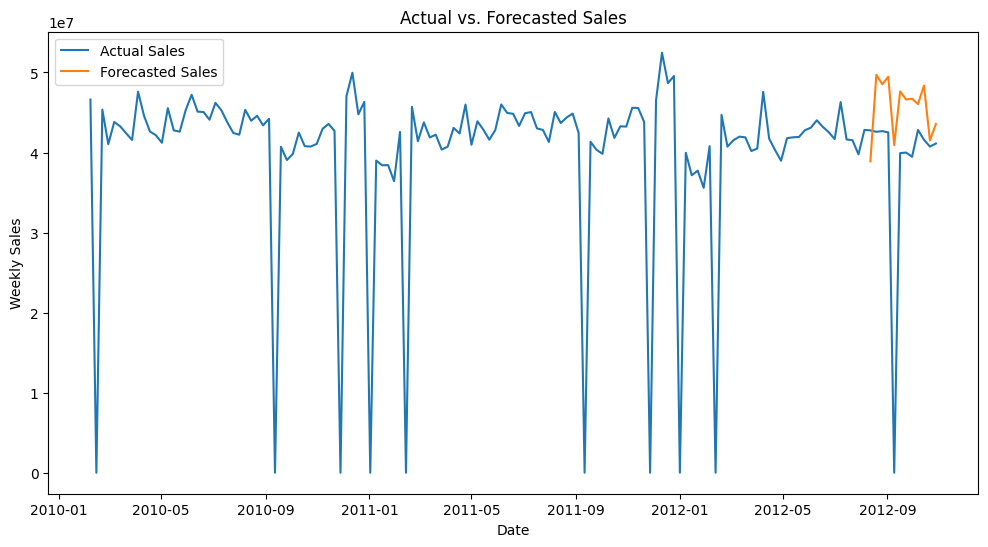

In [234]:
plt.figure(figsize=(12, 6))
plt.plot(walmart_weekly.index, walmart_weekly, label='Actual Sales')
plt.plot(test_data.index, forecasted_values, label='Forecasted Sales')
plt.xlabel('Date')
plt.ylabel('Weekly Sales')
plt.title('Actual vs. Forecasted Sales')
plt.legend()
plt.show()

<Axes: xlabel='Weekly_Sales'>

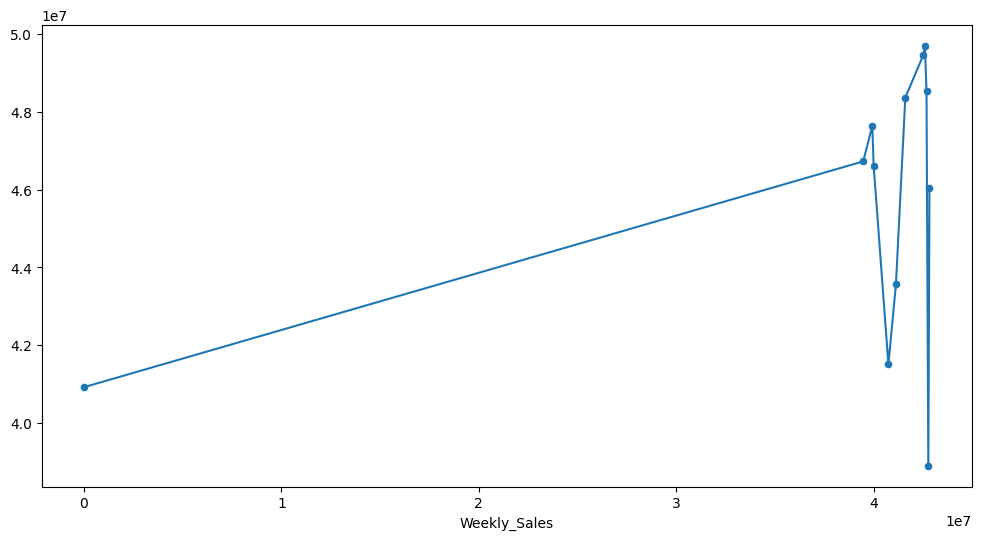

In [235]:
# scatter plot between observed and predicted values of weekly sales from KNN regressor
plt.figure(figsize = (12,6))
sns.scatterplot(x = test_data, y = forecasted_values,markers=True)
sns.lineplot(x = test_data, y = forecasted_values,markers=True)

# 9.Sales Forecasting: using Arima model
Use the trained model to make future sales forecasts for each store over the next 12 weeks.

In [236]:
future_forecast = model_fit.forecast(steps=12)
future_forecast

2012-08-12    3.890298e+07
2012-08-19    4.970833e+07
2012-08-26    4.852840e+07
2012-09-02    4.946942e+07
2012-09-09    4.092012e+07
2012-09-16    4.764056e+07
2012-09-23    4.662264e+07
2012-09-30    4.672886e+07
2012-10-07    4.605626e+07
2012-10-14    4.836849e+07
2012-10-21    4.150756e+07
2012-10-28    4.356554e+07
Freq: W-SUN, Name: predicted_mean, dtype: float64

In [237]:
from statsmodels.tsa.arima.model import ARIMA

In [238]:
train_data = walmart_weekly[:-12]
test_data = walmart_weekly[-12:]
print('train data\n',train_data)
print('\ntest data\n',test_data)

train data
 Date
2010-02-07    46619845.70
2010-02-14           0.00
2010-02-21    45363033.79
2010-02-28    41043557.90
2010-03-07    43813776.69
                 ...     
2012-07-08    46300250.88
2012-07-15    41634709.15
2012-07-22    41534138.15
2012-07-29    39771212.11
2012-08-05    42826112.36
Freq: W-SUN, Name: Weekly_Sales, Length: 131, dtype: float64

test data
 Date
2012-08-12    42765865.16
2012-08-19    42591392.82
2012-08-26    42674542.49
2012-09-02    42513724.63
2012-09-09           0.00
2012-09-16    39927432.59
2012-09-23    39996712.63
2012-09-30    39468648.67
2012-10-07    42823075.29
2012-10-14    41600039.67
2012-10-21    40743817.45
2012-10-28    41125802.72
Freq: W-SUN, Name: Weekly_Sales, dtype: float64


In [239]:
# ARIMA ---> AR + MA +I ---> ARIMA--> 3= AR , I=0 , MA=3
model = ARIMA(train_data, order=(1, 1, 1))
model_fit = model.fit() # training 
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:           Weekly_Sales   No. Observations:                  131
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2299.566
Date:                Thu, 18 Jan 2024   AIC                           4605.133
Time:                        15:38:41   BIC                           4613.735
Sample:                    02-07-2010   HQIC                          4608.628
                         - 08-05-2012                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0622      0.162     -0.384      0.701      -0.379       0.255
ma.L1         -0.9942      0.074    -13.485      0.000      -1.139      -0.850
sigma2      1.539e+14   3.95e-16    3.9e+29      0.000    1.54e+14    1.54e+14
===================================================================================
Ljung-Box (L1) (Q):                   0.37   Jarque-Bera (JB):               484.78
Prob(Q):                              0.54   Prob(JB):                         0.00
Heteroskedasticity (H):               0.92   Skew:                            -2.74
Prob(H) (two-sided):                  0.78   Kurtosis:                        10.71
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 4.96e+45. Standard errors may be unstable.
"""

<Axes: xlabel='Date'>

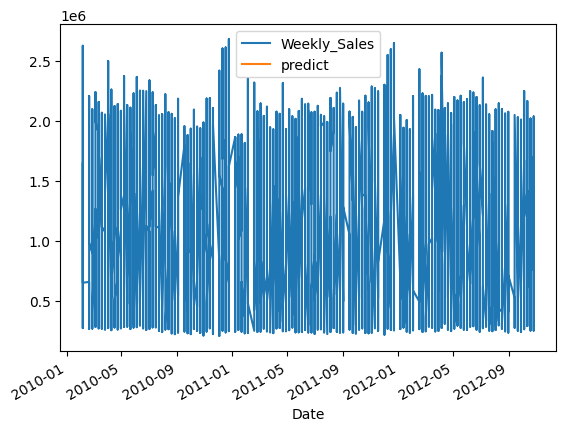

In [240]:
walmart['predict'] = model_fit.predict(start= len(train_data), 
                                    end=len(train_data)+len(test_data)- 1, 
                                    dynamic=True)
walmart[['Weekly_Sales','predict']].plot()

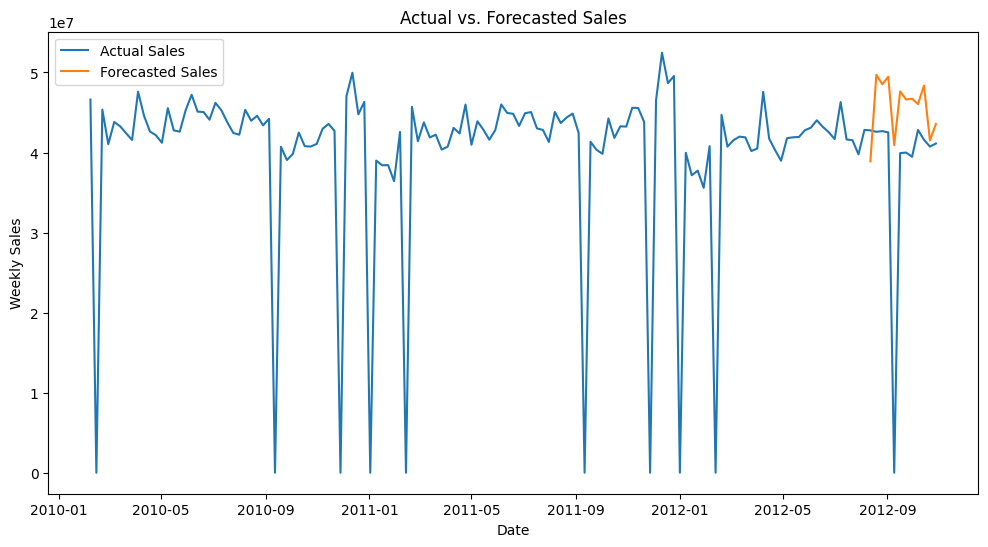

In [241]:
plt.figure(figsize=(12, 6))
plt.plot(walmart_weekly.index, walmart_weekly, label='Actual Sales')
plt.plot(test_data.index, forecasted_values, label='Forecasted Sales')
plt.xlabel('Date')
plt.ylabel('Weekly Sales')
plt.title('Actual vs. Forecasted Sales')
plt.legend()
plt.show()

# Preprocessing the Data:
1.Ensure that the 'Date' column is in datetime format.

2.Group the data by store and date to aggregate sales data for each store on a weekly basis.

In [243]:
# Group data by store and date to get weekly sales for each store
weekly_sales = walmart.groupby(['Store', pd.Grouper(key='Date', freq='W')])['Weekly_Sales'].sum().reset_index()
weekly_sales

,Store,Date,Weekly_Sales
0,1,2010-02-07,1643690.90
1,1,2010-02-21,1611968.17
2,1,2010-02-28,1409727.59
3,1,2010-03-07,1554806.68
4,1,2010-03-14,1439541.59
...,...,...,...
5502,45,2012-09-30,713173.95
5503,45,2012-10-07,733455.07
5504,45,2012-10-14,734464.36
5505,45,2012-10-21,718125.53


# Forecasting Weekly Sales for Each Store:
1.Iterate over each store and perform the forecast using SARIMAX or any other suitable time series forecasting model.

2.Generate forecasts for a specific number of future time steps.

In [244]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Iterate over each store and perform the forecast
forecasts = []
for store in weekly_sales['Store'].unique():
    store_data = weekly_sales[weekly_sales['Store'] == store]
    
    # Fit SARIMAX model
    model = SARIMAX(store_data['Weekly_Sales'], order=(1, 0, 2), seasonal_order=(1, 0, 2, 12), enforce_stationarity=False)
    model_fit = model.fit()
    
    # Forecast future values
    forecast = model_fit.forecast(steps=12)  # Change the number of steps as needed
    
    # Append the forecast to the list of forecasts
    forecasts.append(forecast)


# Visualizing the Forecasts:
Plot the forecasts for each store to visualize the predicted sales trends.

In [245]:
# Display the forecasts for the current store
print(f"Store {store} - Weekly Sales Forecasts:")
for j, forecast in enumerate(forecasts):
    print(f"Week {j+1}: {forecast}")
print()


Store 45 - Weekly Sales Forecasts:
Week 1: 133    1.563901e+06
134    1.594625e+06
135    1.594119e+06
136    1.599411e+06
137    1.598920e+06
138    1.599974e+06
139    1.598342e+06
140    1.601577e+06
141    1.600507e+06
142    1.598586e+06
143    1.600546e+06
144    1.600020e+06
Name: predicted_mean, dtype: float64
Week 2: 131    1.863910e+06
132    1.903271e+06
133    1.891540e+06
134    1.889745e+06
135    1.905068e+06
136    1.894063e+06
137    1.879786e+06
138    1.874133e+06
139    1.915408e+06
140    1.886759e+06
141    1.885727e+06
142    1.868492e+06
Name: predicted_mean, dtype: float64
Week 3: 133    409526.344968
134    416055.733380
135    415998.312647
136    415201.559785
137    415362.369286
138    415628.969200
139    416120.849189
140    416763.258890
141    415939.645275
142    417022.766003
143    416628.950600
144    418130.772115
Name: predicted_mean, dtype: float64
Week 4: 113    2.196198e+06
114    2.212363e+06
115    2.206377e+06
116    2.232298e+06
117    2.2

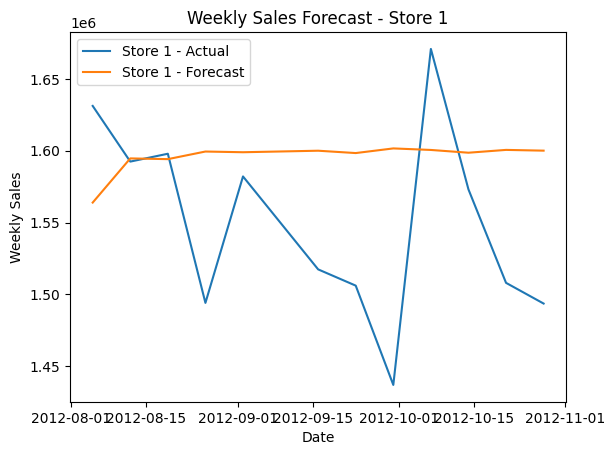

Store 1 - Weekly Sales Forecasts:
Week 1: 1563901.0648893488
Week 2: 1594624.75210834
Week 3: 1594118.880548441
Week 4: 1599410.8449382714
Week 5: 1598920.0976549583
Week 6: 1599974.3675041734
Week 7: 1598342.3471438668
Week 8: 1601576.515656321
Week 9: 1600507.0727422985
Week 10: 1598586.4792666838
Week 11: 1600545.6504066363
Week 12: 1600020.2057701908



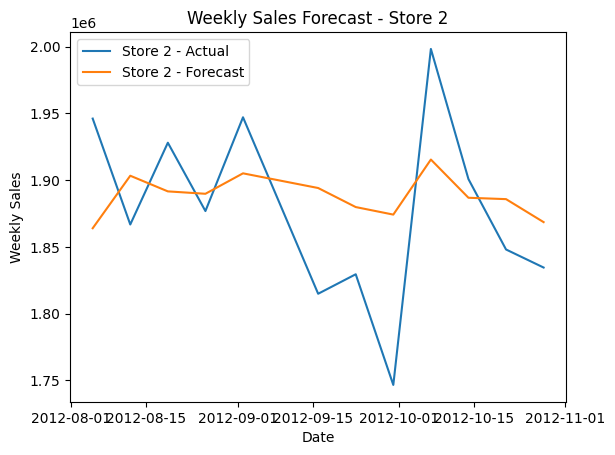

Store 2 - Weekly Sales Forecasts:
Week 1: 1863909.7409463068
Week 2: 1903270.9937987453
Week 3: 1891539.7597550054
Week 4: 1889745.427940109
Week 5: 1905068.1724944205
Week 6: 1894062.5298630628
Week 7: 1879786.2153896408
Week 8: 1874133.2490238878
Week 9: 1915408.1049295072
Week 10: 1886759.1461011379
Week 11: 1885727.4363075155
Week 12: 1868492.1580120572



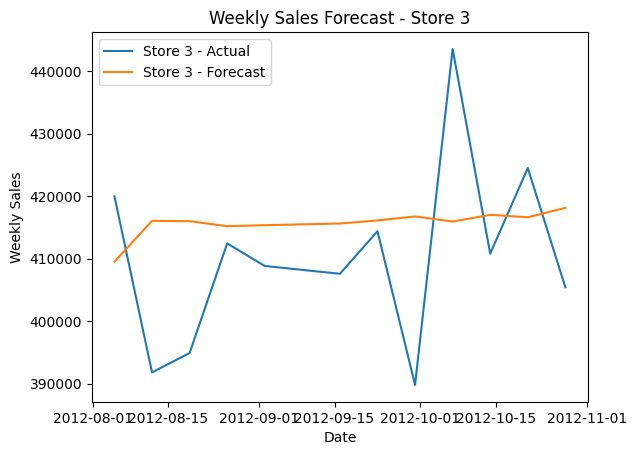

Store 3 - Weekly Sales Forecasts:
Week 1: 409526.34496846155
Week 2: 416055.73338020506
Week 3: 415998.3126470113
Week 4: 415201.55978546175
Week 5: 415362.36928627896
Week 6: 415628.96919977886
Week 7: 416120.8491887999
Week 8: 416763.2588901141
Week 9: 415939.64527451823
Week 10: 417022.7660029163
Week 11: 416628.9506004765
Week 12: 418130.7721154475



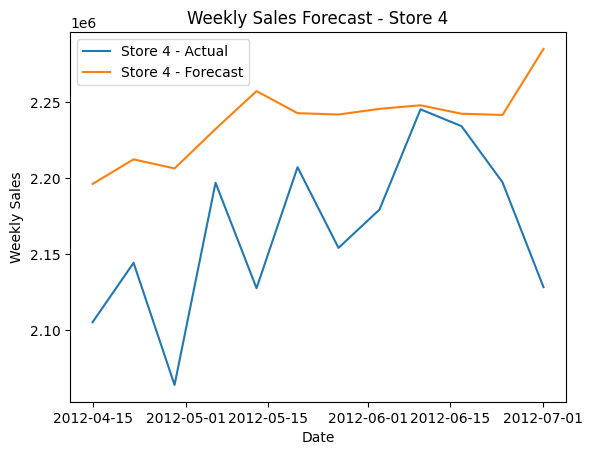

Store 4 - Weekly Sales Forecasts:
Week 1: 2196197.6205859915
Week 2: 2212363.1772104483
Week 3: 2206376.883574165
Week 4: 2232298.0897539714
Week 5: 2257223.477476558
Week 6: 2242727.3144325297
Week 7: 2241843.2216184624
Week 8: 2245549.3053073185
Week 9: 2247910.595652982
Week 10: 2242355.3556689154
Week 11: 2241554.9529653518
Week 12: 2284966.0358001883



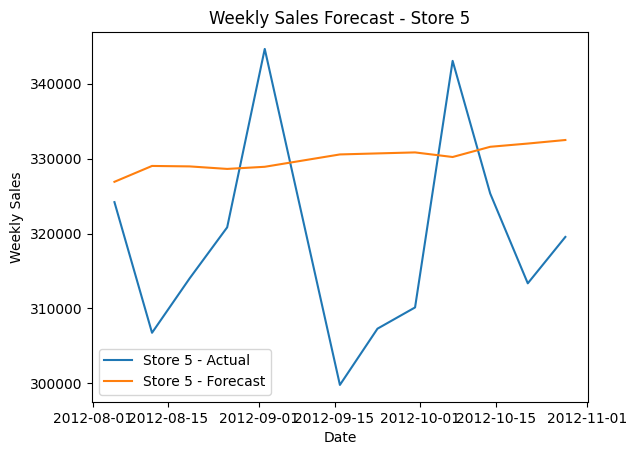

Store 5 - Weekly Sales Forecasts:
Week 1: 326908.1189438271
Week 2: 329024.157515062
Week 3: 328963.90303029044
Week 4: 328627.60265889403
Week 5: 328912.28443394037
Week 6: 330560.3893491598
Week 7: 330697.7876425522
Week 8: 330830.57784433896
Week 9: 330217.116126522
Week 10: 331580.8848643018
Week 11: 332012.70875103254
Week 12: 332486.3849084896



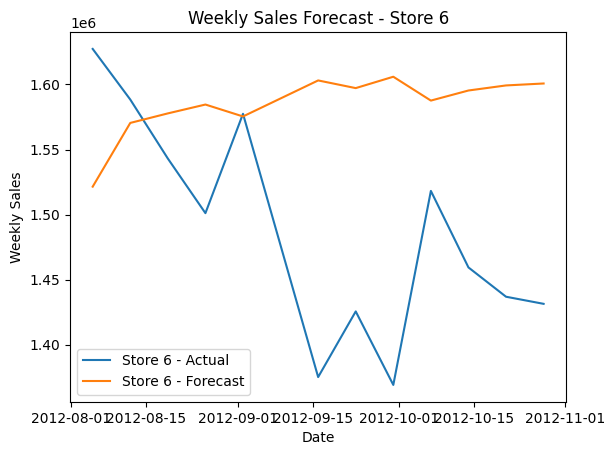

Store 6 - Weekly Sales Forecasts:
Week 1: 1521458.1229285235
Week 2: 1570417.6507222233
Week 3: 1577742.9245004118
Week 4: 1584543.5427247242
Week 5: 1575394.550932599
Week 6: 1603062.8808179086
Week 7: 1597168.82254956
Week 8: 1605906.1188051493
Week 9: 1587583.0398298355
Week 10: 1595330.9976965229
Week 11: 1599224.0561283003
Week 12: 1600714.64866082



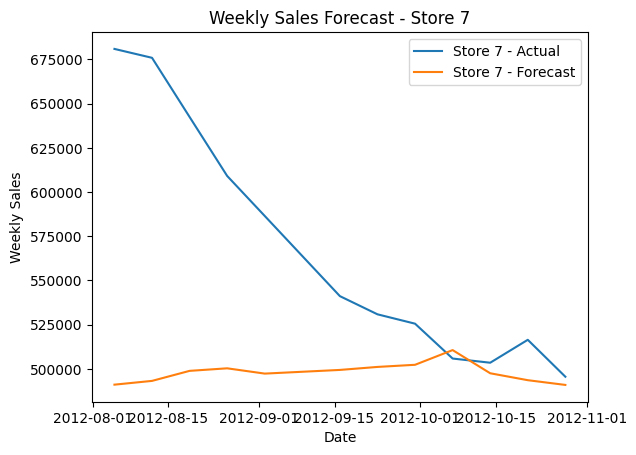

Store 7 - Weekly Sales Forecasts:
Week 1: 491056.5744474643
Week 2: 493186.38897022424
Week 3: 498858.57825494447
Week 4: 500298.352176551
Week 5: 497310.778915249
Week 6: 499388.5540947497
Week 7: 501085.24780224136
Week 8: 502292.1315447501
Week 9: 510610.7948543815
Week 10: 497499.08854295715
Week 11: 493583.8589209248
Week 12: 490906.60290918814



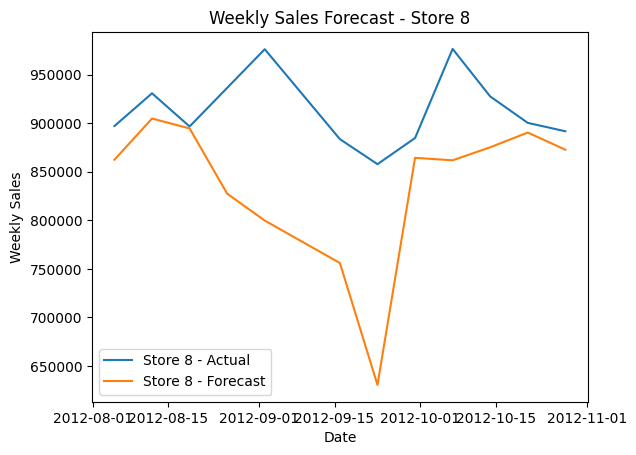

Store 8 - Weekly Sales Forecasts:
Week 1: 862383.2994834159
Week 2: 904776.5712252331
Week 3: 894582.1516418139
Week 4: 827439.3605122828
Week 5: 799773.4672484308
Week 6: 756052.4533343858
Week 7: 630589.0596458735
Week 8: 864334.0982529173
Week 9: 861794.4810707711
Week 10: 875180.25600469
Week 11: 890367.0396462872
Week 12: 872702.433929002



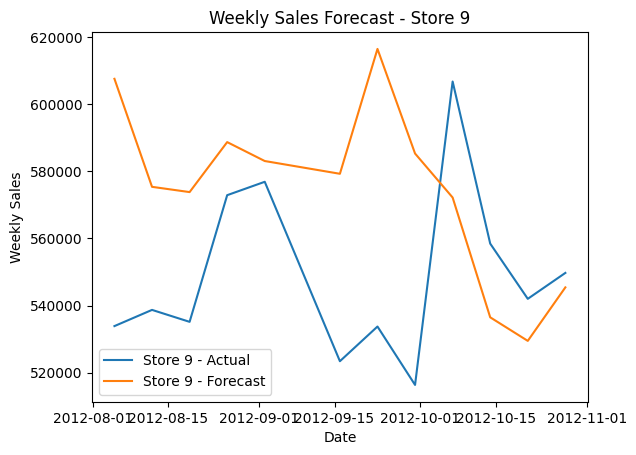

Store 9 - Weekly Sales Forecasts:
Week 1: 607556.0139614164
Week 2: 575376.936299075
Week 3: 573809.4932753451
Week 4: 588700.3192412568
Week 5: 583065.393248687
Week 6: 579263.5860533266
Week 7: 616462.675650728
Week 8: 585299.9077214134
Week 9: 572189.5989176244
Week 10: 536500.9832858879
Week 11: 529481.1893737352
Week 12: 545421.243028361



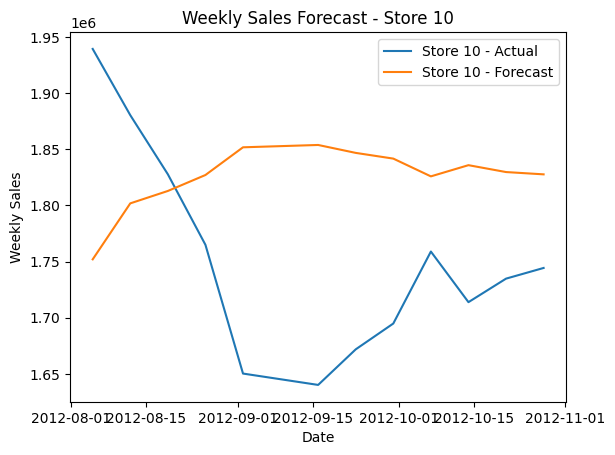

Store 10 - Weekly Sales Forecasts:
Week 1: 1752022.6439824163
Week 2: 1801877.1277045887
Week 3: 1812925.67676469
Week 4: 1827131.6963448462
Week 5: 1851811.8771743851
Week 6: 1853889.49719714
Week 7: 1846836.3594212444
Week 8: 1841745.0828660044
Week 9: 1825924.166476832
Week 10: 1835897.4623596836
Week 11: 1829767.404067923
Week 12: 1827721.3427356498



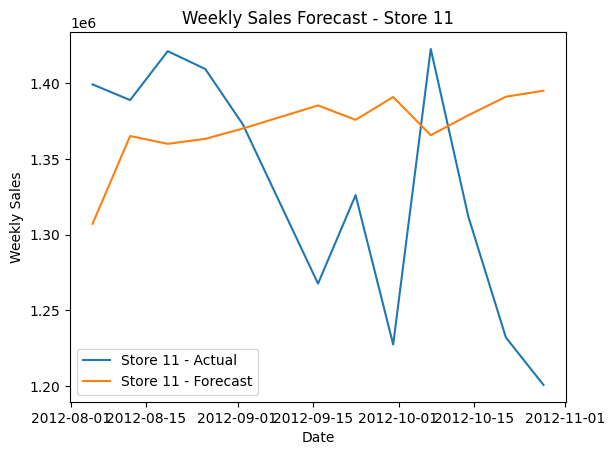

Store 11 - Weekly Sales Forecasts:
Week 1: 1307230.5992675214
Week 2: 1365241.5216373703
Week 3: 1360061.0545189134
Week 4: 1363373.2734475087
Week 5: 1370195.3441700402
Week 6: 1385445.4144610995
Week 7: 1375924.1754640143
Week 8: 1391007.3793009762
Week 9: 1365765.9410616832
Week 10: 1378962.6166152575
Week 11: 1391232.6364322484
Week 12: 1395182.520032626



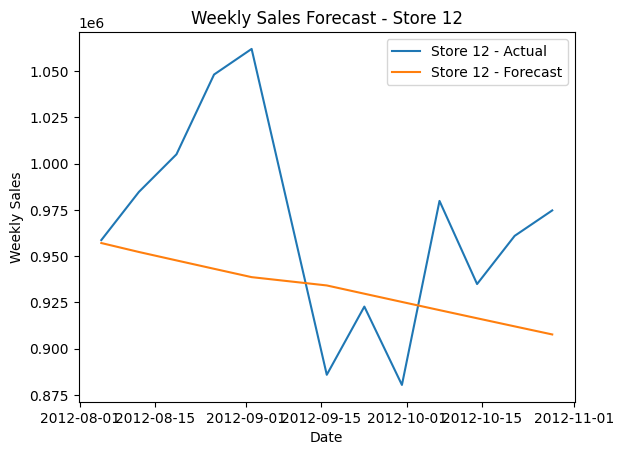

Store 12 - Weekly Sales Forecasts:
Week 1: 957069.1996980363
Week 2: 952235.6715666308
Week 3: 947683.767350226
Week 4: 943153.6222766613
Week 5: 938645.1323322597
Week 6: 934158.1940005525
Week 7: 929692.704259904
Week 8: 925248.5605811451
Week 9: 920825.6609252198
Week 10: 916423.9037408418
Week 11: 912043.1879621636
Week 12: 907683.4130064552



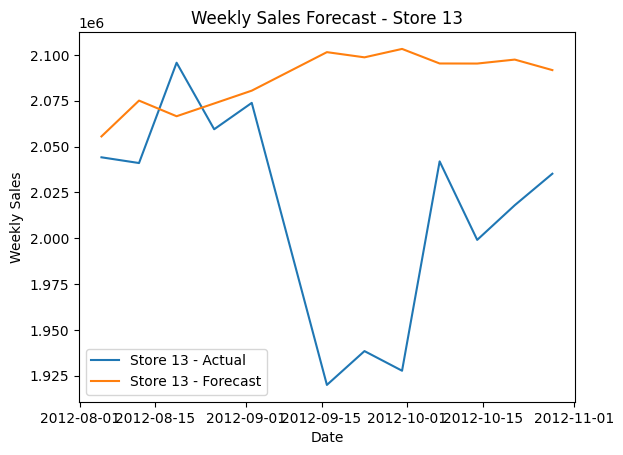

Store 13 - Weekly Sales Forecasts:
Week 1: 2055540.6056016127
Week 2: 2075100.0089899427
Week 3: 2066561.0909740059
Week 4: 2073532.1366250354
Week 5: 2080526.930183844
Week 6: 2101542.547468959
Week 7: 2098709.815345874
Week 8: 2103303.3557050666
Week 9: 2095357.3349303317
Week 10: 2095317.9789163608
Week 11: 2097483.8963330532
Week 12: 2091744.5686988337



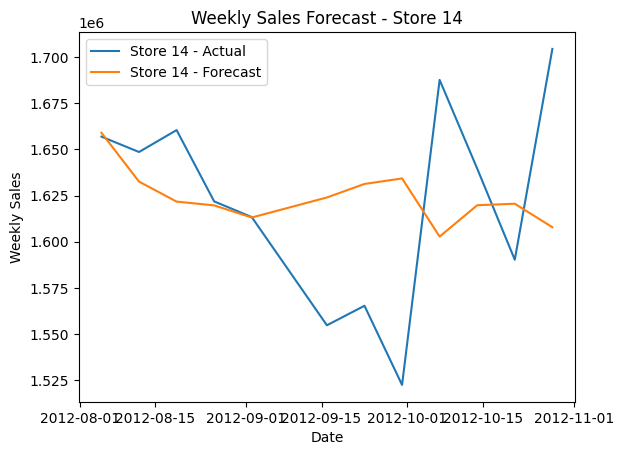

Store 14 - Weekly Sales Forecasts:
Week 1: 1658961.4101876859
Week 2: 1632547.1851042167
Week 3: 1621723.7299679562
Week 4: 1619676.607235943
Week 5: 1613117.4841343153
Week 6: 1623957.8744812477
Week 7: 1631281.6711425206
Week 8: 1634253.2286491967
Week 9: 1602795.243240802
Week 10: 1619765.095900116
Week 11: 1620566.6237559405
Week 12: 1607867.7580360477



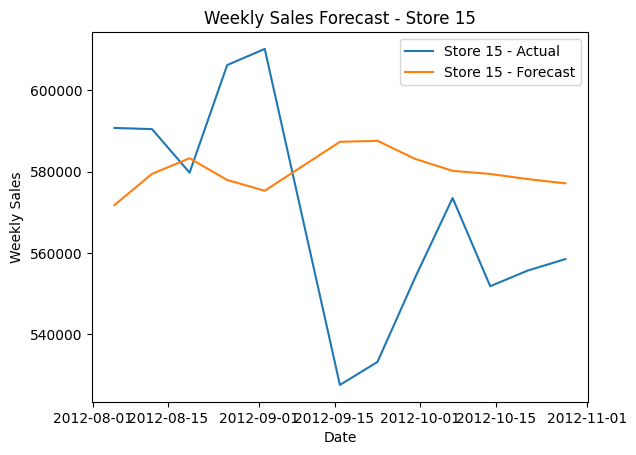

Store 15 - Weekly Sales Forecasts:
Week 1: 571762.6671015536
Week 2: 579447.1491688936
Week 3: 583282.137234786
Week 4: 577939.6473075426
Week 5: 575289.72091785
Week 6: 587327.8469408576
Week 7: 587573.8705542816
Week 8: 583135.378980319
Week 9: 580185.6807978036
Week 10: 579422.4740652432
Week 11: 578150.7290784037
Week 12: 577112.9151974771



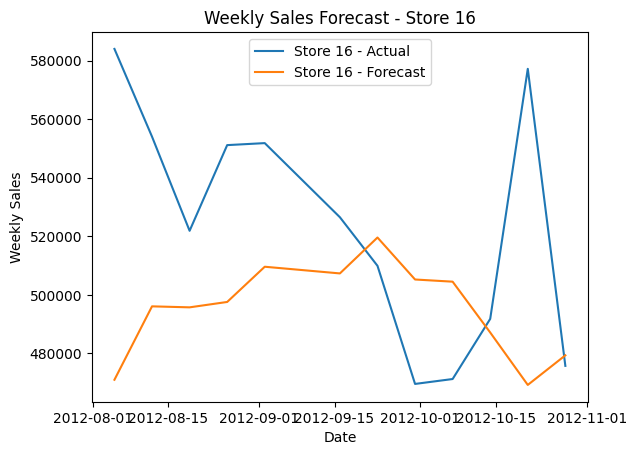

Store 16 - Weekly Sales Forecasts:
Week 1: 471031.7141792521
Week 2: 496097.463305997
Week 3: 495758.7566998535
Week 4: 497596.5910681927
Week 5: 509623.65634769725
Week 6: 507341.7902491649
Week 7: 519600.85076118266
Week 8: 505266.306082699
Week 9: 504523.41359309846
Week 10: 487171.11322609836
Week 11: 469268.04667446425
Week 12: 479373.2608257261



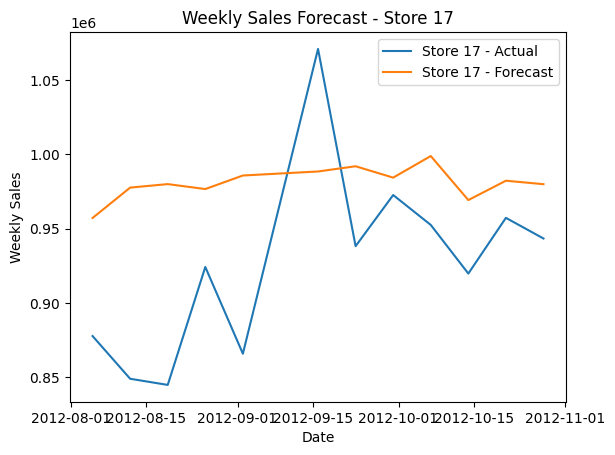

Store 17 - Weekly Sales Forecasts:
Week 1: 957279.8497654011
Week 2: 977719.6415649009
Week 3: 980067.3837116628
Week 4: 976734.3590718206
Week 5: 985852.557283573
Week 6: 988563.4877178984
Week 7: 992085.9937481816
Week 8: 984427.9224084712
Week 9: 998958.7495781367
Week 10: 969320.6438551949
Week 11: 982346.1770515873
Week 12: 980012.666096205



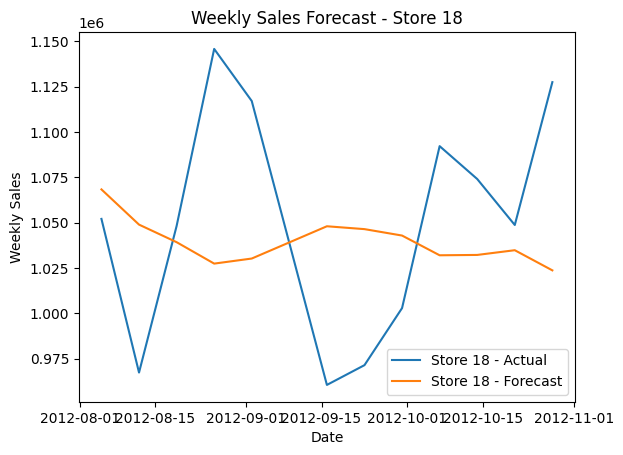

Store 18 - Weekly Sales Forecasts:
Week 1: 1068333.8493227838
Week 2: 1048915.0724893876
Week 3: 1039229.3662190362
Week 4: 1027403.6624236674
Week 5: 1030201.5055309747
Week 6: 1048004.0867423262
Week 7: 1046424.1800913693
Week 8: 1042881.3206870945
Week 9: 1031995.0237930176
Week 10: 1032187.6978259648
Week 11: 1034792.1205836843
Week 12: 1023677.5621921789



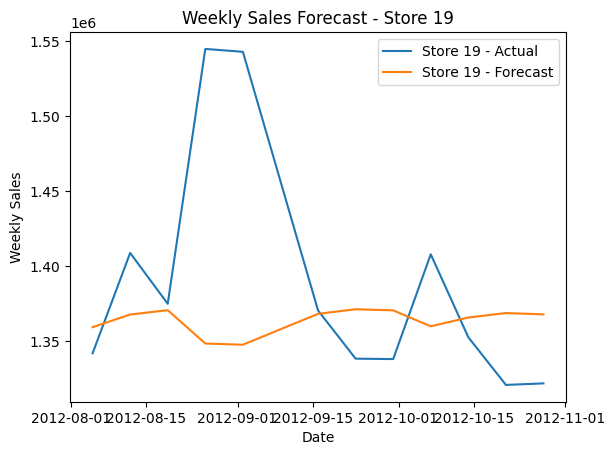

Store 19 - Weekly Sales Forecasts:
Week 1: 1359529.423451607
Week 2: 1367945.4882333702
Week 3: 1370834.2856652844
Week 4: 1348650.934467369
Week 5: 1347843.1480799785
Week 6: 1368374.9280158642
Week 7: 1371460.8543763643
Week 8: 1370718.7767861355
Week 9: 1360094.4160356172
Week 10: 1365950.9711952668
Week 11: 1368920.2721467887
Week 12: 1368053.8264510413



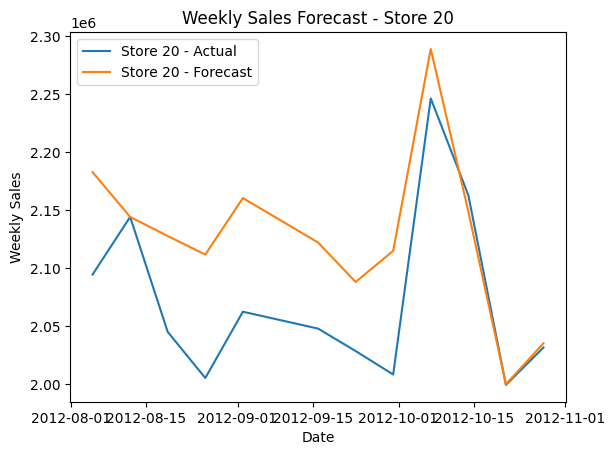

Store 20 - Weekly Sales Forecasts:
Week 1: 2182878.202497519
Week 2: 2144242.7539939214
Week 3: 2127749.0276048263
Week 4: 2111783.2093325416
Week 5: 2160478.9955102853
Week 6: 2122191.9000025885
Week 7: 2088136.3785016977
Week 8: 2114947.4336763993
Week 9: 2289088.072944775
Week 10: 2148898.5276940903
Week 11: 1999987.149072536
Week 12: 2035230.6857514202



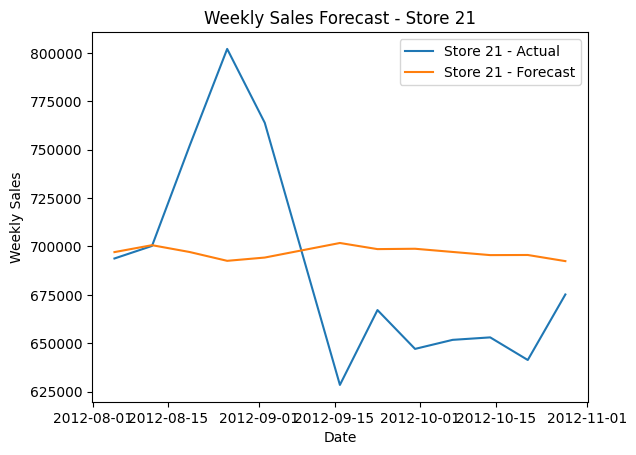

Store 21 - Weekly Sales Forecasts:
Week 1: 697080.700523065
Week 2: 700656.4290284058
Week 3: 697133.1394439678
Week 4: 692576.260100798
Week 5: 694266.0545988043
Week 6: 701788.2229725465
Week 7: 698626.5875797326
Week 8: 698811.6476471113
Week 9: 697161.4090667656
Week 10: 695527.9394938586
Week 11: 695589.621289346
Week 12: 692423.9756855626



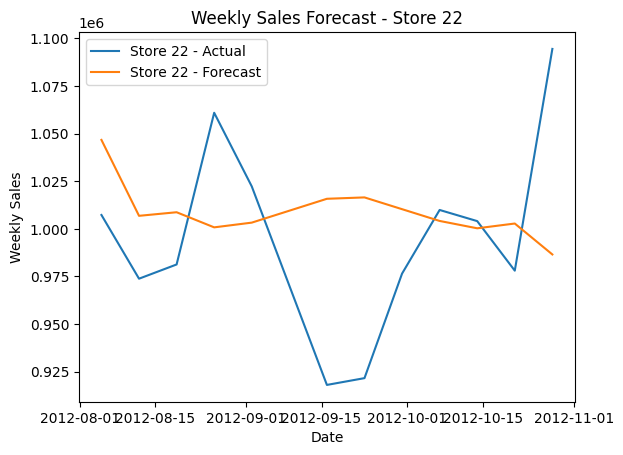

Store 22 - Weekly Sales Forecasts:
Week 1: 1046667.5437653942
Week 2: 1006815.6888176949
Week 3: 1008693.4524202034
Week 4: 1000758.3370100247
Week 5: 1003240.3246101909
Week 6: 1015757.3349317702
Week 7: 1016479.3441402835
Week 8: 1010302.2565226045
Week 9: 1004124.6343697392
Week 10: 1000266.6078465036
Week 11: 1002769.9677862246
Week 12: 986534.6423129849



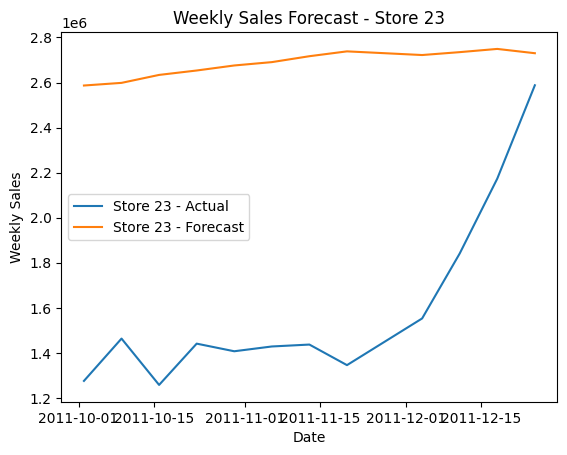

Store 23 - Weekly Sales Forecasts:
Week 1: 2586850.69307762
Week 2: 2598584.3593838844
Week 3: 2633905.3740747077
Week 4: 2653493.6260576546
Week 5: 2675821.8478550296
Week 6: 2690683.854223059
Week 7: 2716936.69228372
Week 8: 2738447.4333793954
Week 9: 2722162.299359206
Week 10: 2735000.6420581364
Week 11: 2749286.4330027876
Week 12: 2730210.5472419653



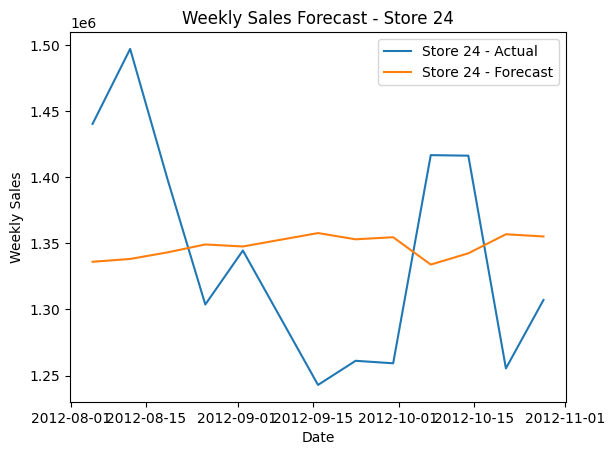

Store 24 - Weekly Sales Forecasts:
Week 1: 1336057.6173406697
Week 2: 1338185.0870176952
Week 3: 1343196.9725171786
Week 4: 1349151.1083451686
Week 5: 1347623.9665600476
Week 6: 1357764.7730684315
Week 7: 1353052.4110905952
Week 8: 1354624.3632285164
Week 9: 1333945.7545154698
Week 10: 1342453.6706479536
Week 11: 1356867.0283402428
Week 12: 1355193.681641281



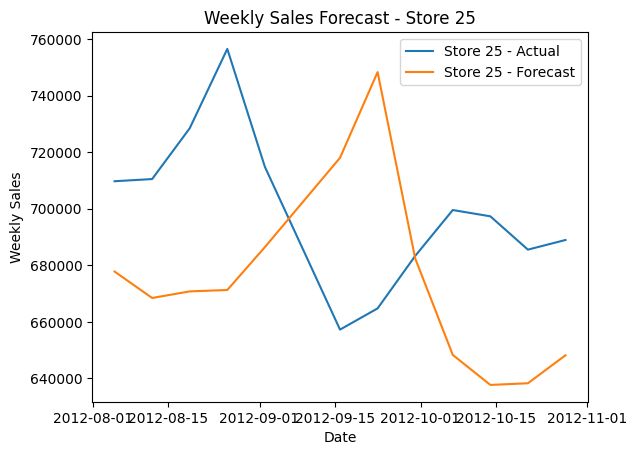

Store 25 - Weekly Sales Forecasts:
Week 1: 677774.9371723395
Week 2: 668428.7360606352
Week 3: 670762.2229404761
Week 4: 671251.5606170206
Week 5: 686419.732003708
Week 6: 718022.9967631774
Week 7: 748334.2834917912
Week 8: 682437.627495426
Week 9: 648305.7685093763
Week 10: 637674.8947674844
Week 11: 638260.690949353
Week 12: 648167.4862618974



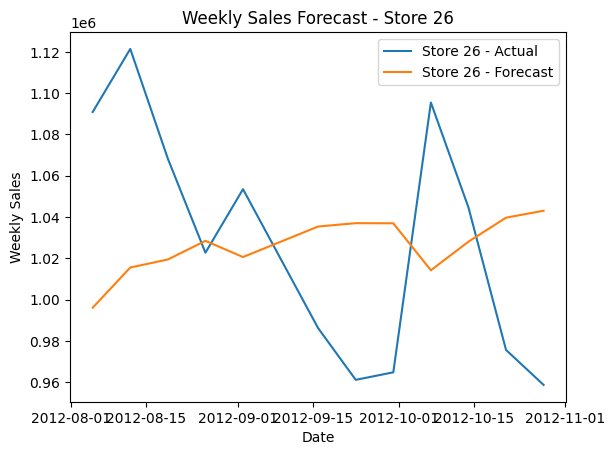

Store 26 - Weekly Sales Forecasts:
Week 1: 996052.2494190368
Week 2: 1015516.1075003574
Week 3: 1019422.2581099878
Week 4: 1028448.3375592143
Week 5: 1020608.7320191804
Week 6: 1035400.3948001687
Week 7: 1037022.3172736727
Week 8: 1036949.4101034581
Week 9: 1014200.5598943864
Week 10: 1028052.1293101038
Week 11: 1039686.0076035955
Week 12: 1043045.9085219171



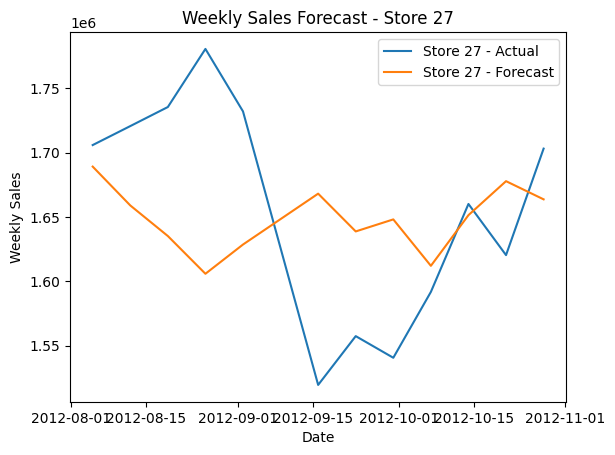

Store 27 - Weekly Sales Forecasts:
Week 1: 1689083.3195788562
Week 2: 1658941.153234114
Week 3: 1635187.7283212426
Week 4: 1605892.3008563991
Week 5: 1628595.1511151528
Week 6: 1668088.2252064508
Week 7: 1638761.162178003
Week 8: 1648094.6576935498
Week 9: 1612052.820427841
Week 10: 1651402.8590071823
Week 11: 1677779.36247282
Week 12: 1663668.8318567662



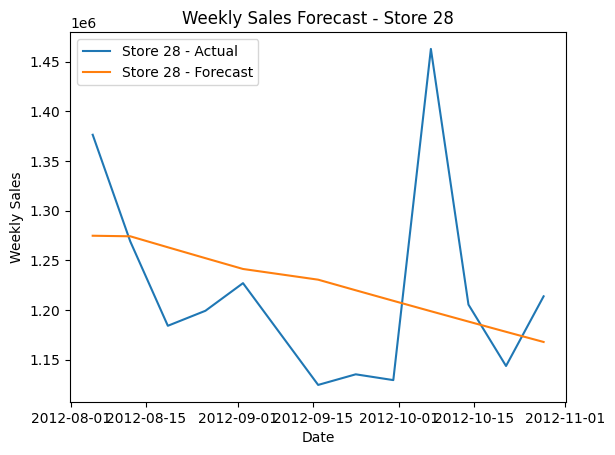

Store 28 - Weekly Sales Forecasts:
Week 1: 1274858.933838463
Week 2: 1274292.6206271187
Week 3: 1263231.5715495124
Week 4: 1252266.534019581
Week 5: 1241396.6746428409
Week 6: 1230621.1672587958
Week 7: 1219939.1928781455
Week 8: 1209349.9396205381
Week 9: 1198852.6026528643
Week 10: 1188446.384128085
Week 11: 1178130.4931245924
Week 12: 1167904.1455860948



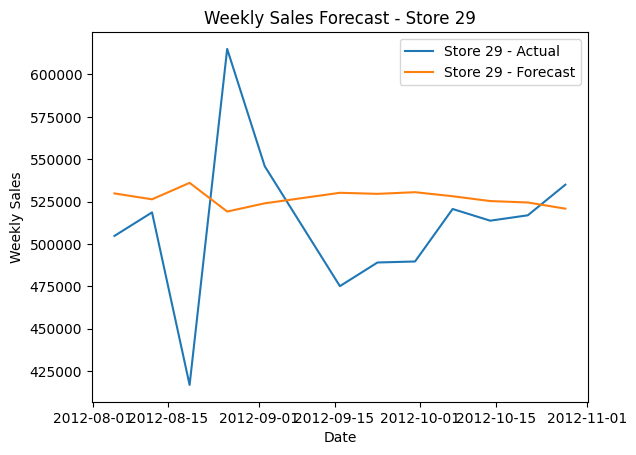

Store 29 - Weekly Sales Forecasts:
Week 1: 529808.7980429396
Week 2: 526340.0229030619
Week 3: 536050.7688785772
Week 4: 519127.3736745229
Week 5: 523974.48361103836
Week 6: 530180.037665461
Week 7: 529560.7155804422
Week 8: 530531.1672028668
Week 9: 528158.6469033726
Week 10: 525304.557120152
Week 11: 524469.9076139904
Week 12: 520826.9321358768



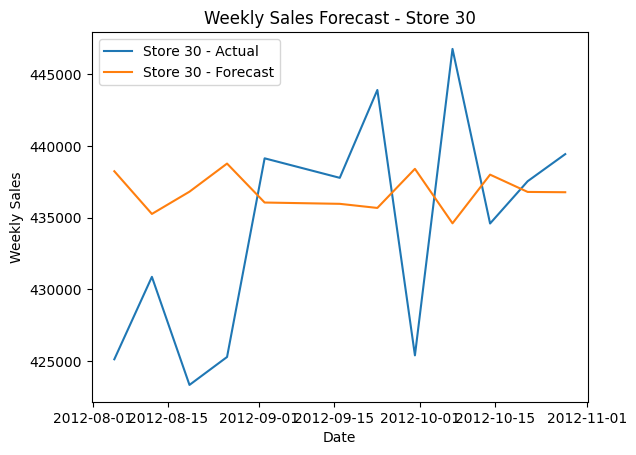

Store 30 - Weekly Sales Forecasts:
Week 1: 438232.4940812451
Week 2: 435259.61249078624
Week 3: 436808.9898370947
Week 4: 438766.71990912437
Week 5: 436053.99587025784
Week 6: 435962.878937749
Week 7: 435676.6537045856
Week 8: 438399.853183222
Week 9: 434607.07048873877
Week 10: 437996.2594810207
Week 11: 436791.9321569278
Week 12: 436770.74408818956



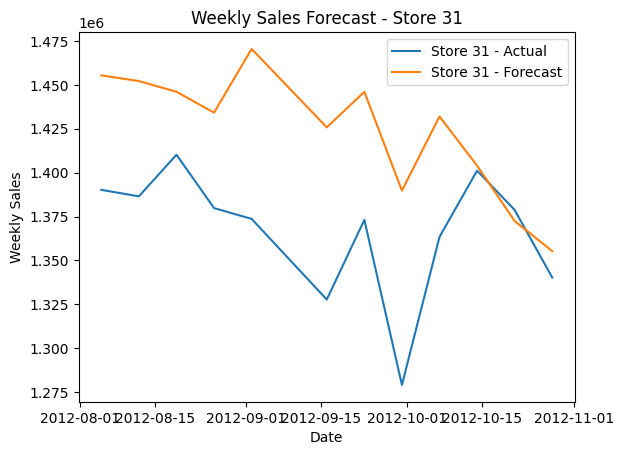

Store 31 - Weekly Sales Forecasts:
Week 1: 1455348.5809972752
Week 2: 1452134.5922294015
Week 3: 1446043.3354578593
Week 4: 1434156.5185448574
Week 5: 1470439.1906611612
Week 6: 1425773.033823774
Week 7: 1445999.661042187
Week 8: 1389739.9705139955
Week 9: 1431971.3799570533
Week 10: 1403938.1435917832
Week 11: 1372437.058155605
Week 12: 1355251.0945123602



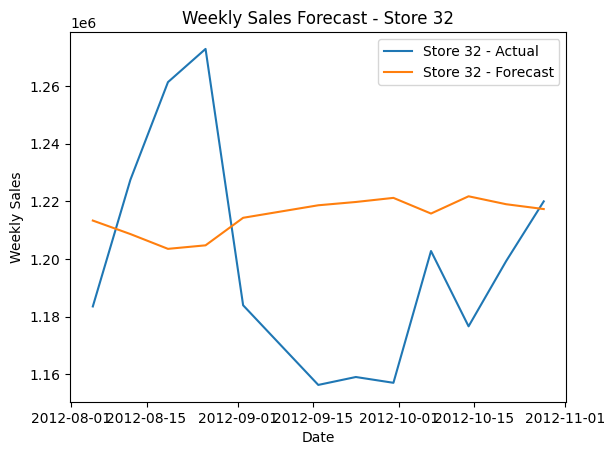

Store 32 - Weekly Sales Forecasts:
Week 1: 1213331.0521794723
Week 2: 1208652.60579196
Week 3: 1203527.9010422414
Week 4: 1204749.5342426593
Week 5: 1214290.5732938417
Week 6: 1218628.6963564705
Week 7: 1219772.0482186556
Week 8: 1221191.0444530454
Week 9: 1215762.2761506843
Week 10: 1221741.633677112
Week 11: 1218992.2903189396
Week 12: 1217319.1982980298



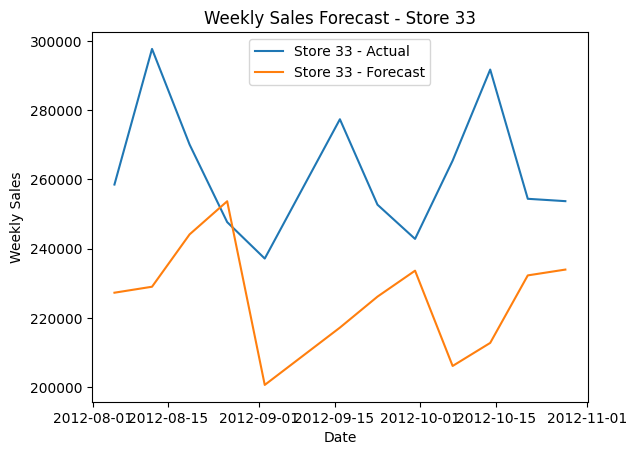

Store 33 - Weekly Sales Forecasts:
Week 1: 227256.67576741267
Week 2: 228984.56032629107
Week 3: 244122.87815550138
Week 4: 253704.28757771655
Week 5: 200590.10342414002
Week 6: 217162.5513122704
Week 7: 226120.29789884965
Week 8: 233628.3346674059
Week 9: 206072.39326490826
Week 10: 212740.52030763612
Week 11: 232264.18318395197
Week 12: 233945.21116324808



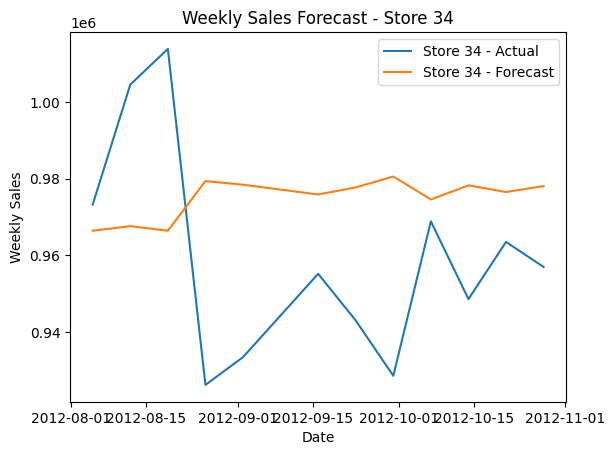

Store 34 - Weekly Sales Forecasts:
Week 1: 966442.2200635881
Week 2: 967629.8365401997
Week 3: 966441.2586386449
Week 4: 979374.0766816525
Week 5: 978429.617470309
Week 6: 975886.3723428878
Week 7: 977722.8960060731
Week 8: 980556.9560453899
Week 9: 974583.5845981741
Week 10: 978265.3953221149
Week 11: 976527.7233792326
Week 12: 978070.7693624939



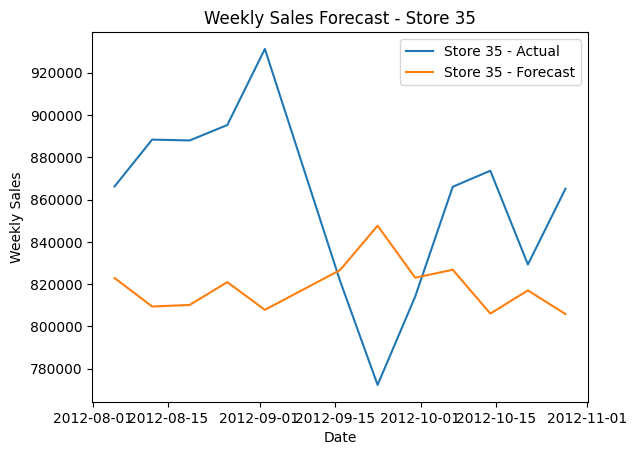

Store 35 - Weekly Sales Forecasts:
Week 1: 822871.7636186819
Week 2: 809397.8108262796
Week 3: 810145.9668505375
Week 4: 820950.2149559769
Week 5: 807826.4529217477
Week 6: 826621.8384038819
Week 7: 847642.4844312392
Week 8: 823041.6545601514
Week 9: 826791.0634312611
Week 10: 806054.3321384386
Week 11: 817017.6478203414
Week 12: 805828.4868571252



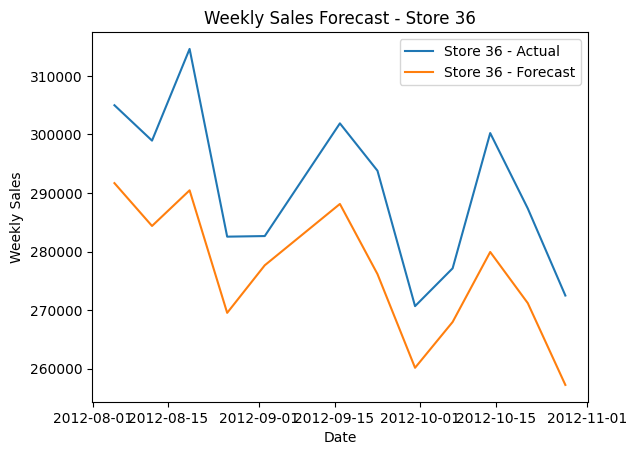

Store 36 - Weekly Sales Forecasts:
Week 1: 291687.2590248473
Week 2: 284372.5540839957
Week 3: 290459.0015653661
Week 4: 269531.9563302524
Week 5: 277654.12811676186
Week 6: 288130.3046007291
Week 7: 276152.6278897098
Week 8: 260151.1254378824
Week 9: 267975.1388047109
Week 10: 279929.05590775126
Week 11: 271194.12561745715
Week 12: 257224.4518860539



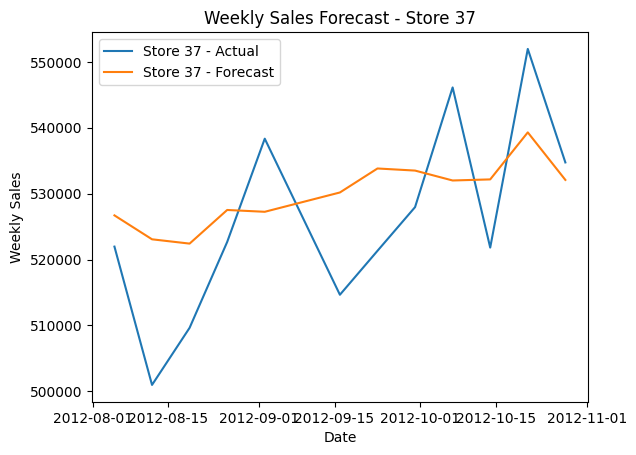

Store 37 - Weekly Sales Forecasts:
Week 1: 526700.5090250259
Week 2: 523069.12425182003
Week 3: 522415.93966878677
Week 4: 527521.43794506
Week 5: 527245.5400886945
Week 6: 530177.1734423912
Week 7: 533820.029820036
Week 8: 533501.9620815277
Week 9: 531997.4799289099
Week 10: 532162.2370486138
Week 11: 539300.4886521063
Week 12: 532085.7350416483



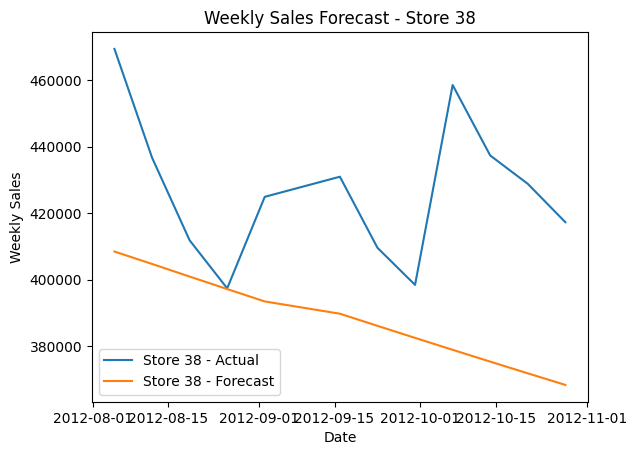

Store 38 - Weekly Sales Forecasts:
Week 1: 408485.1410866279
Week 2: 404753.57032031706
Week 3: 400966.0736786177
Week 4: 397214.0186781114
Week 5: 393497.0736723177
Week 6: 389814.91011815076
Week 7: 386167.20254687866
Week 8: 382553.62853535544
Week 9: 378973.8686775217
Week 10: 375427.6065561722
Week 11: 371914.52871498745
Week 12: 368434.32463082724



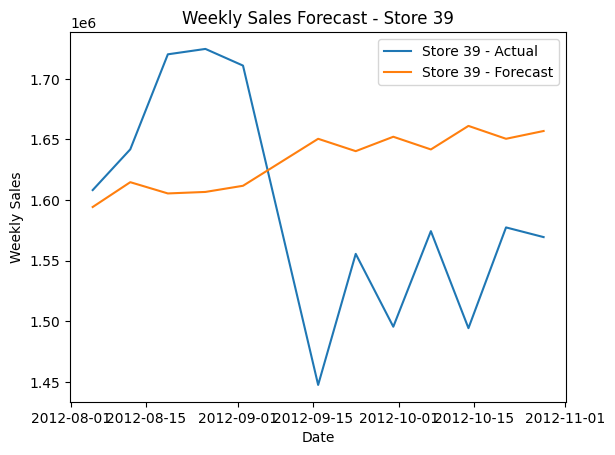

Store 39 - Weekly Sales Forecasts:
Week 1: 1594321.5578980972
Week 2: 1614784.4629024342
Week 3: 1605504.7972022835
Week 4: 1606748.8066324068
Week 5: 1611820.9367761991
Week 6: 1650563.6330925361
Week 7: 1640374.2497332653
Week 8: 1652244.2754112703
Week 9: 1641782.3983760092
Week 10: 1661196.765865805
Week 11: 1650571.0836917607
Week 12: 1656993.4099140267



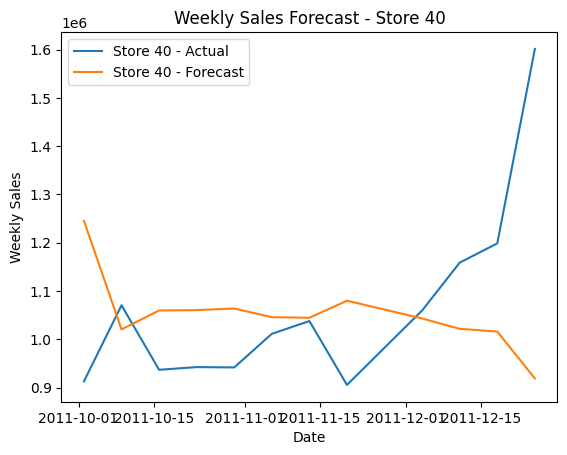

Store 40 - Weekly Sales Forecasts:
Week 1: 1245322.332680823
Week 2: 1020352.2534843868
Week 3: 1059696.3839397815
Week 4: 1060396.1334958521
Week 5: 1063783.6599821332
Week 6: 1045746.9677721882
Week 7: 1044521.8735613177
Week 8: 1079877.9521773122
Week 9: 1043105.5601670266
Week 10: 1021607.7747673114
Week 11: 1015966.4261887238
Week 12: 918851.2296980429



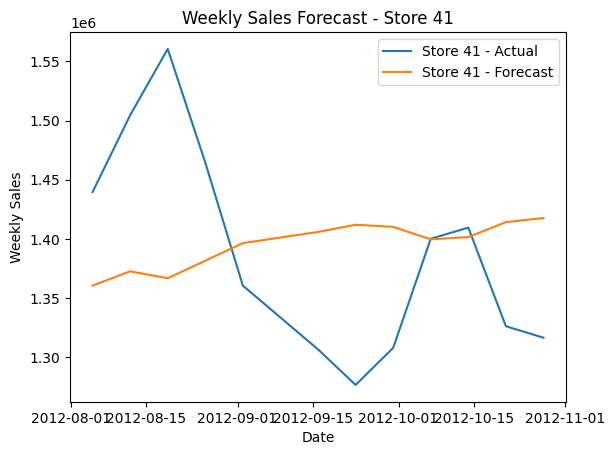

Store 41 - Weekly Sales Forecasts:
Week 1: 1360558.233431522
Week 2: 1372592.1670561323
Week 3: 1366764.042086731
Week 4: 1381557.9586556468
Week 5: 1396445.544033745
Week 6: 1405895.557199951
Week 7: 1411967.776902661
Week 8: 1410213.4433318796
Week 9: 1399654.4323097186
Week 10: 1401564.788900611
Week 11: 1414202.1612300505
Week 12: 1417666.2543897878



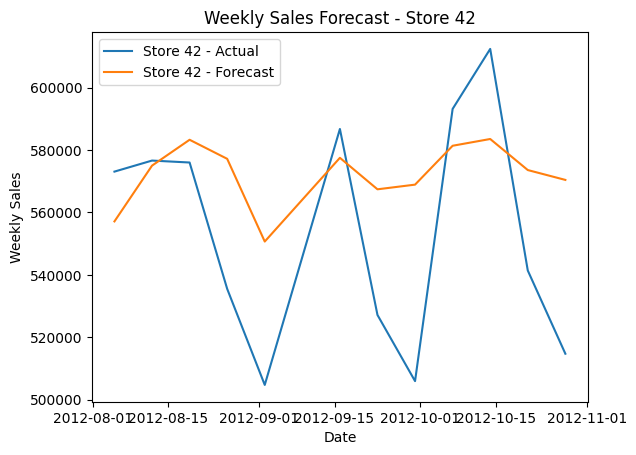

Store 42 - Weekly Sales Forecasts:
Week 1: 557132.915674019
Week 2: 574997.5314195507
Week 3: 583281.8772606102
Week 4: 577180.031794658
Week 5: 550685.9982716222
Week 6: 577501.1138108821
Week 7: 567416.2618859129
Week 8: 568911.6103590449
Week 9: 581364.8415609075
Week 10: 583529.0815549265
Week 11: 573581.9754977978
Week 12: 570424.922757274



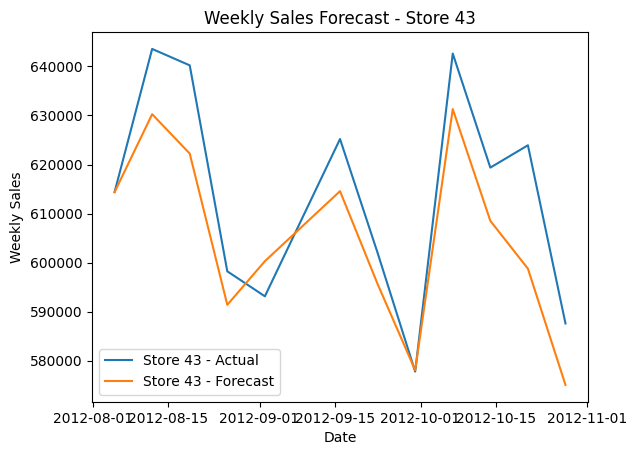

Store 43 - Weekly Sales Forecasts:
Week 1: 614372.9739036075
Week 2: 630250.9127922638
Week 3: 622234.1732370765
Week 4: 591402.9388065354
Week 5: 600293.0541528027
Week 6: 614570.7186371239
Week 7: 595640.2171517829
Week 8: 578080.5864211494
Week 9: 631293.8786745534
Week 10: 608522.0435595979
Week 11: 598772.6212619443
Week 12: 575078.1102275327



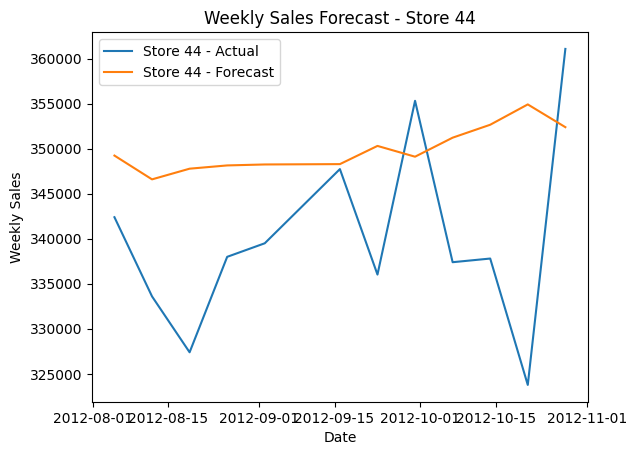

Store 44 - Weekly Sales Forecasts:
Week 1: 349226.3844220175
Week 2: 346586.3463835056
Week 3: 347771.8319418056
Week 4: 348133.47683955356
Week 5: 348240.083130143
Week 6: 348278.7035716319
Week 7: 350299.24464097107
Week 8: 349102.74023305817
Week 9: 351214.0895977581
Week 10: 352649.62472612516
Week 11: 354906.9232139636
Week 12: 352381.3597598877



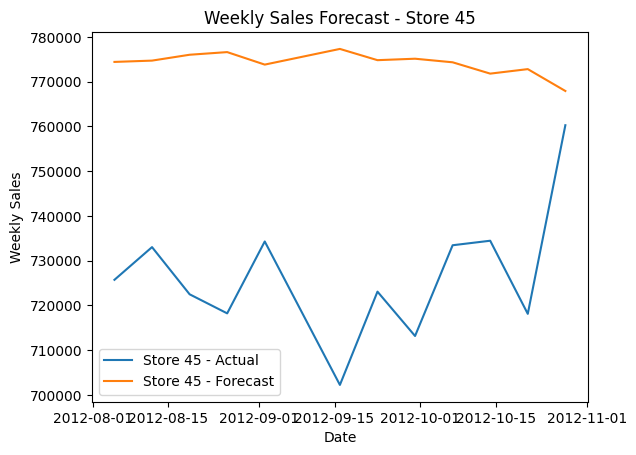

Store 45 - Weekly Sales Forecasts:
Week 1: 774428.8566175429
Week 2: 774720.4196510818
Week 3: 776031.0280831315
Week 4: 776622.2431130287
Week 5: 773827.9173479645
Week 6: 777333.098655338
Week 7: 774819.3534819068
Week 8: 775143.7846762371
Week 9: 774344.2550440973
Week 10: 771811.9108251375
Week 11: 772819.3245534945
Week 12: 767932.6289163444



In [246]:
# Loop through all stores
for i, store in enumerate(weekly_sales['Store'].unique()):
    store_data = weekly_sales[weekly_sales['Store'] == store]
    
    # Get the corresponding forecasts for the current store
    store_forecasts = forecasts[i]
    
    # Align the dimensions of the Date and forecasts arrays
    date_range = store_data['Date'].iloc[-len(store_forecasts):].reset_index(drop=True)  # Match the length of forecasts
    
    plt.plot(date_range, store_data['Weekly_Sales'].values[-len(store_forecasts):], label=f"Store {store} - Actual")
    plt.plot(date_range, store_forecasts, label=f"Store {store} - Forecast")
    plt.xlabel('Date', rotation=0)
    plt.ylabel('Weekly Sales')
    plt.title(f"Weekly Sales Forecast - Store {store}")
    plt.legend()
    
    plt.show()
    
    # Display the forecasts for the current store
    print(f"Store {store} - Weekly Sales Forecasts:")
    for j, forecast in enumerate(store_forecasts):
        print(f"Week {j+1}: {forecast}")
    print()


# Model Evaluation and Techniques:
    
    When we are evaluating a model for a Walmart project, there are several techniques and metrics that can be used to assess its performance and effectiveness. Here are some commonly used techniques and evaluation metrics:

- Evaluation Metrics:
 I have Choosen appropriate evaluation metrics based on the nature of the problem you are trying to solve. Some common metrics for model evaluation include: 
- Mean Absolute Error (MAE): 
     The average absolute difference between the predicted and actual values. Mean Squared Error (MSE): The average squared difference between the predicted and actual values. It emphasizes larger errors more than MAE. 
- Root Mean Squared Error (RMSE): 
    The square root of MSE. It is in the same unit as the target variable and is easier to interpret. Accuracy: The proportion of correctly classified instances.

# Inferences from the Same: From the Above Used tool and Techniques like preprocess the data, including cleaning, handling missing values, feature engineering, and any other necessary transformations.

the Weekly Sales Data is Continuous data nad it is Non Stationary data We can get an Inference from the Data set is :

Clearly, from the above graph, it is visible that the store which has maximum sales is store number 19 and 20 and the store which has minimum sales is the store number 33.

- The store number 37 store which has min coefficient of mean to standard deviation .
- The store number 35 store which has maximum coefficient of mean to standard deviation .
- Store Number 4 is having More Quaterly growth among the all then stores.
- Here, store-23 which has performed better in the 2nd quarter as compared to the 3rd and 4th quarter than all othe stores.
- From the above inference Quartile3 and Quartile2 Sales are having heigher rating in Sales.
- 4th month of the year has Max Sales and 1st month of the year is has min Sales.
- Monthly Higher Sales: In 2010 and in 2011 -- December month But in 2012 --- June month Here, overall monthly sales are higher in the month of December while the yearly sales in the year 2011 are the highest.
- Monthly Higher Orders: In 2010 --Aplril,July,October and December months in 2011 -- April,July,September and December months But in 2012 --- March, june and August months Monthly Lesser Orders: In 2010 --January,February,March,May,June,August,September and November months in 2011 -- February,March,May,June,August ,October and November months But in 2012 ---January,February,April, May.July,September and October months
- Continuous 4 days of the every week is having the Heigher sales in a month.
- From the results we observe that most orders are made in the UK and customers from UK spend the highest amount of money in their purchases.

     Summarize the key insights obtained from the predictive models and their implications for inventory management and sales forecasting. Discuss any patterns or trends discovered in the data that can aid decision-making.

# .Future Possibilities of the Project:
Based on the provided two datasets: 'Walmart.csv' and 'OnlineRetail.csv'. Let's explore some future possibilities for each dataset:

Walmart Dataset:

*. Forecasting Sales: You can use time series analysis techniques to predict future sales based on historical data. This can help identify trends, seasonality, and other factors that affect Walmart's sales. Models like ARIMA, SARIMA, or Prophet can be applied to generate sales forecasts.

*. Customer Segmentation: Analyzing customer behavior and segmenting them based on various factors such as demographics, purchase history, or shopping patterns can provide insights for targeted marketing strategies and personalized recommendations.

*. Inventory Optimization: Utilize data to optimize inventory management by predicting demand for different products, identifying stockouts, and optimizing replenishment strategies.

*. Pricing Optimization: Analyze pricing data and historical sales to optimize pricing strategies, such as dynamic pricing or pricing elasticity models, to maximize revenue and profitability.

Online Retail Dataset:

*.Customer Lifetime Value (CLV) Prediction: Analyze customer behavior, purchase history, and demographic data to estimate the CLV for each customer. This information can help in customer segmentation, personalized marketing campaigns, and customer retention strategies.

*.Market Basket Analysis: Identify frequently co-occurring items in customers' shopping baskets to understand buying patterns and optimize product recommendations or cross-selling strategies.

*.Churn Prediction: Utilize historical data to predict customer churn, i.e., identify customers who are likely to stop using the online retail platform. This information can guide targeted retention efforts and proactive customer engagement.

*.Fraud Detection: Apply anomaly detection or classification techniques to identify fraudulent transactions or suspicious activities, helping to protect the business and enhance security measures.

These are just a few examples of the future possibilities for each dataset. The actual opportunities and insights depend on the specific characteristics of the data, business goals Highlight potential areas for further improvement or expansion of the project. Discuss possible enhancements to the predictive models, additional data sources, or advanced techniques that could be applied to enhance inventory management and sales forecasting in the future.

Based on relevant tables, charts, and visualizations throughout the report to support your findings.

# FUTURE ENHANCEMENT
        For future enhancements in the project using the Walmart dataset and the Online Retail dataset, here are some potential areas to consider:

    1.Advanced Predictive Modeling:
- Explore more advanced predictive modeling techniques, such as deep learning models (e.g., neural networks) or ensemble methods, to improve the accuracy and robustness of your predictions. These models can capture complex relationships and patterns in the data, potentially leading to better forecasting or classification results.

    2.Incorporate External Data:
- Augment the existing datasets with relevant external data sources. For example, you could include economic indicators, weather data, or demographic information that may impact sales or customer behavior. By incorporating such data, you can potentially improve the accuracy of predictions and gain additional insights.

    3.Real-Time Analytics: 
- Develop real-time analytics capabilities to monitor and analyze data as it becomes available. This can enable you to detect and respond to emerging trends, anomalies, or customer behavior changes promptly. Real-time analytics can be particularly valuable in dynamic retail environments, allowing you to make timely business decisions.

    4.Personalization and Recommendation Systems:
- Implement personalized recommendation systems based on customer preferences, browsing history, and purchase patterns. Utilize techniques like collaborative filtering, content-based filtering, or hybrid approaches to provide targeted product recommendations, thereby enhancing the customer experience and increasing sales.

    5.Supply Chain Optimization:
    Explore optimization techniques to enhance supply chain management. This could involve optimizing inventory levels, demand forecasting, logistics, and distribution, as well as integrating with suppliers and improving overall operational efficiency.

    6.Data Visualization and Dashboards:
- Develop interactive dashboards and visualizations to provide a comprehensive and intuitive overview of key metrics, trends, and insights. This allows stakeholders to explore the data, gain actionable insights, and make informed decisions based on visualized information.

    7.Customer Sentiment Analysis: 
- Apply natural language processing (NLP) techniques to analyze customer reviews, feedback, or social media data related to Walmart or the online retail platform. This can provide insights into customer sentiment, opinions, and preferences, enabling you to address any issues, improve customer satisfaction, and adapt your strategies accordingly.

    8.Integration with Other Systems: 
- Integrate the analytics and insights from the project with other business systems such as CRM (Customer Relationship Management), ERP (Enterprise Resource Planning), or marketing automation tools. This integration can provide a more holistic view of the business operations, enabling effective decision-making and coordinated actions.

         Remember to prioritize enhancements based on business needs, available resources, and the potential impact on improving key performance metrics. Regularly evaluate the project's outcomes, gather feedback, and iterate on the solutions to continuously enhance the effectiveness and value of the project.

# CONCLUSION
    In conclusion, Wal-Mart is the number one retailer within the USA and it too works in numerous other nations all around the world and is moving into unused nations as a long time pass by. There, are other companies who are continually rising as well and would donate Walmarta extreme competition within the future in case Walmart does not remain to the best of their amusement. In order to do so, the individuals will have to be get it their commerce patterns, the client needs and oversee the assets shrewdly. In this time when the innovations are coming to out to unused levels, Enormous Information is taking over the conventional strategy of overseeing and analyzing information. These advances are always utilized to get it complex datasets in a matter of time with lovely visual representations.

        The main purpose of this study was to predictWalmart’s sales based on the available historic data and identify whether factors like temperature, unemployment, fuel prices, etc affect the weekly sales of particular stores under study.

            Pertaining to the specific factors provided in the study (temperature, unemployment, CPI, and fuel price), it was observed that sales do tend to go up slightly during favorable climate conditions as well as when the prices of fuel are adequate. However, it is difficult to make a strong claim about this assumption considering the limited scope of the training dataset provided as part of this study. By the observations in the exploratory data analysis, sales also tend to be relatively higher when the unemployment level is lower. Additionally, with the dataset provided for this study, there does not seem to be a relationship between sales and the CPI index. Again, it is hard to make a substantial claim about these findings without the presence of a larger training dataset with additional information available.

            Interaction effects were studied as part of the linear regression model to identify if a combination of different factors could influence the weekly sales for Walmart.

# ------------------------Completed---------------------